## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "PARSEC"
path_to_data = pre_path + "data/PARSEC/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_robust"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["label"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "robust"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading PARSEC dataframe from PARSEC_rescaled_iso_full_data.csv file...


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.00000,3.4744,2.965,0.0,-0.25,0.090,0.213783
1,5.00000,3.4752,2.963,0.0,-0.25,0.092,0.219060
2,5.00000,3.4780,2.956,0.0,-0.25,0.098,0.236789
3,5.00000,3.4789,2.954,0.0,-0.25,0.100,0.242293
4,5.00000,3.4819,2.950,0.0,-0.25,0.106,0.257918
...,...,...,...,...,...,...,...
681298,10.25002,3.4812,0.032,7.0,0.50,0.801,2.156549
681299,10.25002,3.4776,-0.004,7.0,0.50,0.801,2.175802
681300,10.25002,3.4742,-0.038,7.0,0.50,0.800,2.194514
681301,10.25002,3.4701,-0.077,7.0,0.50,0.800,2.215902


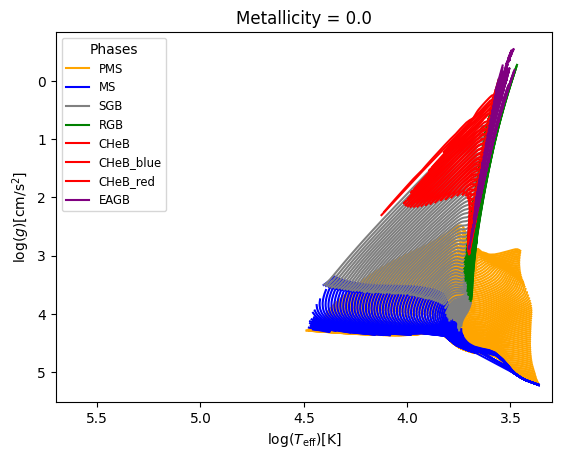

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['logAge', 'logTe', 'logg', 'label', 'metallicity', 'Mass', 'Rpol'], 
                              physical_model, rescale=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.60000,4.4269,4.356,1.0,-0.25,9.714,0.535041
1,5.65000,4.4266,4.355,1.0,-0.25,9.714,0.535800
2,5.70000,4.4263,4.353,1.0,-0.25,9.714,0.536558
3,5.75000,4.4061,4.358,1.0,-0.25,8.856,0.514282
4,5.75000,4.4260,4.352,1.0,-0.25,9.714,0.537441
...,...,...,...,...,...,...,...
321691,10.25002,3.6561,2.334,4.0,0.50,0.805,1.005181
321692,10.25002,3.6560,2.333,4.0,0.50,0.805,1.005609
321693,10.25002,3.6559,2.331,4.0,0.50,0.805,1.006466
321694,10.25002,3.6558,2.330,4.0,0.50,0.805,1.006894


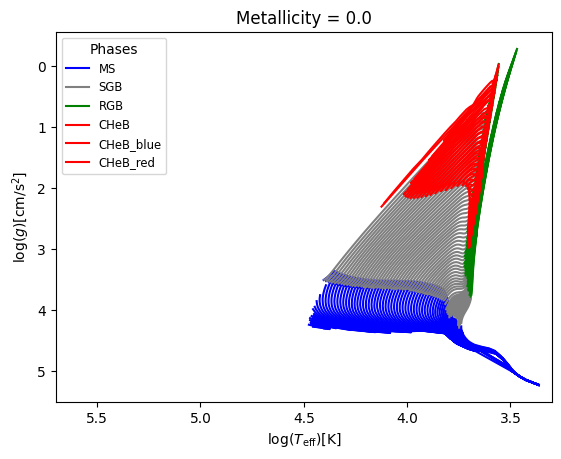

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

logAge  : Range : 5.3 - 10.25, Mean : 9.0428, Median : 9.3

logTe  : Range : 3.36 - 4.5177, Mean : 3.7779, Median : 3.721

logg  : Range : -0.38 - 5.345, Mean : 2.7607, Median : 2.486

Values in label column : 1.0, 2.0, 3.0, 4.0, 5.0, 6.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.25, -2.5, -2.75, 0.0, 0.25, 0.5 

Mass  : Range : 0.09 - 13.952, Mean : 2.6725, Median : 1.428

Rpol  : Range : -0.98 - 2.8373, Mean : 0.9648, Median : 1.0158



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['logAge', 'metallicity', 'Mass'], 
                               y_cols=['logTe', 'logg', 'Rpol'], categories_cols=['label'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the logTe parameter : 3.3621 - 4.5177
Median value in train data for the logTe parameter: 3.721
Mean value in train data for the logTe parameter: 3.777965141417156

Range in train data for the logg parameter : -0.384 - 5.345
Median value in train data for the logg parameter: 2.486
Mean value in train data for the logg parameter: 2.761182341921151

Range in train data for the Rpol parameter : -0.9763360818022064 - 2.8372727025023003
Median value in train data for the Rpol parameter: 1.015778756389041
Mean value in train data for the Rpol parameter: 0.9646120024510401

Testing set statistics:
Range in test data for the logTe parameter : 3.3622 - 4.5177
Median value in test data for the logTe parameter: 3.721
Mean value in test data for the logTe parameter: 3.777738115487914

Range in test data for the logg parameter : -0.347 - 5.345
Median value in test data for the logg parameter: 2.486
Mean value in test data for the logg parameter: 2.75

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.5972935142833506
  RMSE :  0.21520507056815552
  MAE :  0.18085985421232806
  MedAE :  0.13710958116435168
  CORR :  0.8536445700543505
  MAX_ER :  0.5457108330954199
  Percentiles : 
    75th percentile :  0.25534547589331325
    90th percentile :  0.36302149223386926
    95th percentile :  0.4185466141170249
    99th percentile :  0.4829834191514341

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.24580413337093776
  RMSE :  0.1576451482232069
  MAE :  0.12579879104003253
  MedAE :  0.10439328495368505
  CORR :  0.4981012250059749
  MAX_ER :  0.5110059990754348
  Percentiles : 
    75th percentile :  0.1783565552448345
    90th percentile :  0.26213247555570907
    95th percentile :  0.312902760589567
    99th per

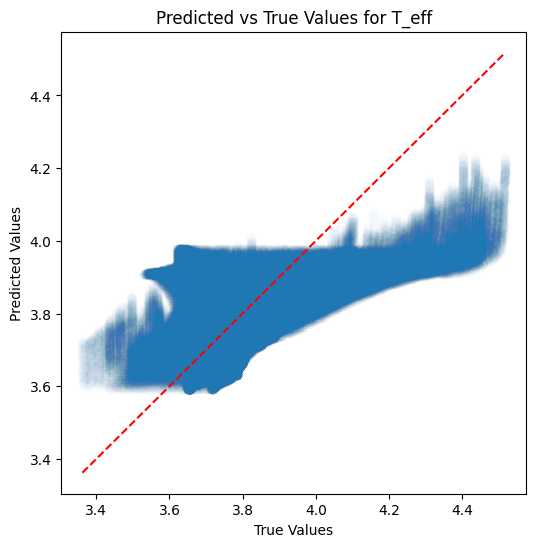

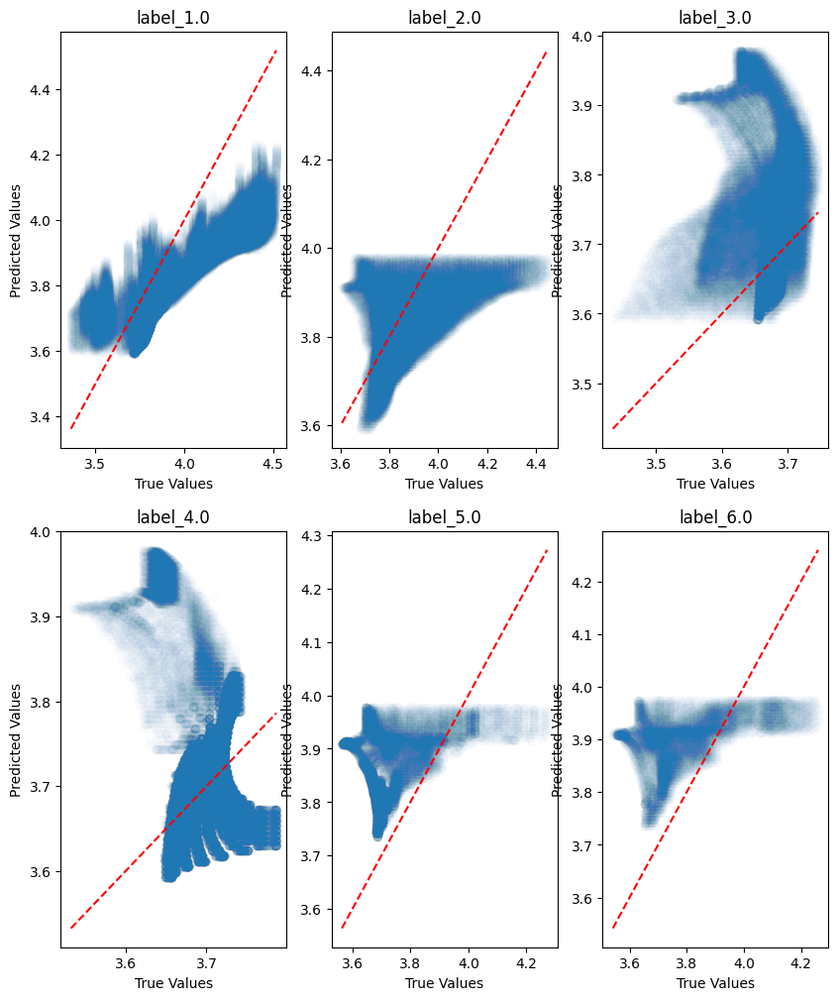

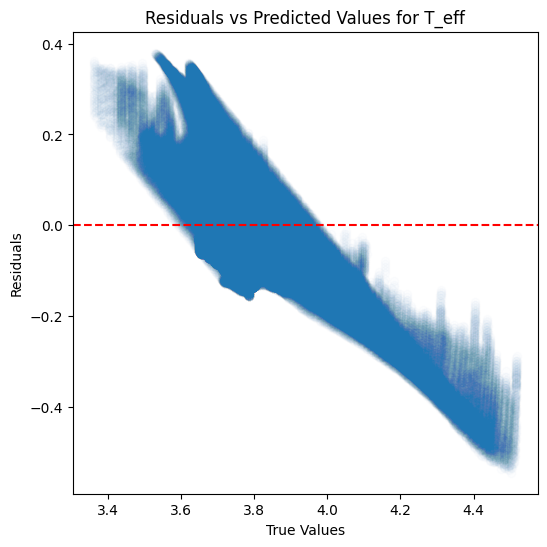

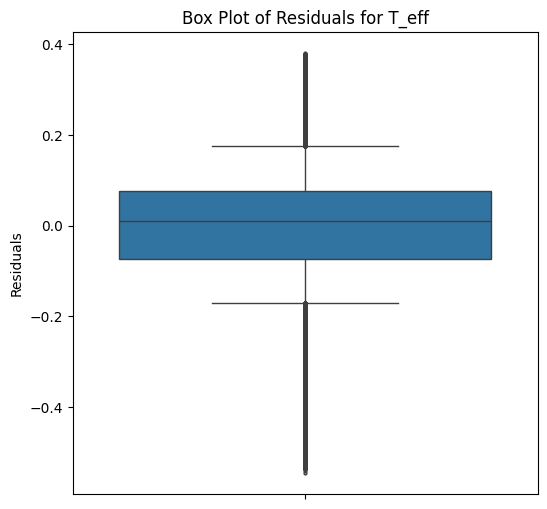

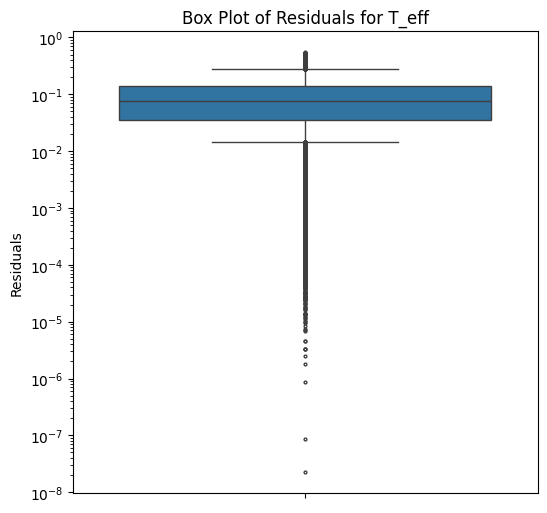

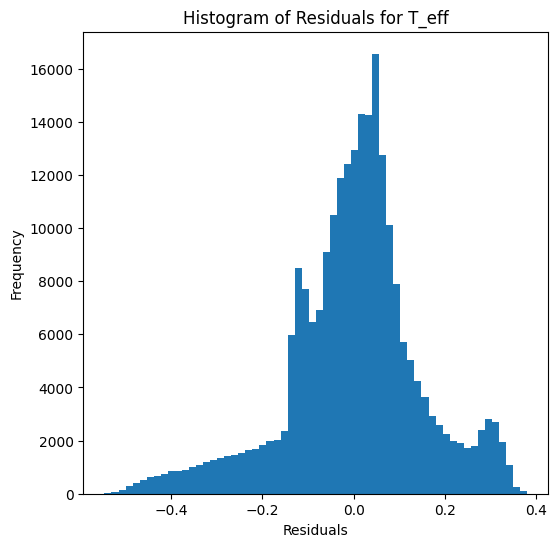

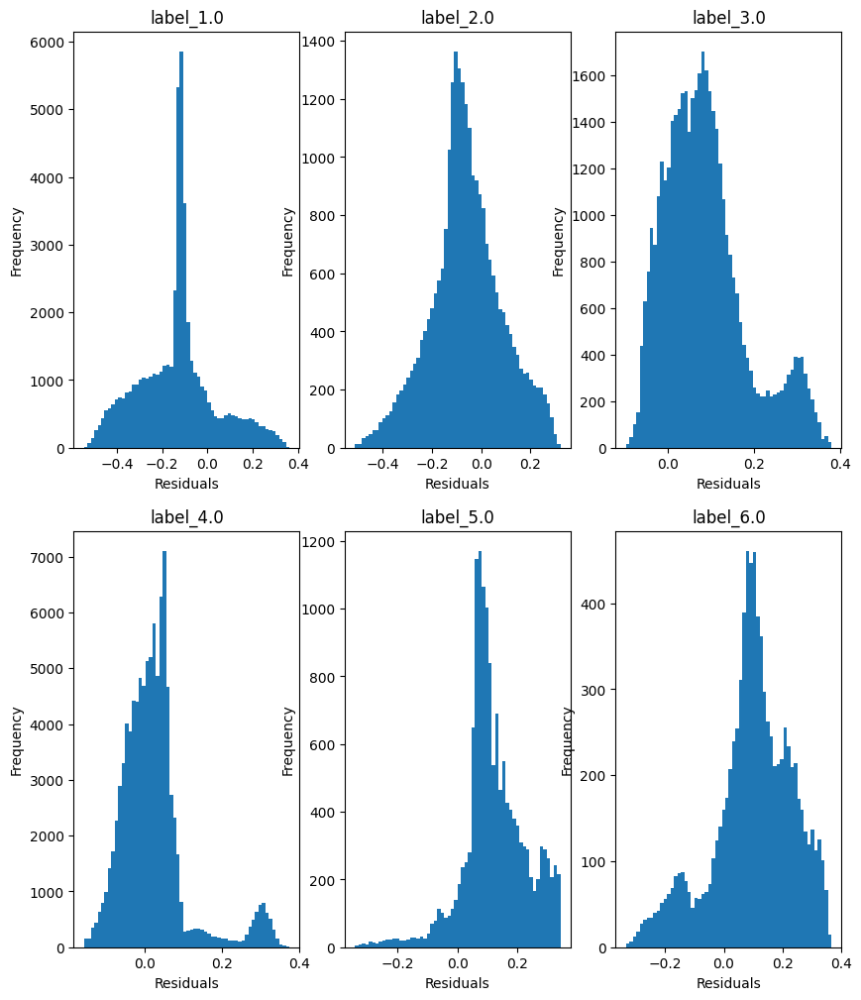

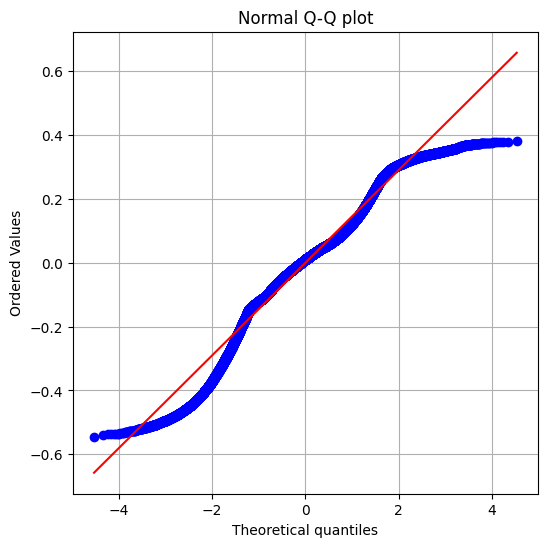

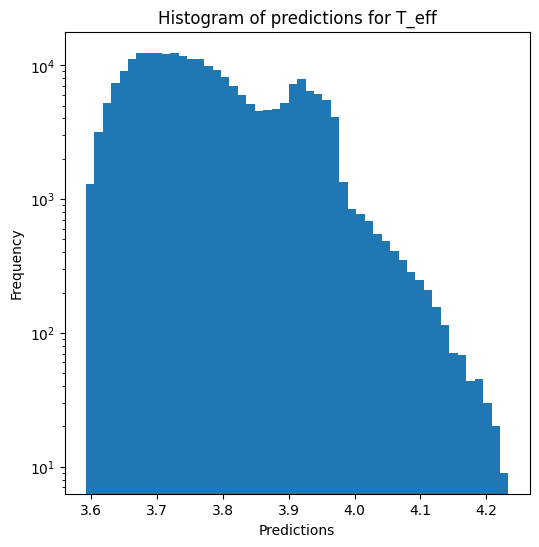

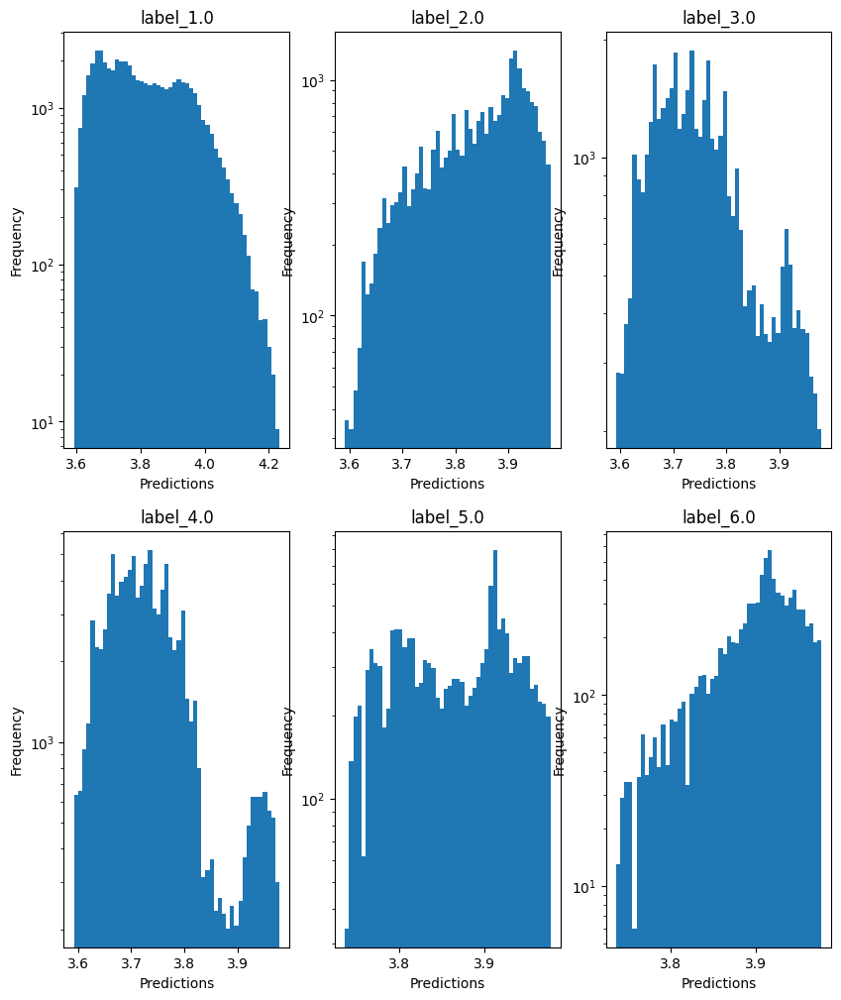

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -1.2252488306693623
  RMSE :  1.4736793628520009
  MAE :  1.3839826888369213
  MedAE :  1.3188292728887434
  CORR :  0.33703567351468366
  MAX_ER :  3.3549603792321725
  Percentiles : 
    75th percentile :  1.743789821291447
    90th percentile :  2.0282767393808094
    95th percentile :  2.2758345044349695
    99th percentile :  2.7985041859212947

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.2072914562504582
  RMSE :  0.8048821107535786
  MAE :  0.6640426255529678
  MedAE :  0.6125379386597425
  CORR :  0.4931048794061351
  MAX_ER :  2.8883783643648364
  Percentiles : 
    75th percentile :  0.9395609240965072
    90th percentile :  1.2405064488793103
    95th percentile :  1.477576662682882
    99th percentile :  2.0984553338284426

log_g results for the label category with a value of 3.0
  value range :  -0.384 -

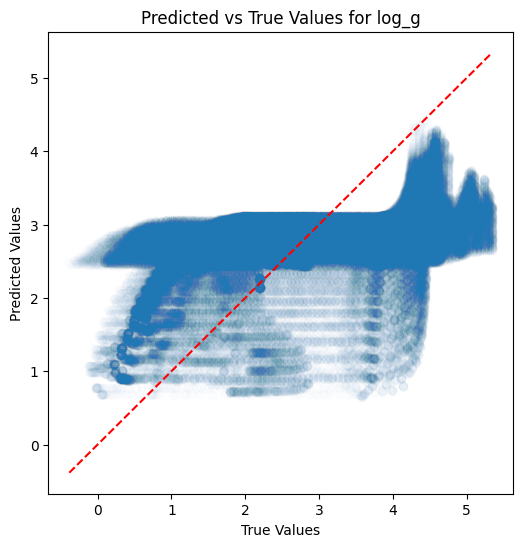

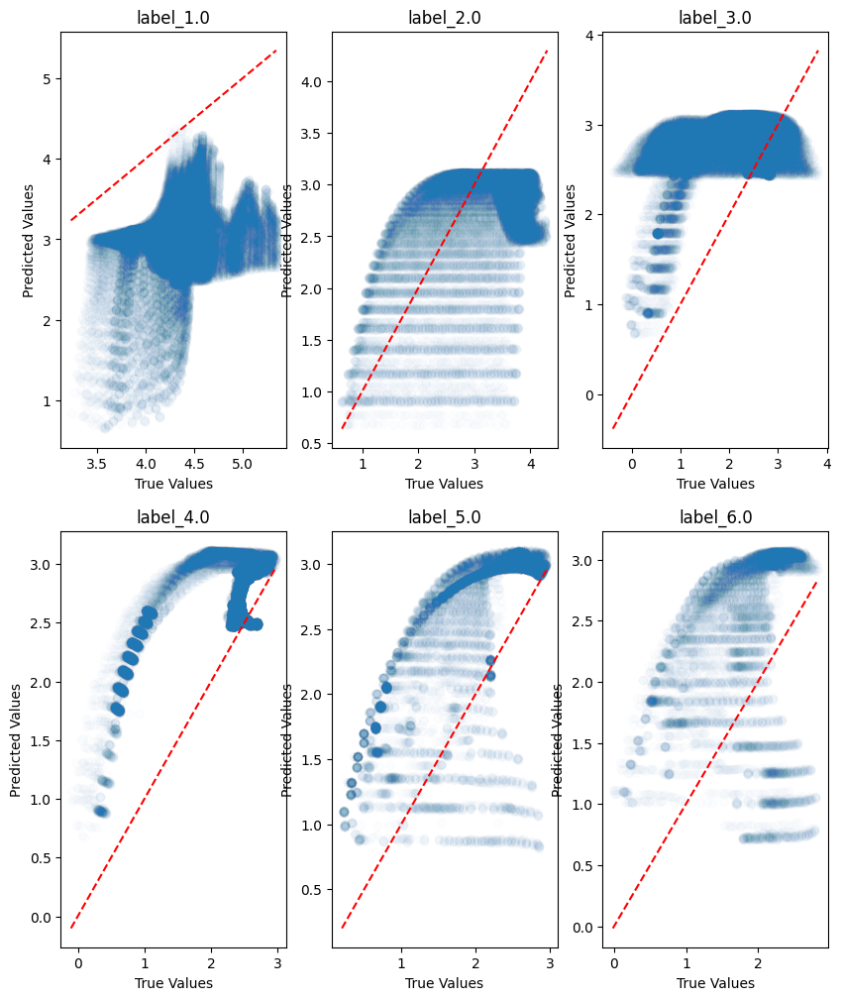

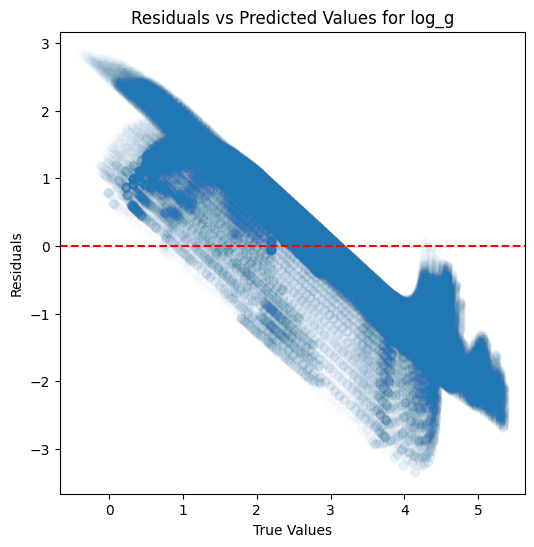

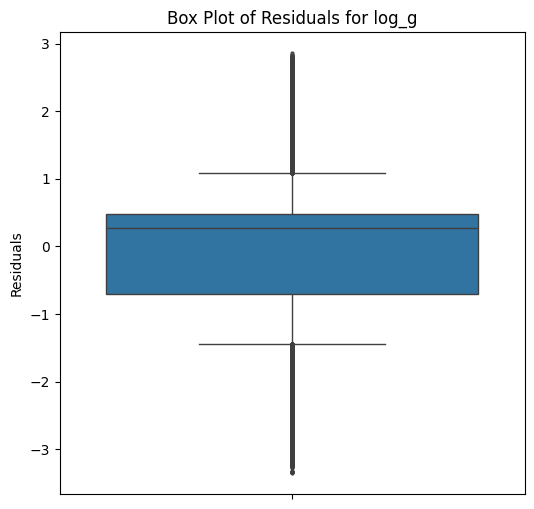

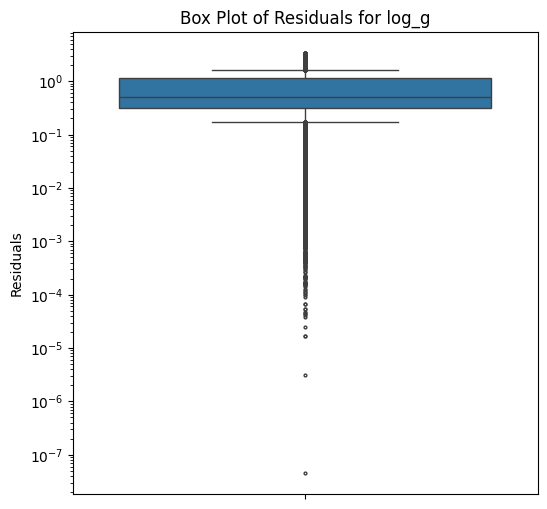

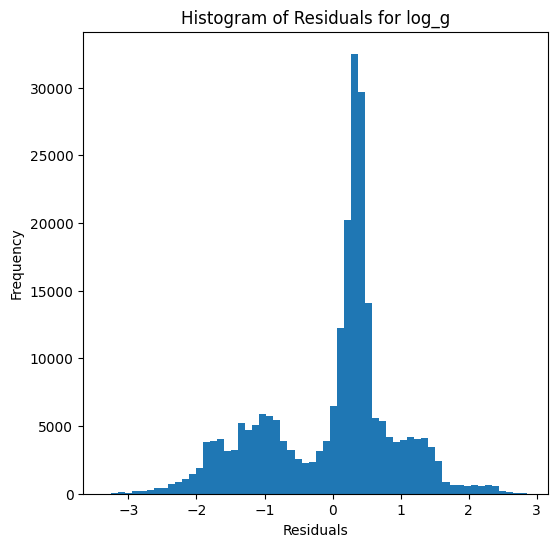

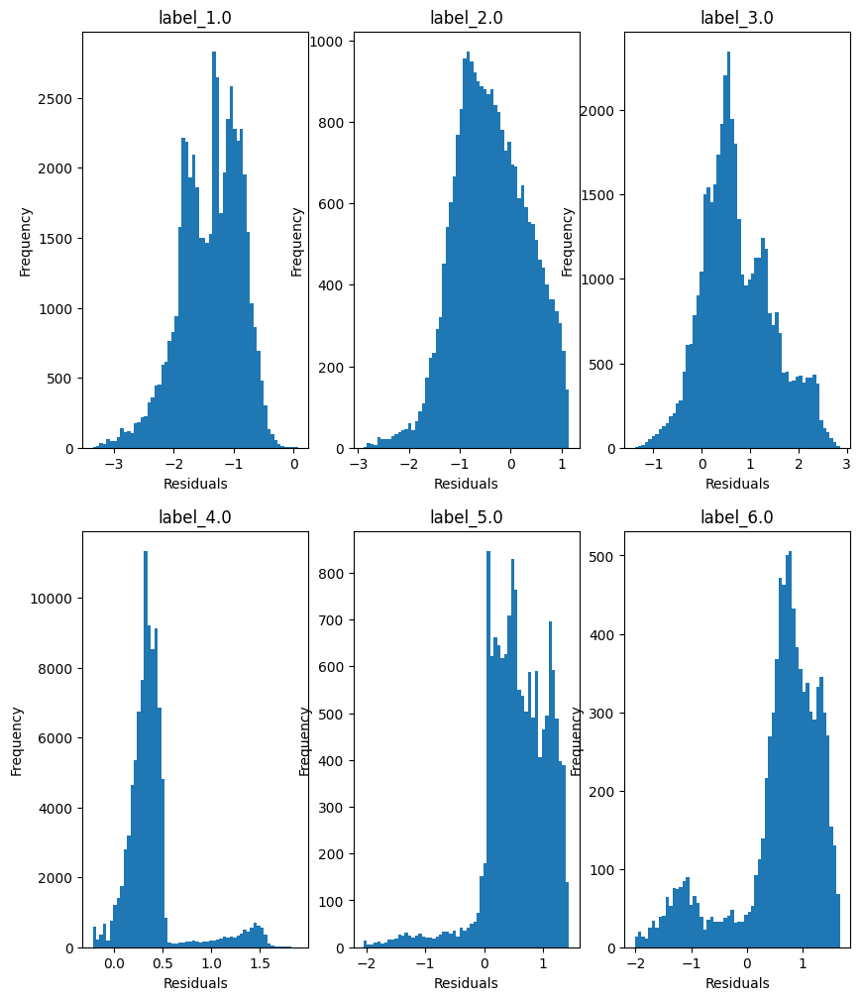

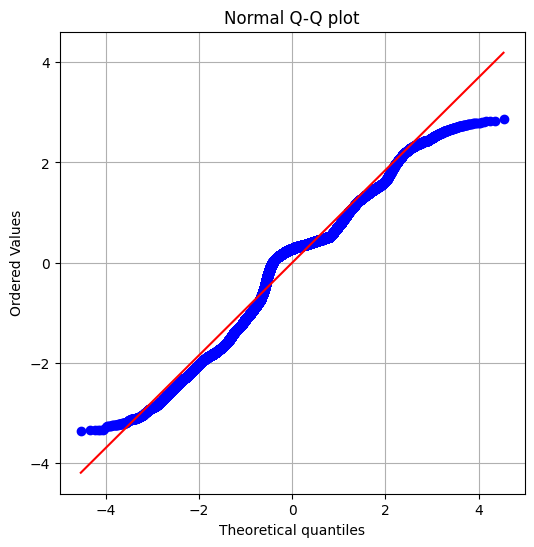

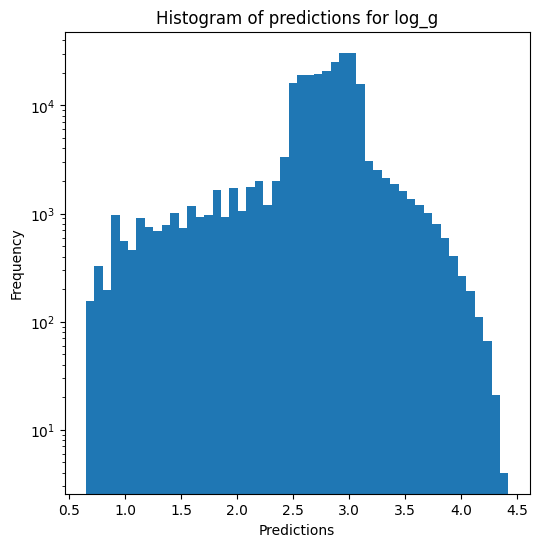

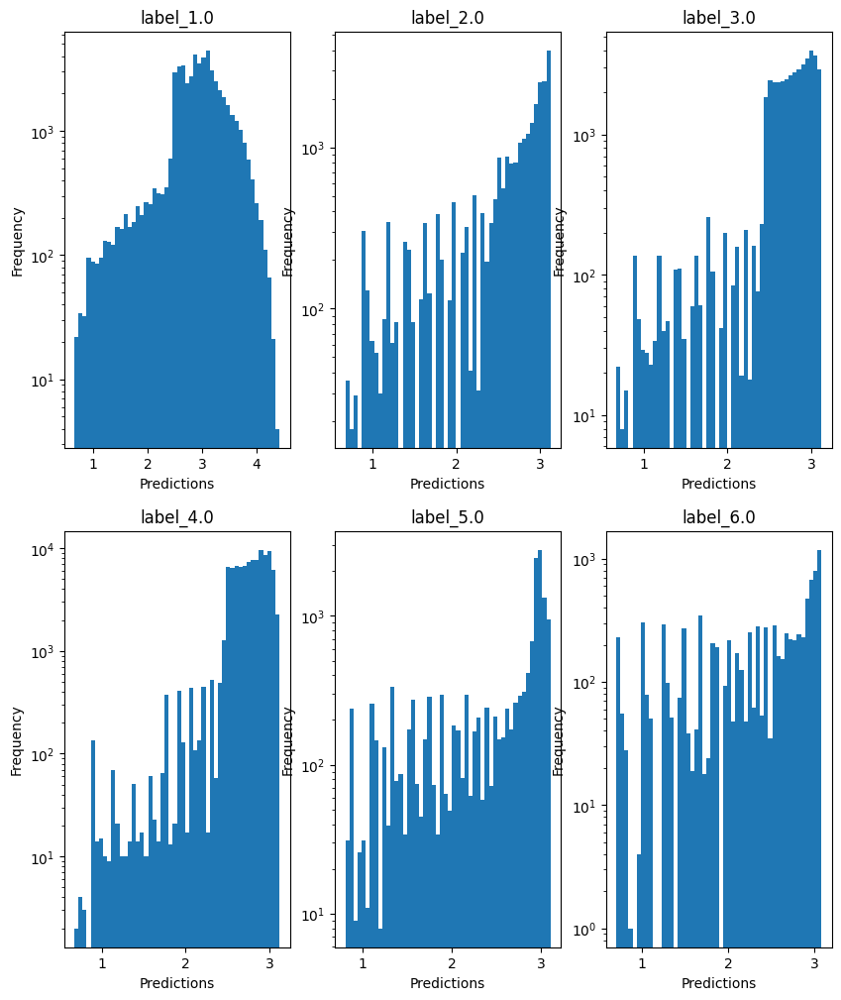

no negative values

radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.2911261433374712
  RMSE :  0.8081240809408462
  MAE :  0.7470748806992422
  MedAE :  0.6753730792439623
  CORR :  0.6331630624513411
  MAX_ER :  1.7812591617639206
  Percentiles : 
    75th percentile :  0.9105479237212716
    90th percentile :  1.1883968356082537
    95th percentile :  1.3936709269906973
    99th percentile :  1.6244809350169362

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5386038834226299
  RMSE :  0.4046513536710141
  MAE :  0.3308070192533626
  MedAE :  0.29952362119226816
  CORR :  0.7362360964966705
  MAX_ER :  1.5436503239882857
  Percentiles : 
    75th percentile :  0.46920249407093234
    90th percentile :  0.6186982056963992
    95th percentile :  0.7463942959706643
    99th percentile :  1.0989554301480768

radius results for the lab

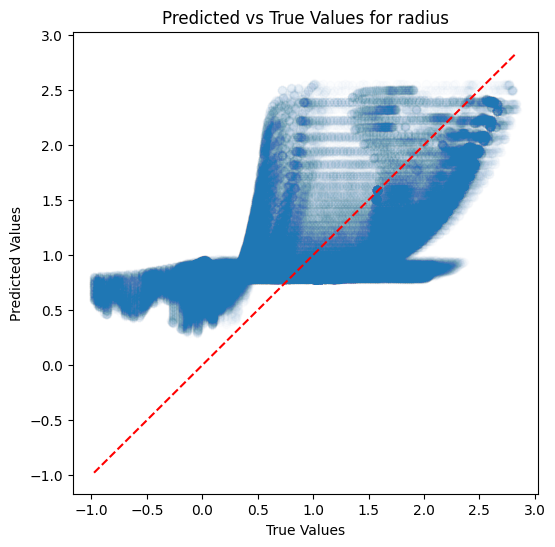

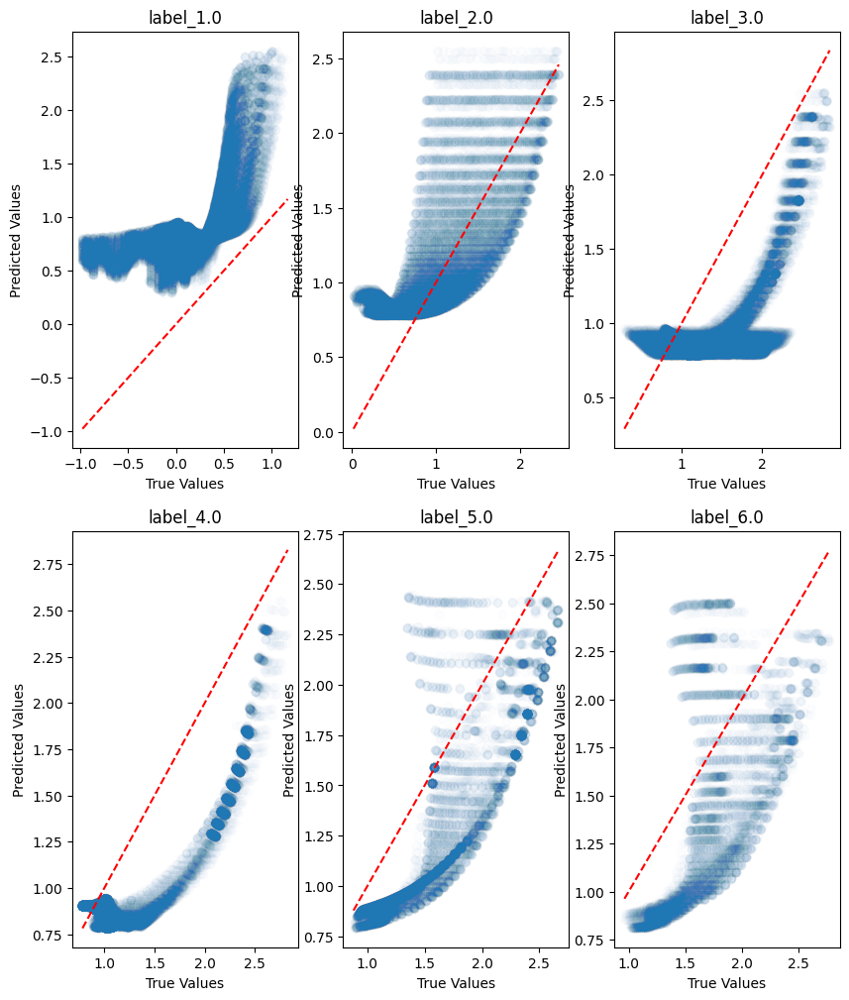

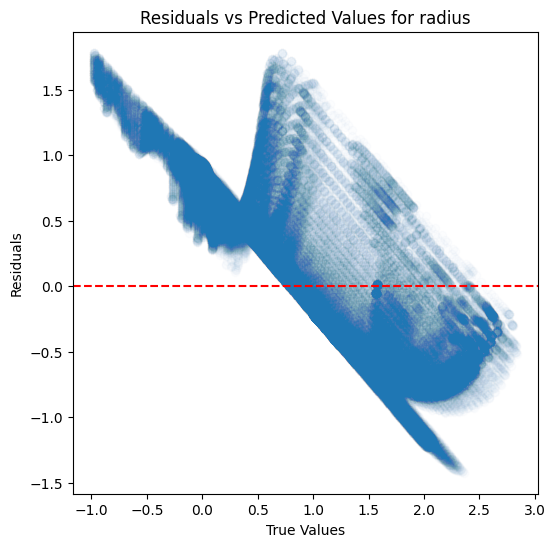

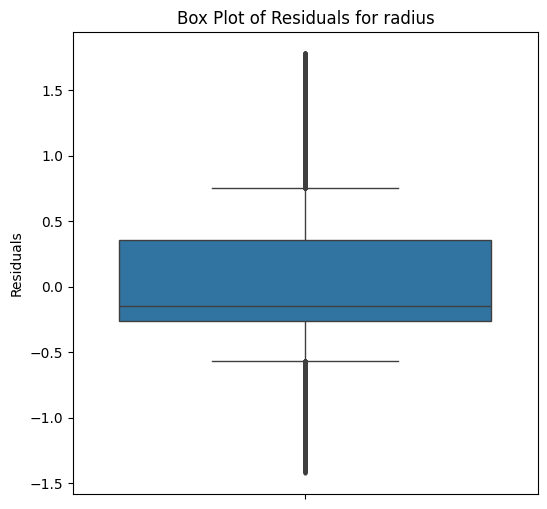

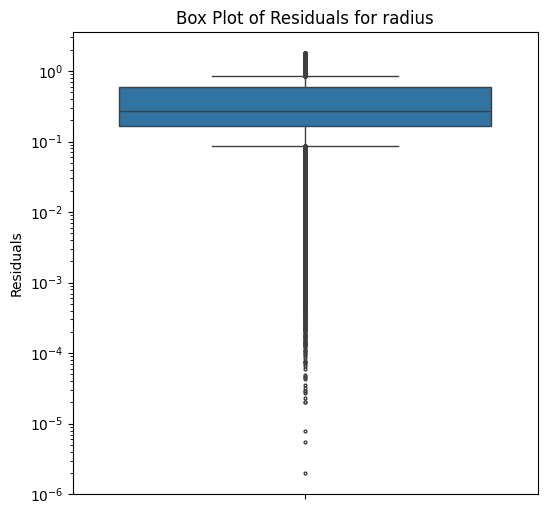

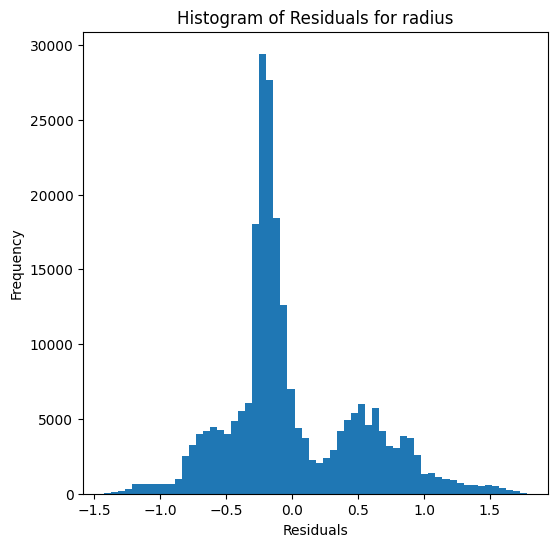

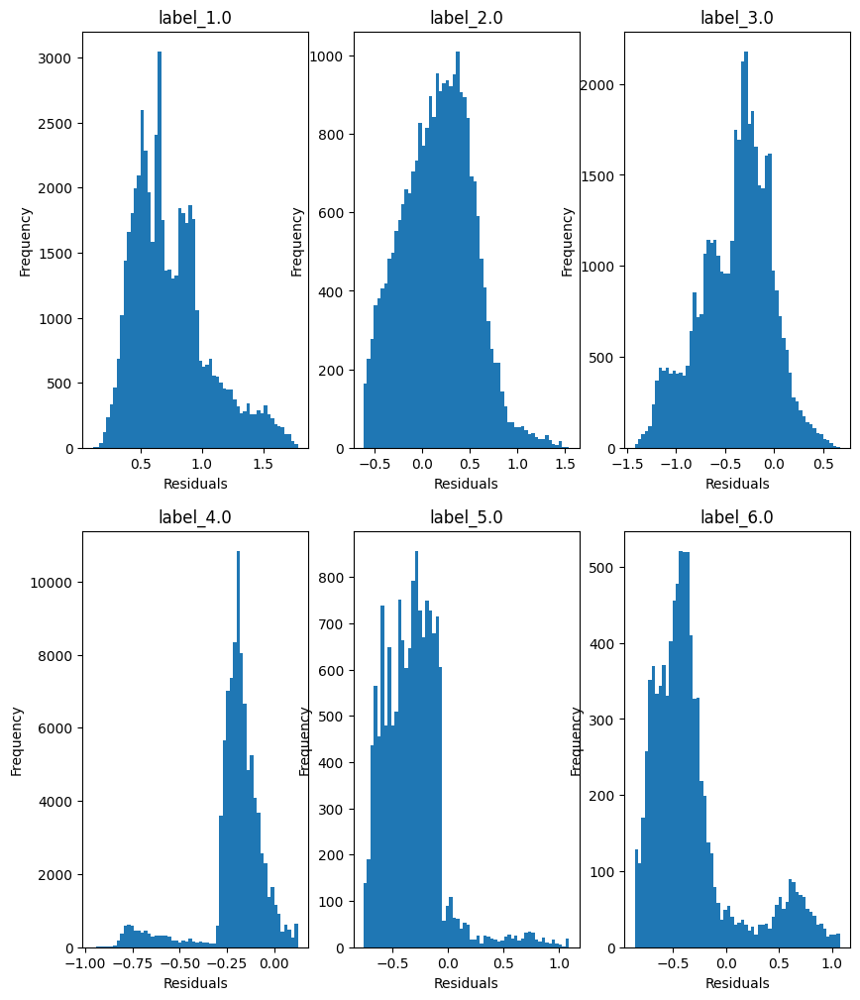

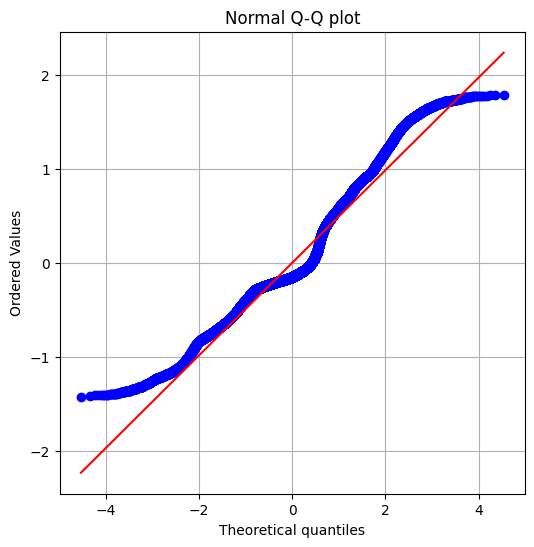

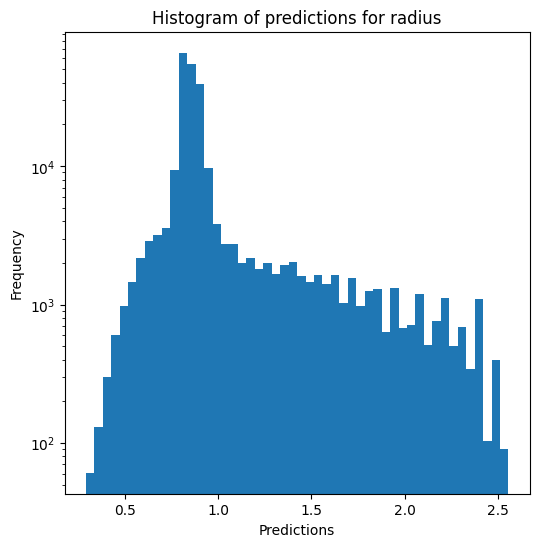

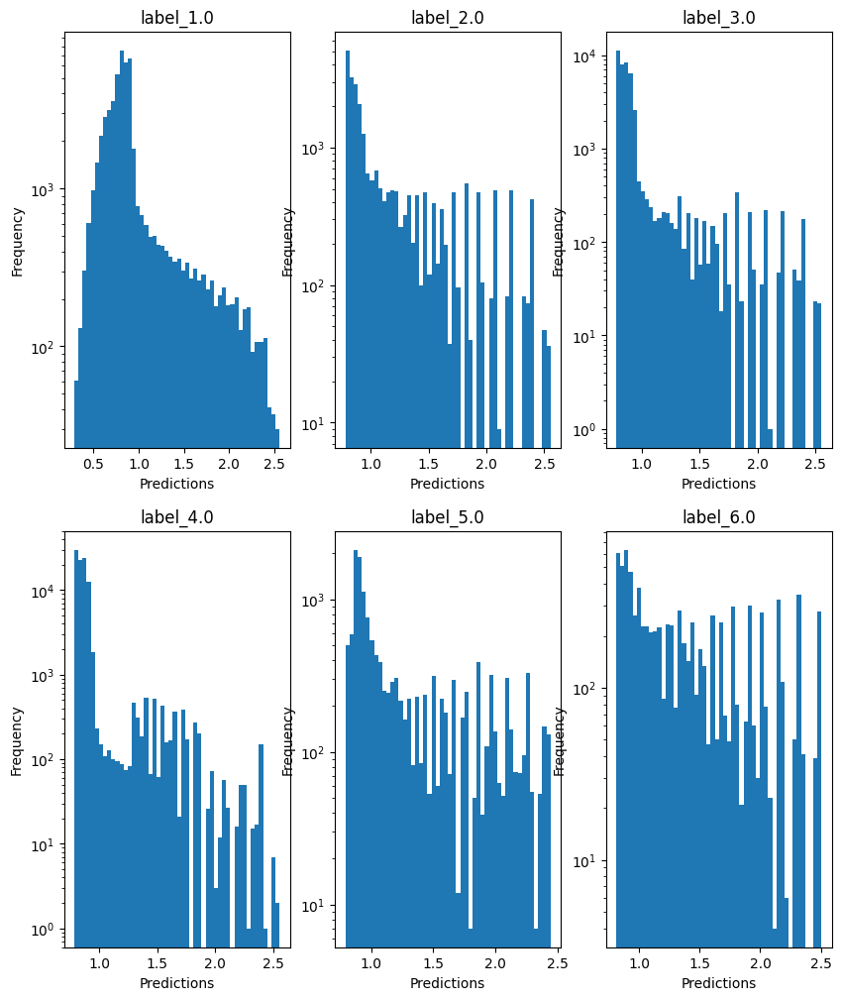

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...


c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9749175674559253
  RMSE :  0.042317808029750464
  MAE :  0.007419384184002267
  MedAE :  4.999999999988347e-05
  CORR :  0.9876376203354993
  MAX_ER :  0.8311642857142858
  Percentiles : 
    75th percentile :  0.001100000000000101
    90th percentile :  0.009799999999999365
    95th percentile :  0.024499999999999744
    99th percentile :  0.14124999999999988

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.8732613574498688
  RMSE :  0.0623778883257484
  MAE :  0.03379379673404681
  MedAE :  0.015200000000000324
  CORR :  0.944561942380967
  MAX_ER :  0.8240999999999996
  Percentiles : 
    75th percentile :  0.03721571428571446
    90th percentile :  0.08631128571428581
    95th percentile :  0.14280021551724115
    99th percentile :  0.23957199999999995

T_eff results for the label category with a value of 3.0
  

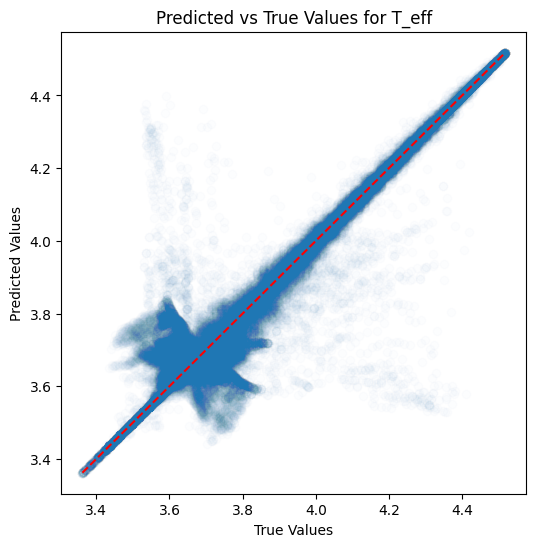

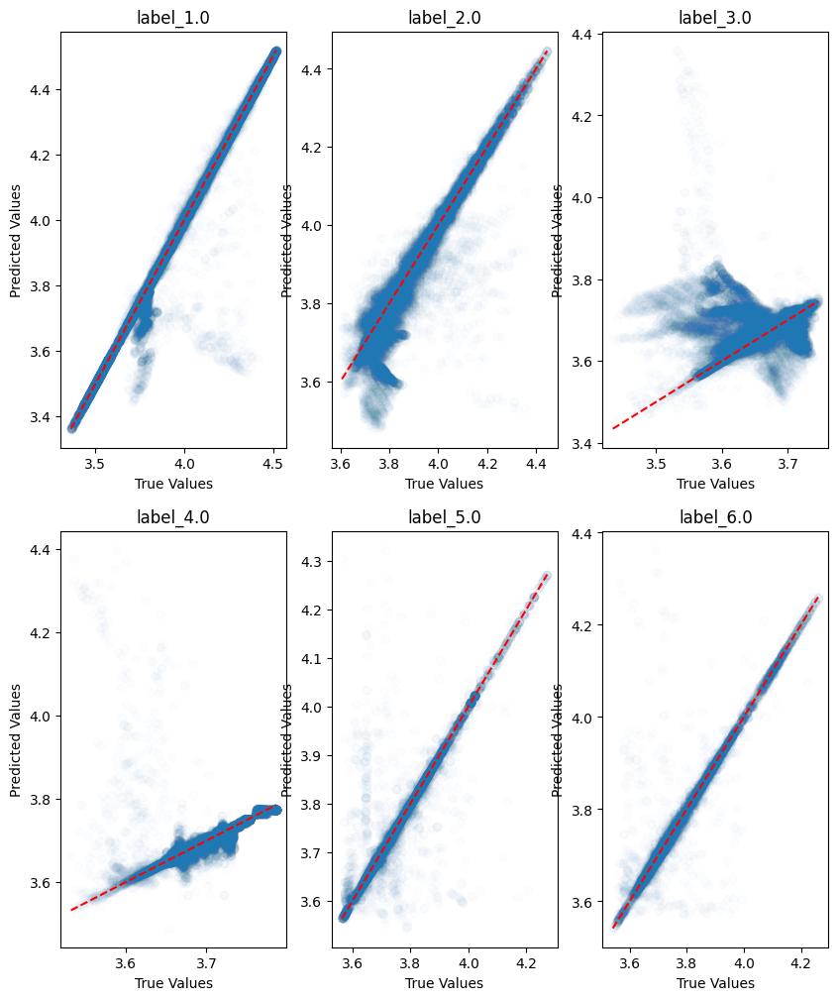

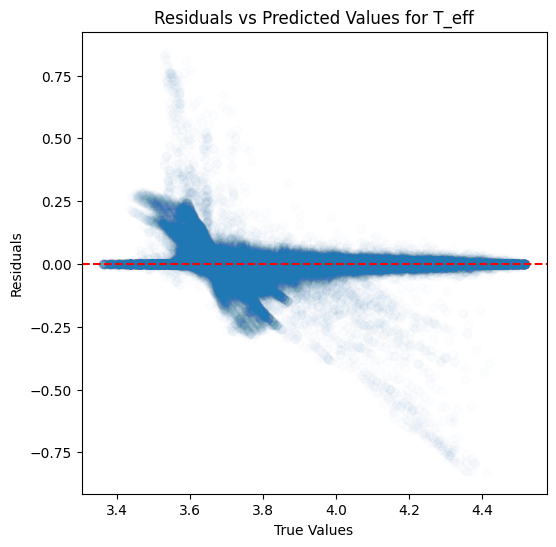

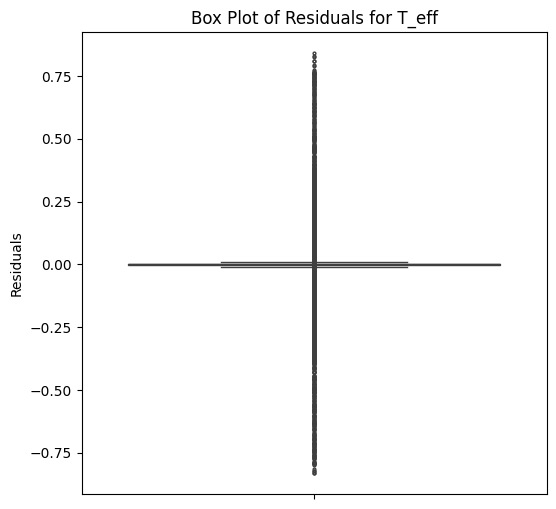

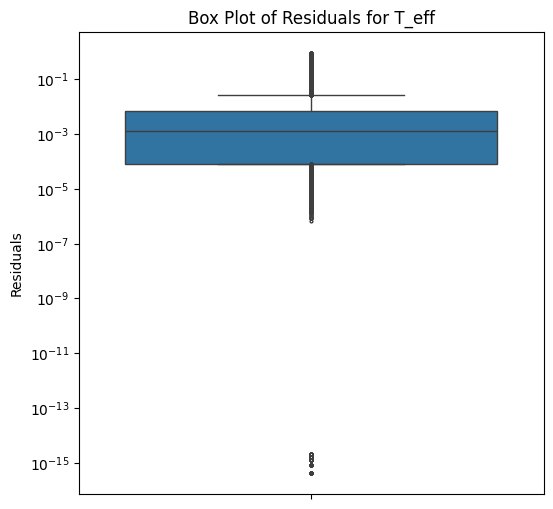

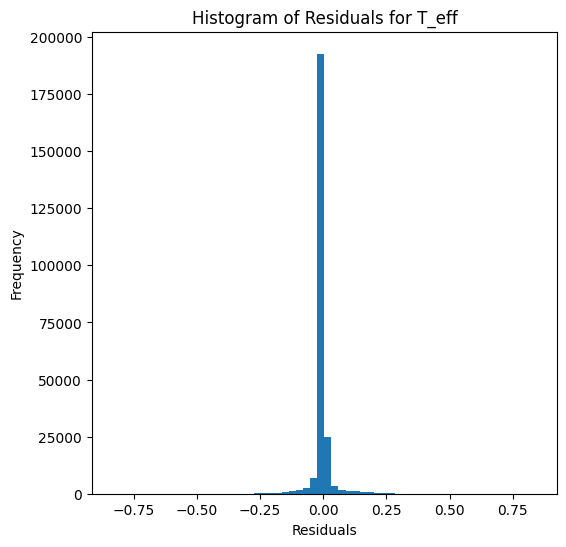

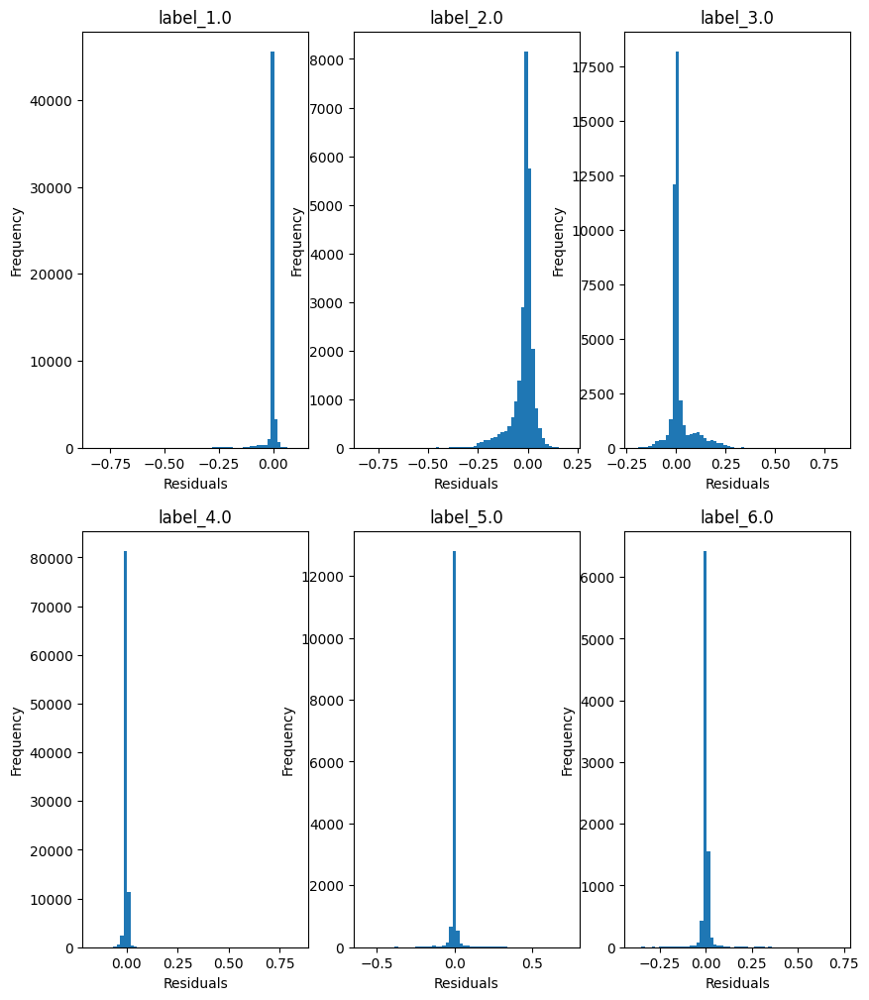

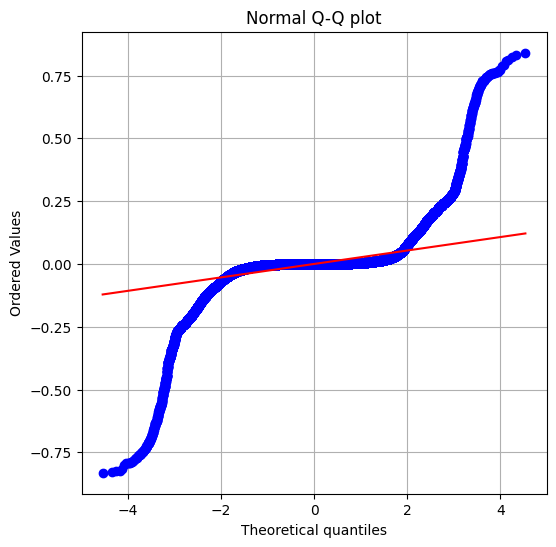

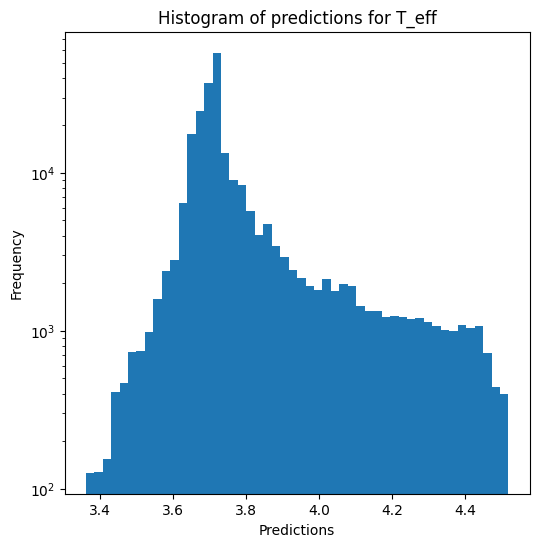

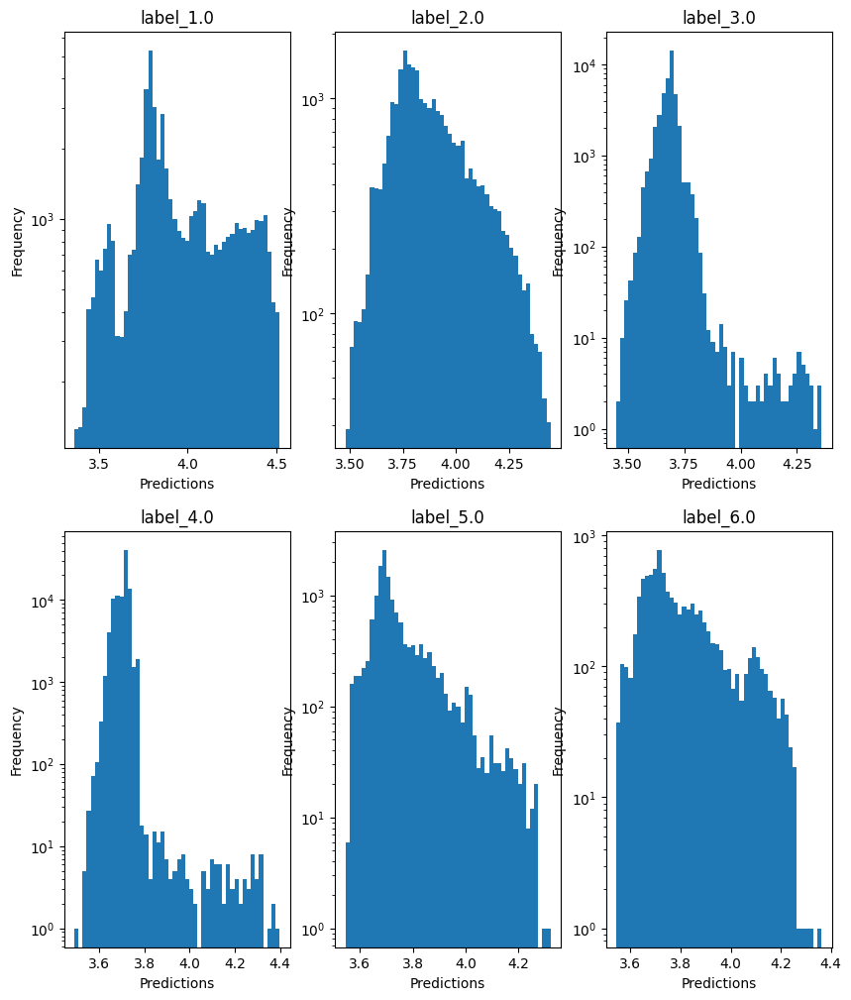

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.2145731255988126
  RMSE :  0.37903866685503795
  MAE :  0.06714921834859056
  MedAE :  0.0007500000000000284
  CORR :  0.7064456433814592
  MAX_ER :  4.779999999999999
  Percentiles : 
    75th percentile :  0.005999999999999783
    90th percentile :  0.0259999999999998
    95th percentile :  0.06400000000000006
    99th percentile :  1.9671749999999992

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.19817400174858324
  RMSE :  0.7576350753491503
  MAE :  0.3037153855634129
  MedAE :  0.06000000000000005
  CORR :  0.6531520090048356
  MAX_ER :  4.171
  Percentiles : 
    75th percentile :  0.15633333333333344
    90th percentile :  1.0195214285714282
    95th percentile :  1.843899999999987
    99th percentile :  3.3789300000000004

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.437

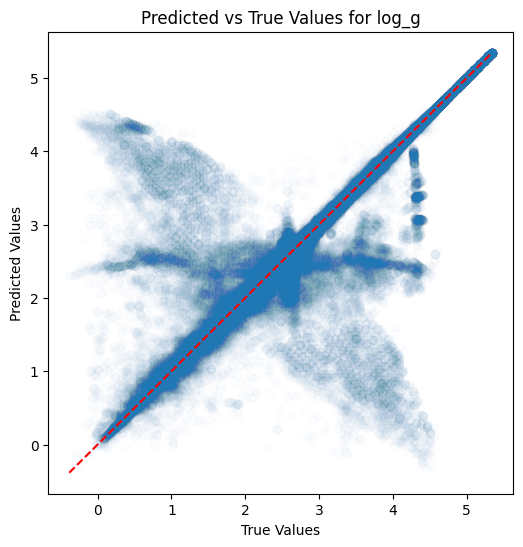

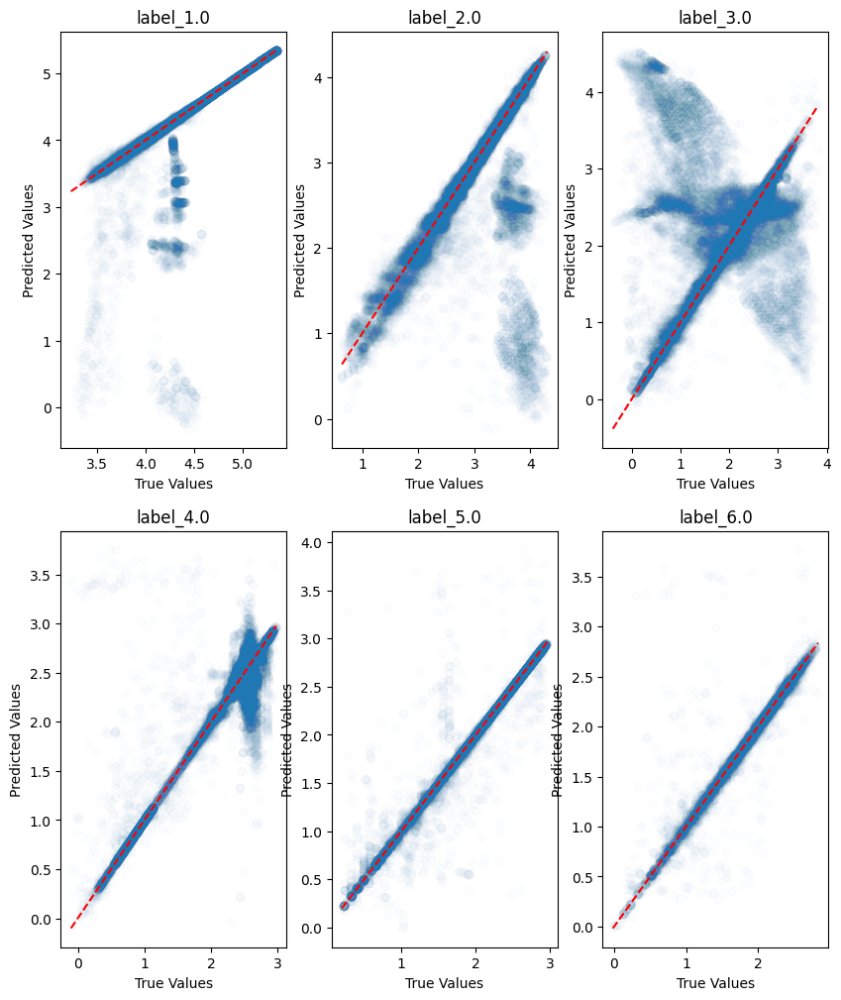

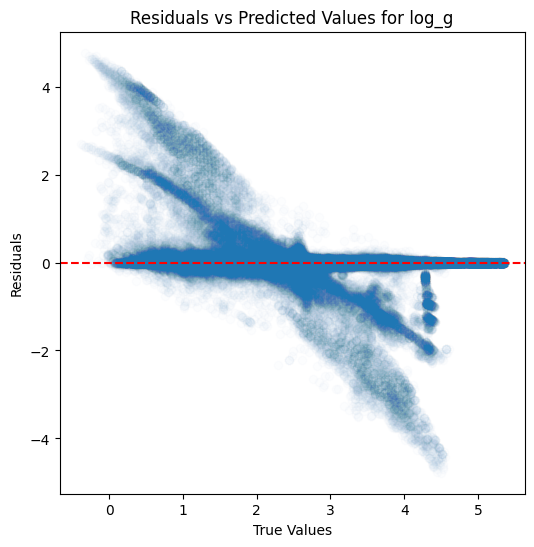

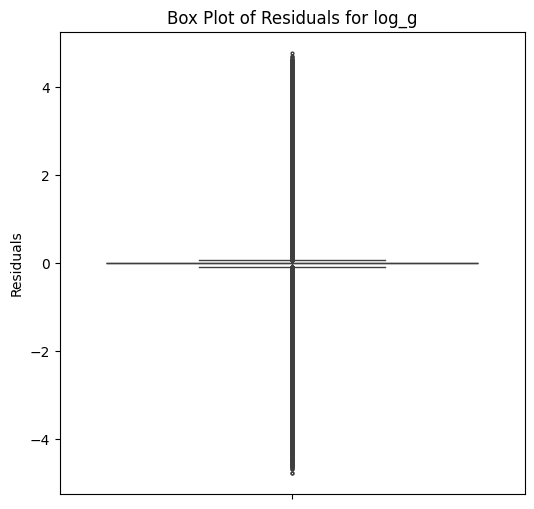

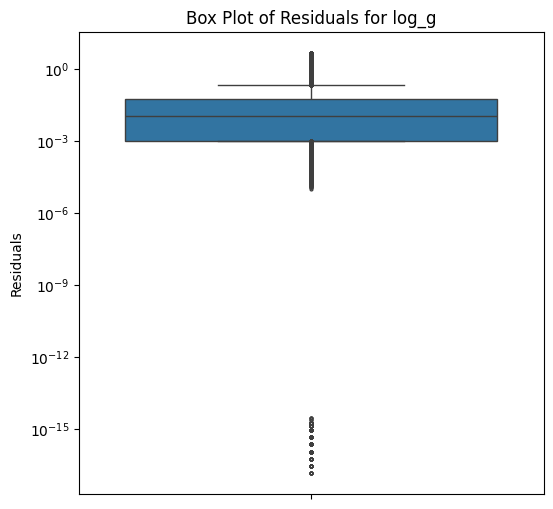

...

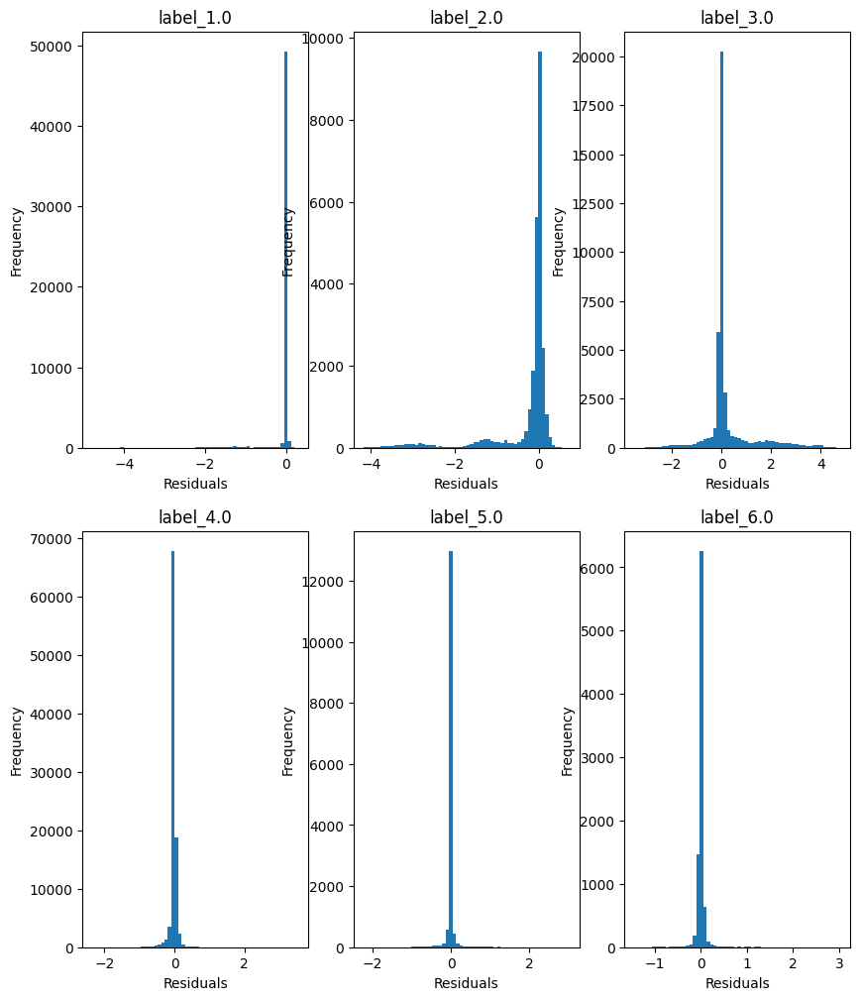

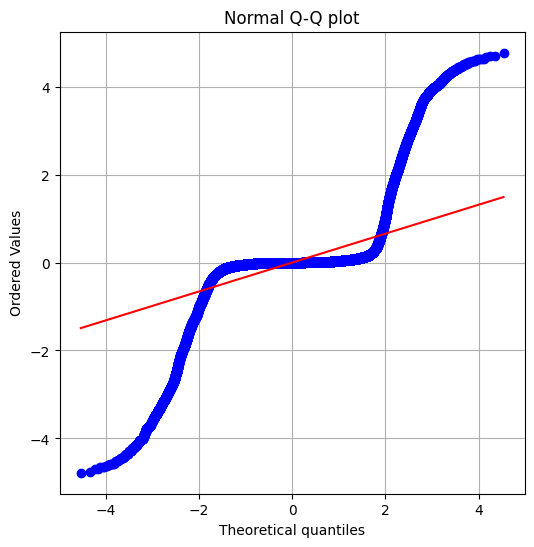

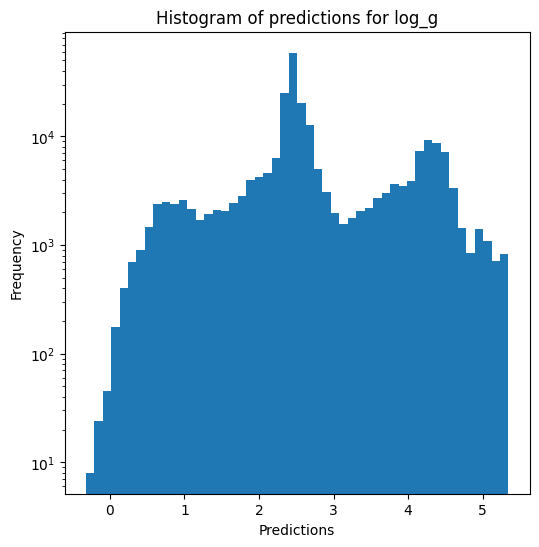

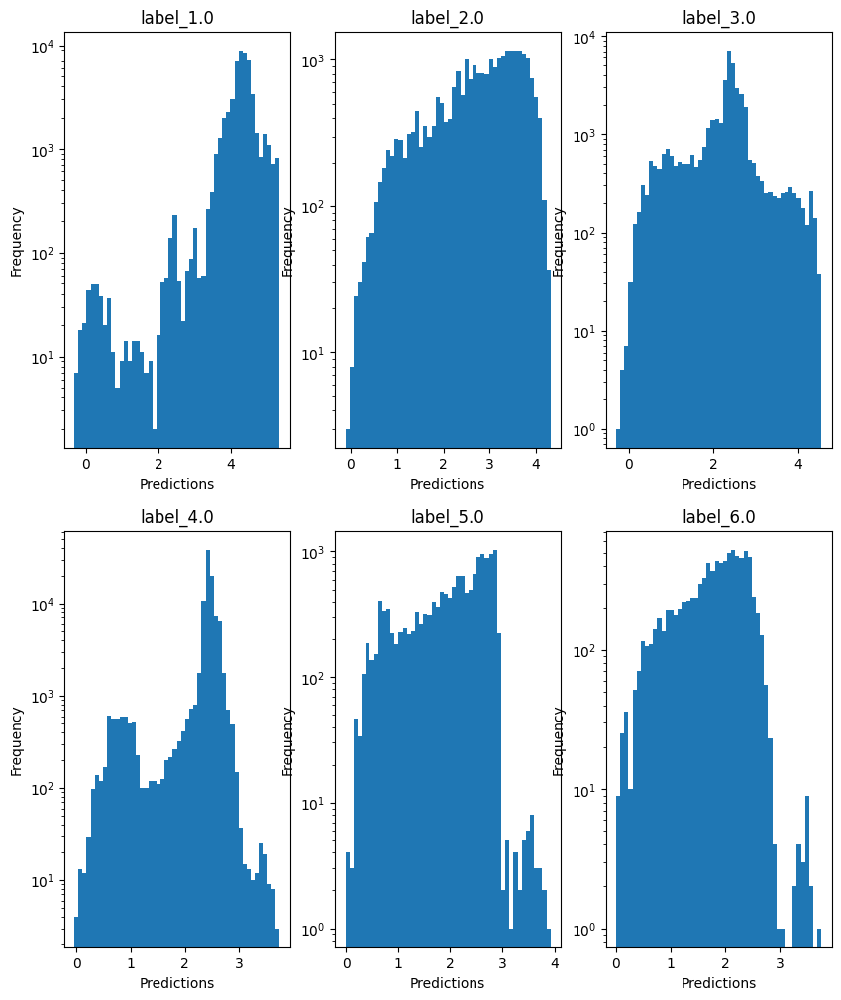

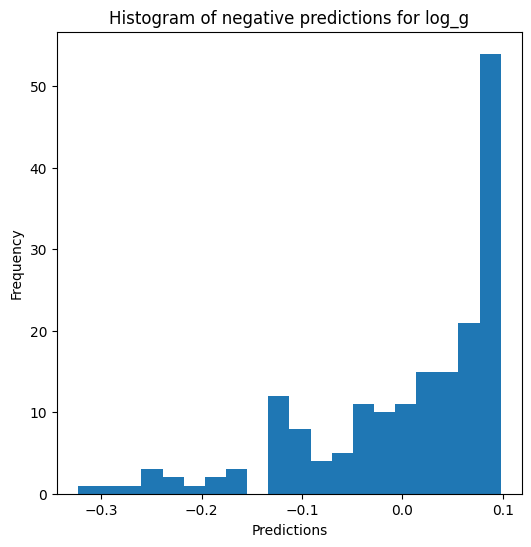

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.738281930565384
  RMSE :  0.18972009556482877
  MAE :  0.03392457937325904
  MedAE :  0.00039571253936199896
  CORR :  0.8917350869577356
  MAX_ER :  2.390815363619212
  Percentiles : 
    75th percentile :  0.0033609730967407714
    90th percentile :  0.014644852853685386
    95th percentile :  0.03409213569105707
    99th percentile :  0.9838915178375456

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5629713533272653
  RMSE :  0.3788297840704942
  MAE :  0.15192180404025168
  MedAE :  0.030175194982677955
  CORR :  0.7792945737581626
  MAX_ER :  2.0861071059413177
  Percentiles : 
    75th percentile :  0.07811498780501402
    90th percentile :  0.5094987210098482
    95th percentile :  0.9220946615038937
    99th percentile :  1.6890133702562848

radius results for the label cate

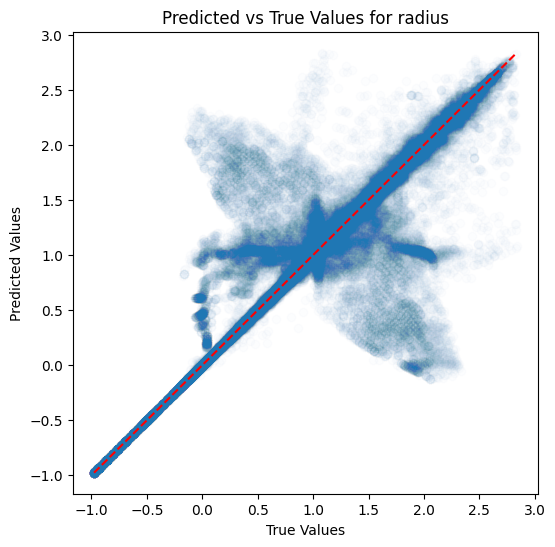

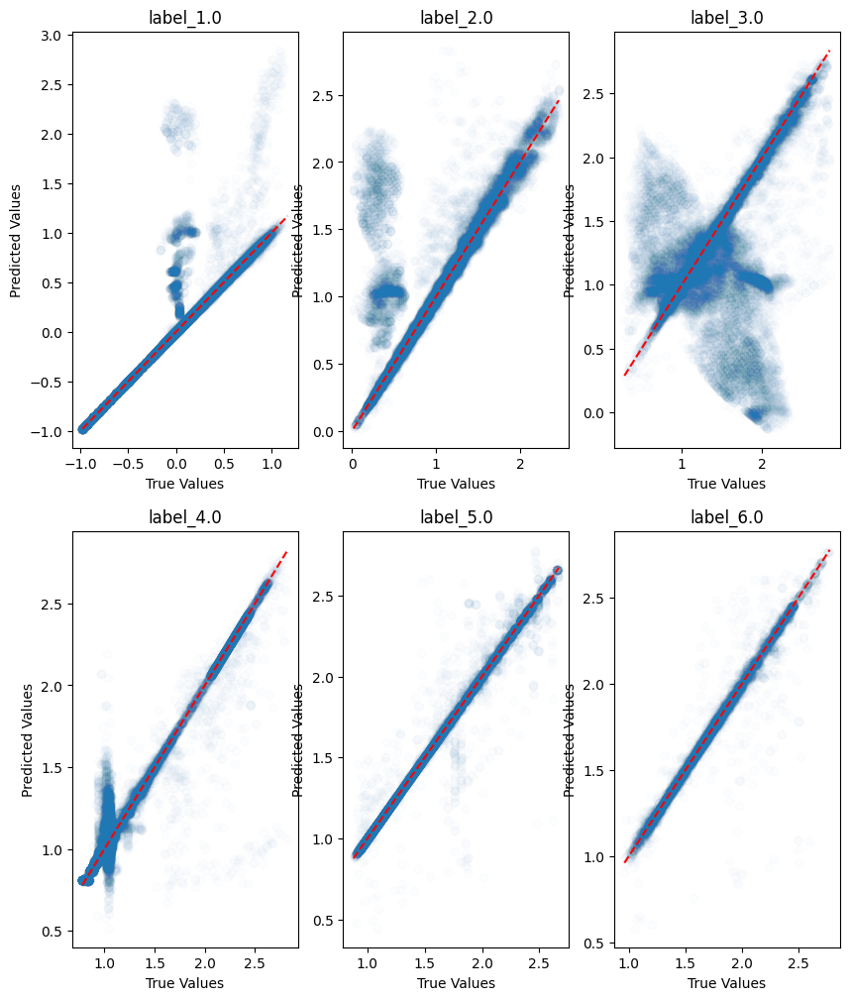

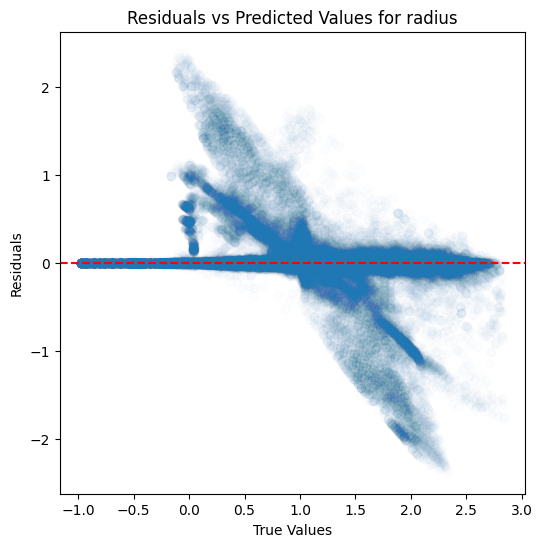

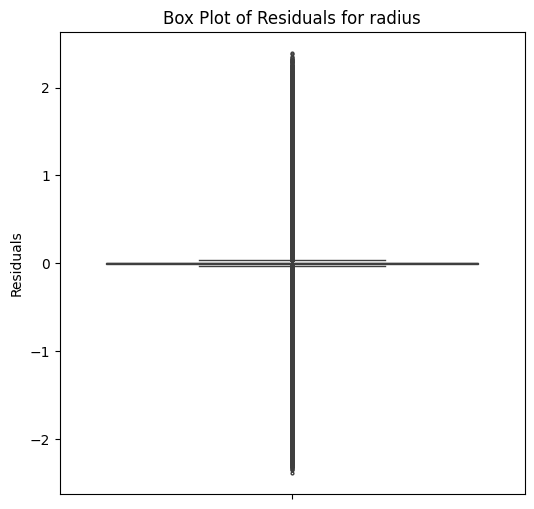

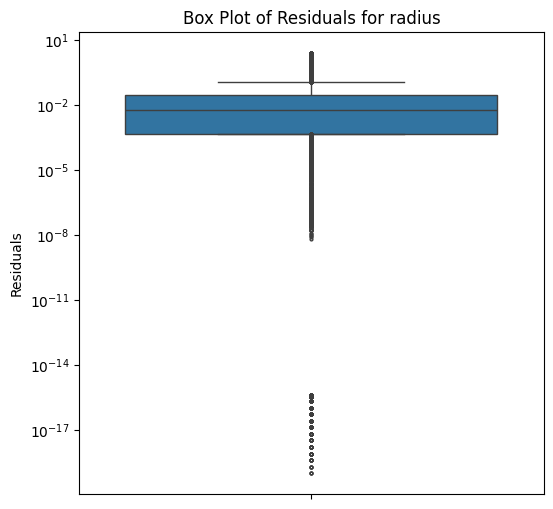

...

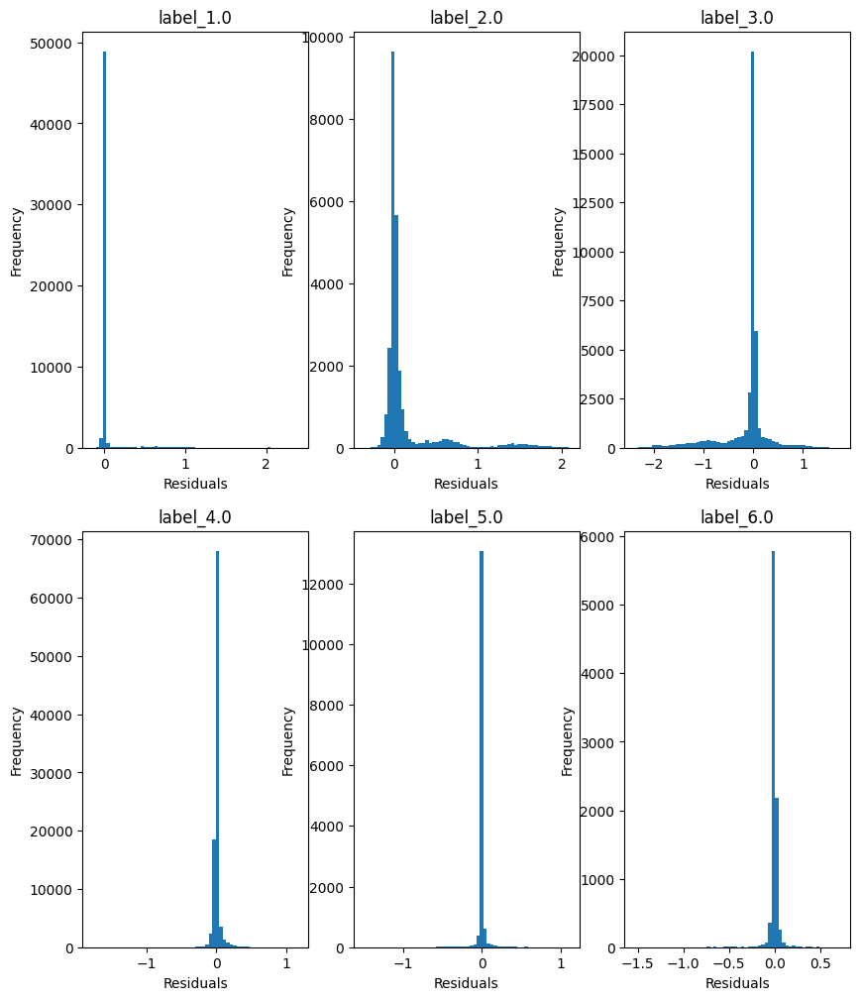

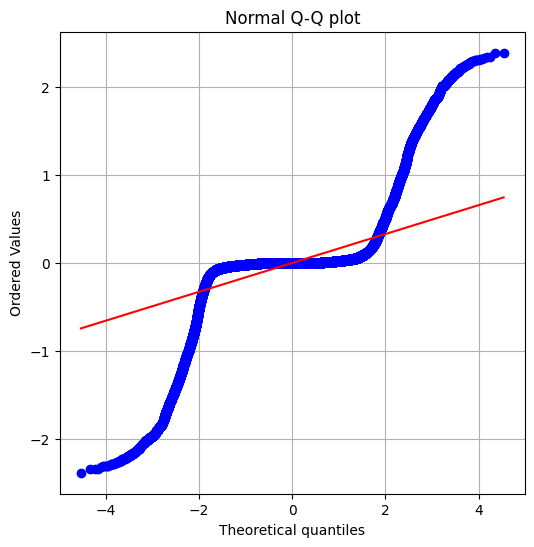

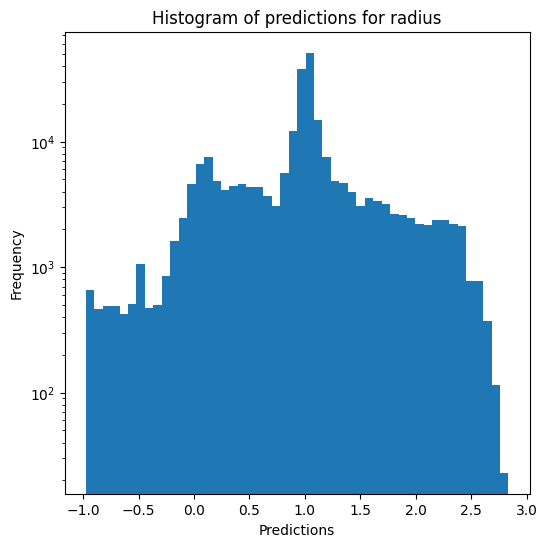

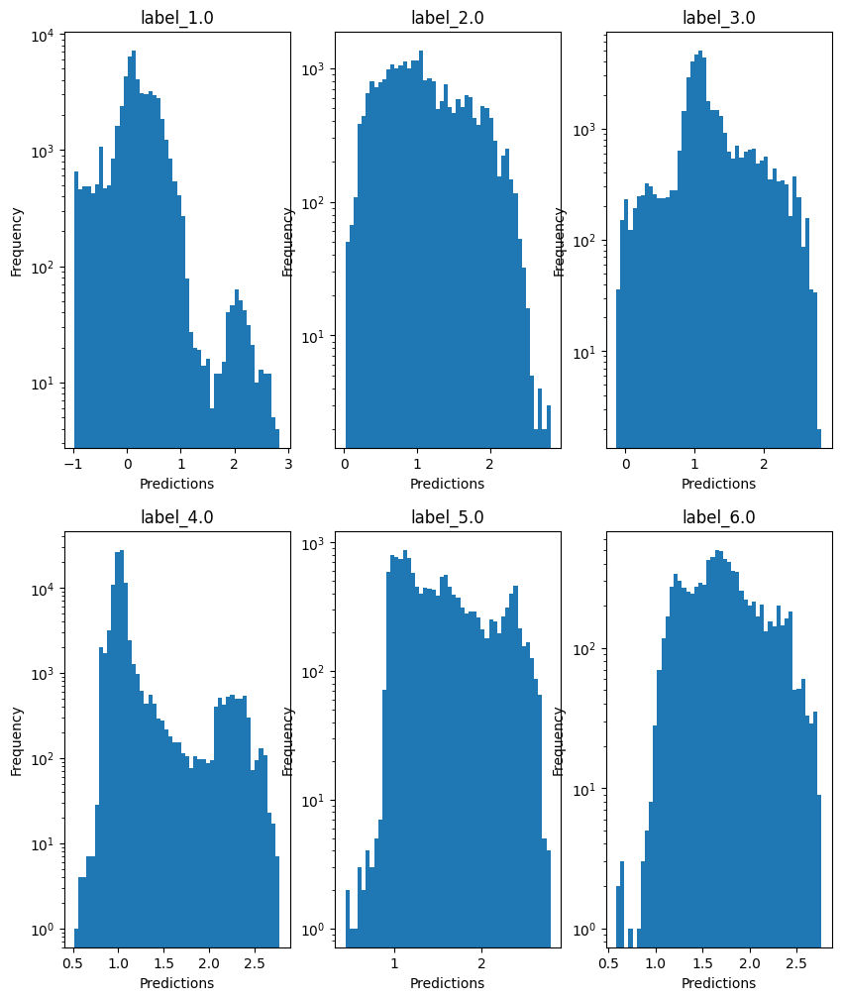

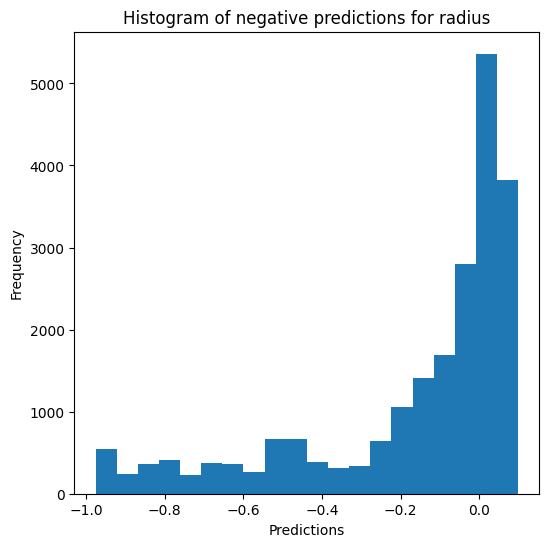

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9398271890706307
  RMSE :  0.06636006565417335
  MAE :  0.01763821551756813
  MedAE :  0.0023999999999997357
  CORR :  0.9696161034878503
  MAX_ER :  0.82918
  Percentiles : 
    75th percentile :  0.008459999999999468
    90th percentile :  0.03392000000000017
    95th percentile :  0.053894999999999804
    99th percentile :  0.3671849999999996

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9031524138115453
  RMSE :  0.05622519127212005
  MAE :  0.036226488685678855
  MedAE :  0.022459999999999702
  CORR :  0.954889302912259
  MAX_ER :  0.6363200000000004
  Percentiles : 
    75th percentile :  0.04744000000000004
    90th percentile :  0.0863460000000002
    95th percentile :  0.11669299999999971
    99th percen

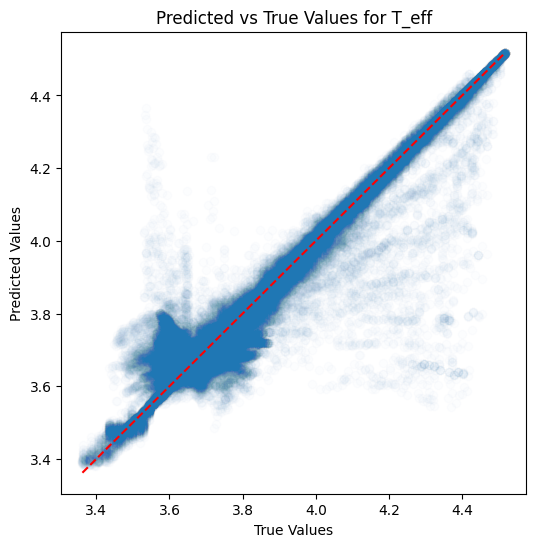

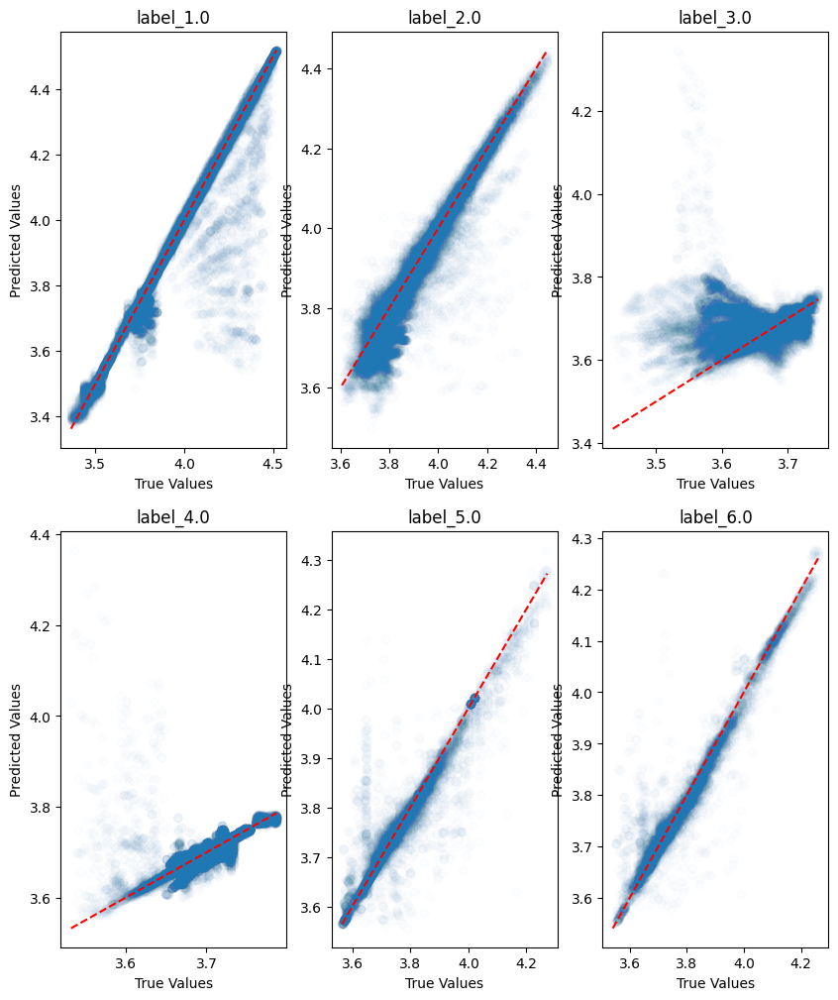

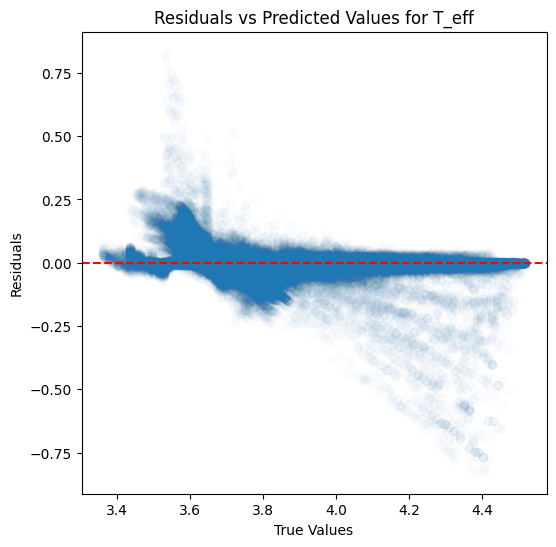

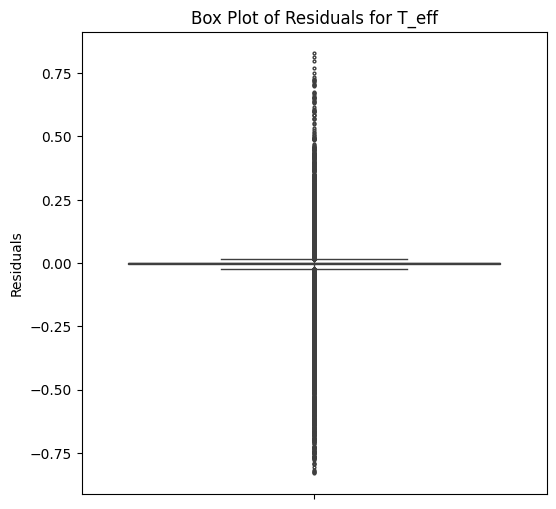

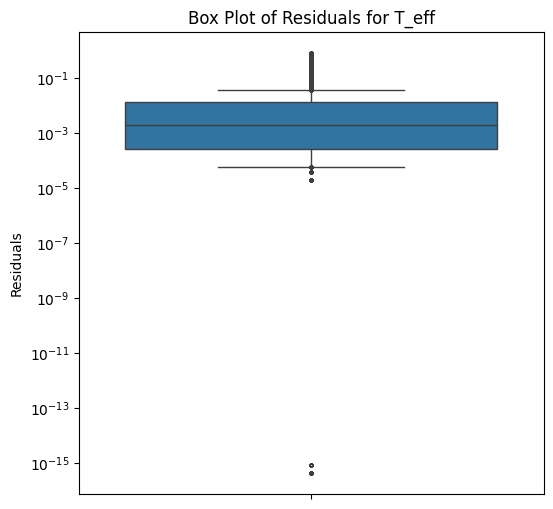

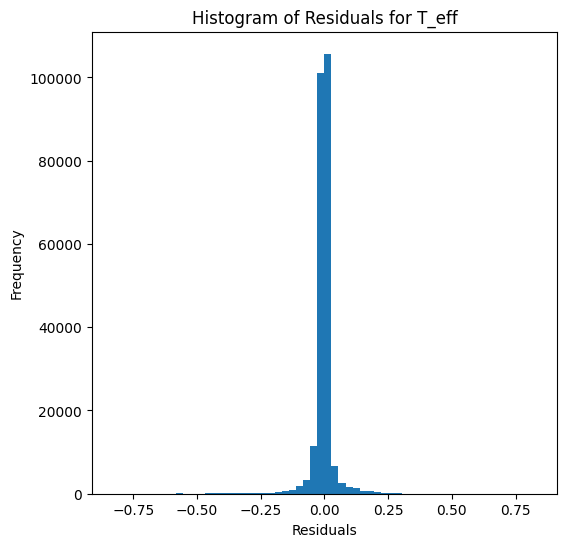

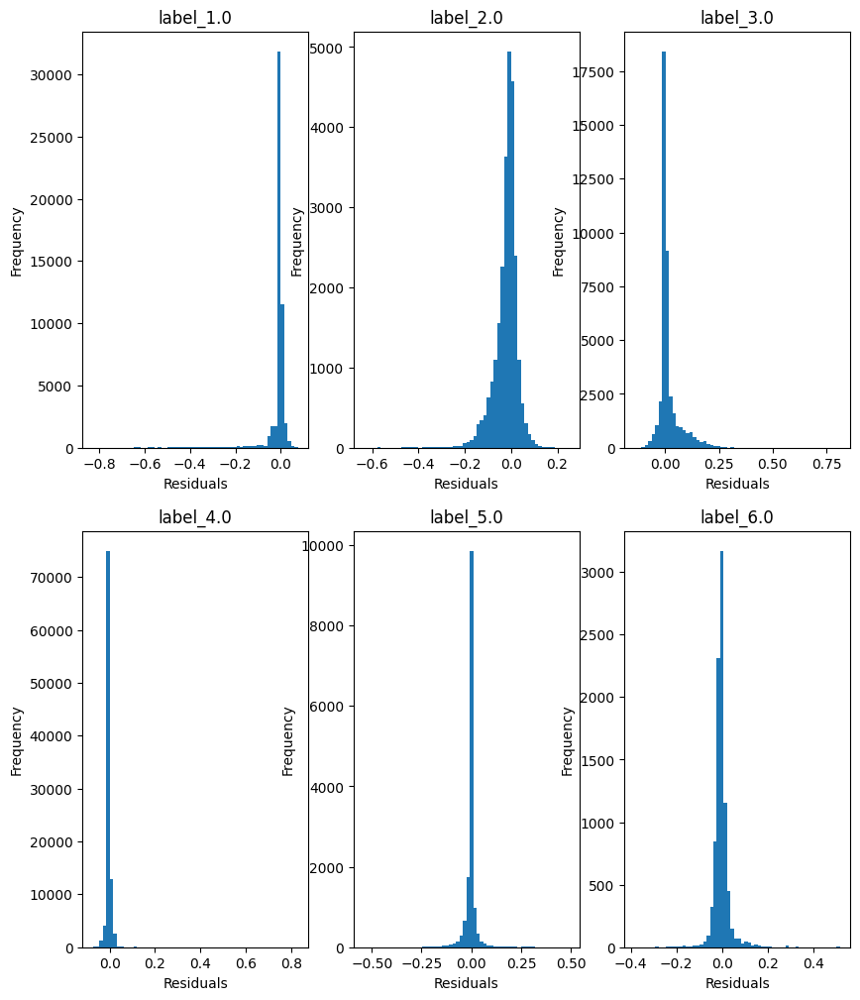

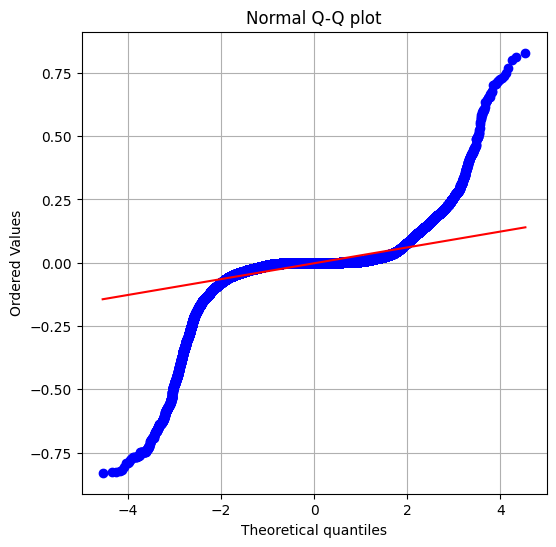

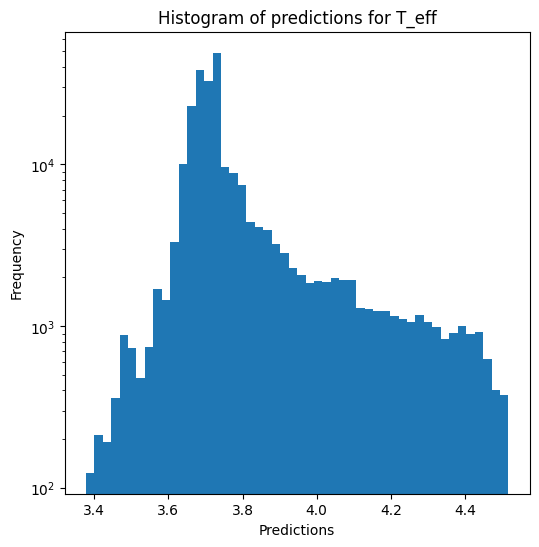

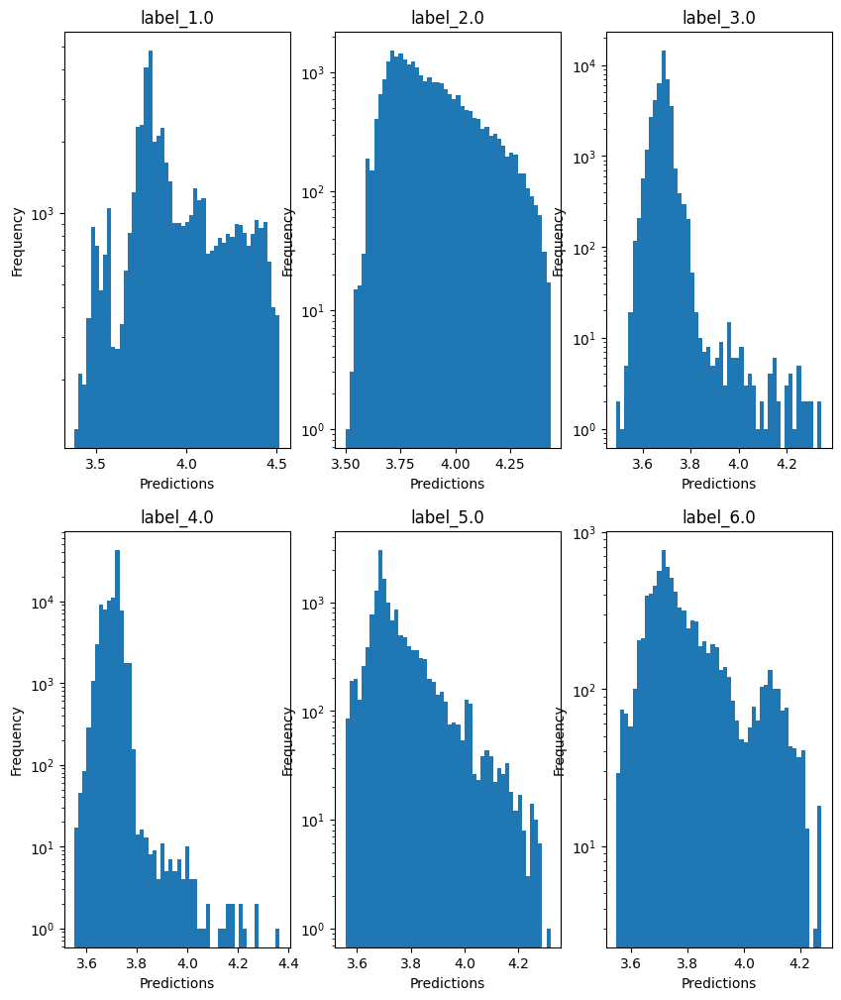


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.40183002519091326
  RMSE :  0.4175953721957157
  MAE :  0.12313375279536067
  MedAE :  0.007600000000000051
  CORR :  0.7318558385943664
  MAX_ER :  4.513
  Percentiles : 
    75th percentile :  0.02740000000000098
    90th percentile :  0.1256999999999997
    95th percentile :  0.8122000000000001
    99th percentile :  2.1146299999999973

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.5507478438161073
  RMSE :  0.5924990885951225
  MAE :  0.3071861670799752
  MedAE :  0.09240000000000004
  CORR :  0.7692095112378741
  MAX_ER :  3.9669999999999996
  Percentiles : 
    75th percentile :  0.26125000000000004
    90th percentile :  1.0849799999999994
    95th percentile :  1.416849999999998
    99th percentile :  2.2848320000000006

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.097085

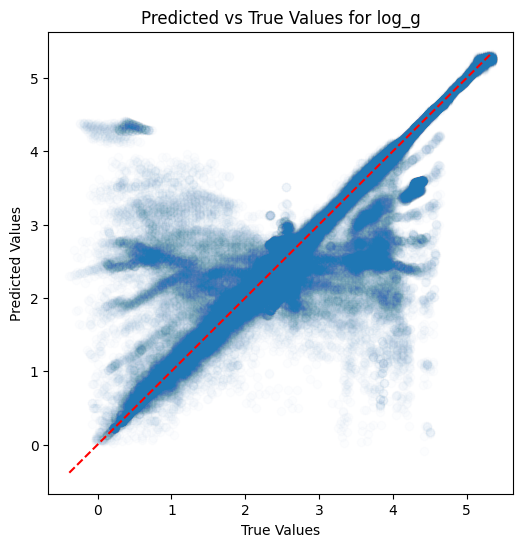

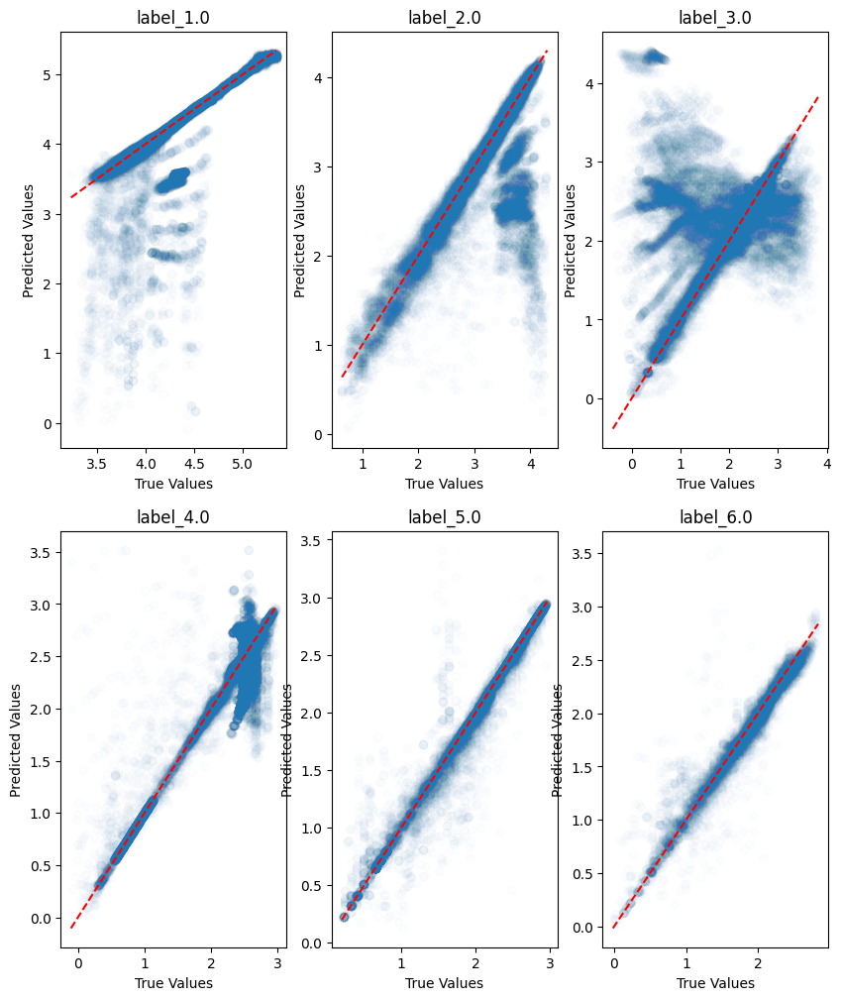

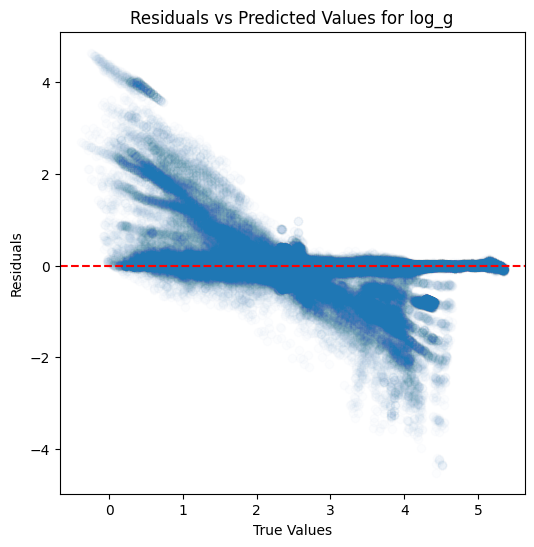

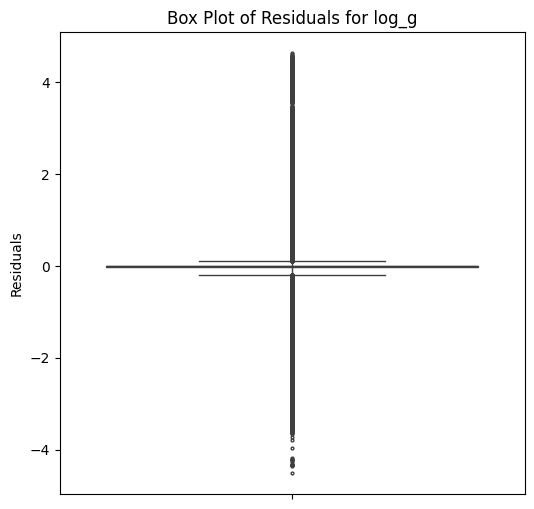

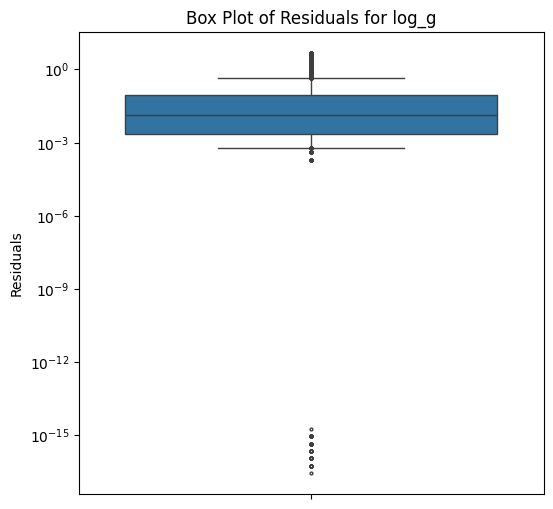

...

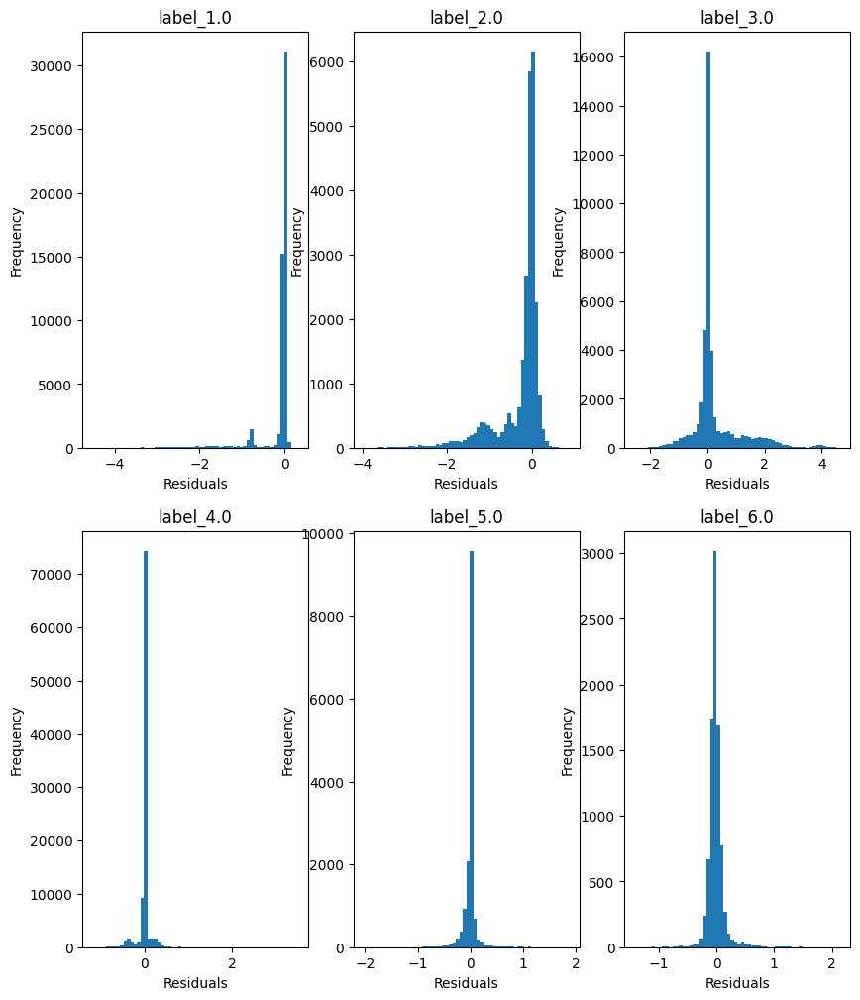

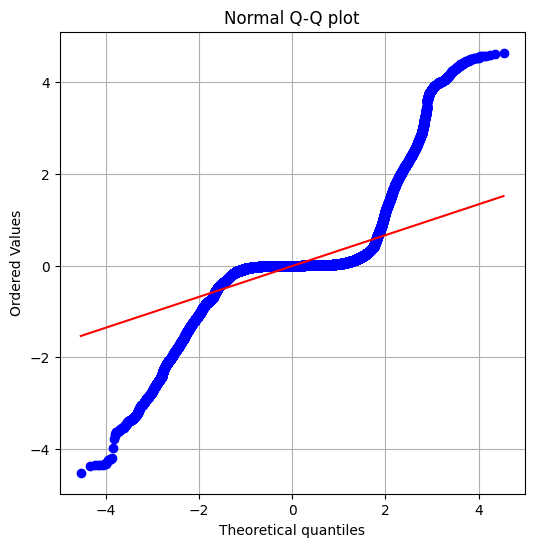

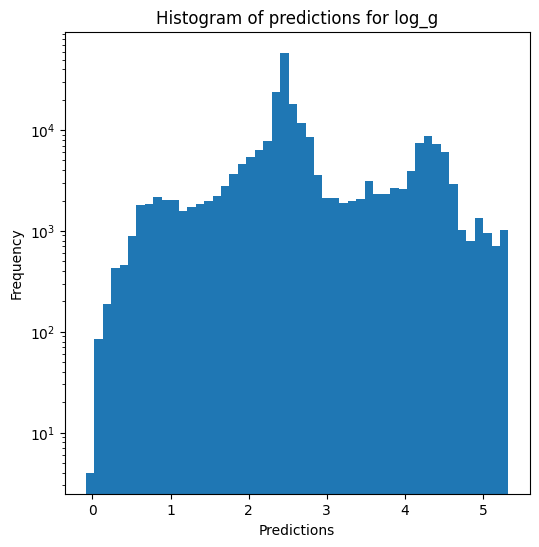

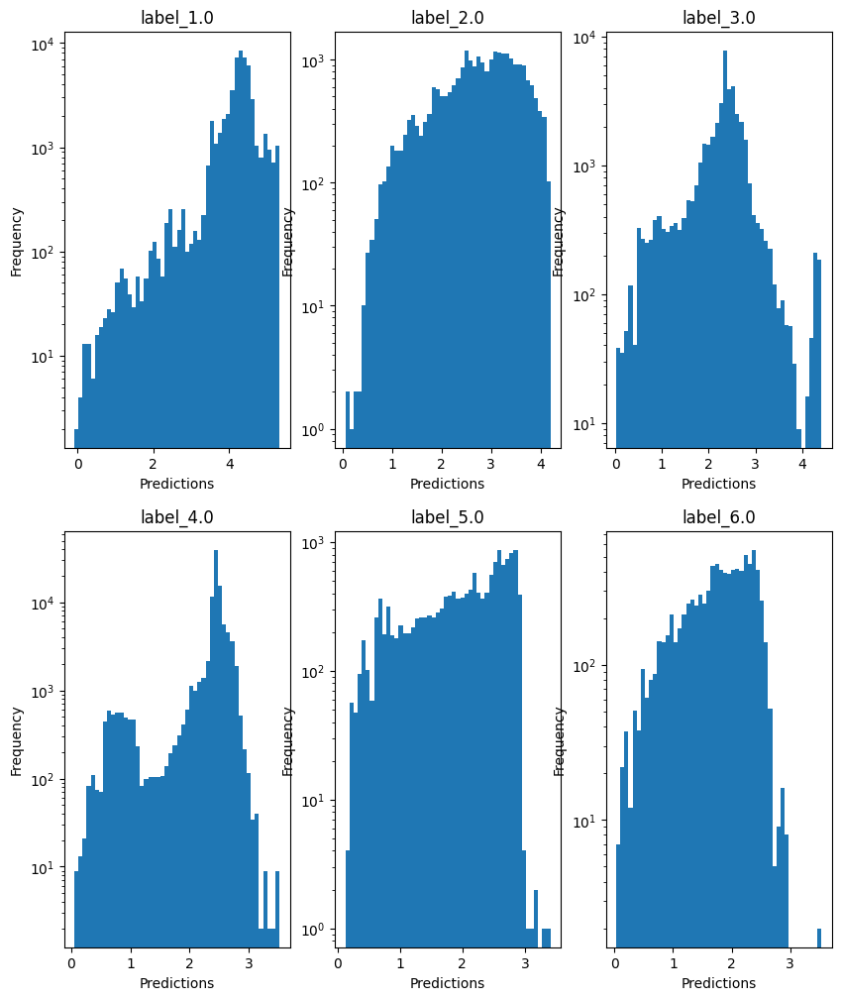

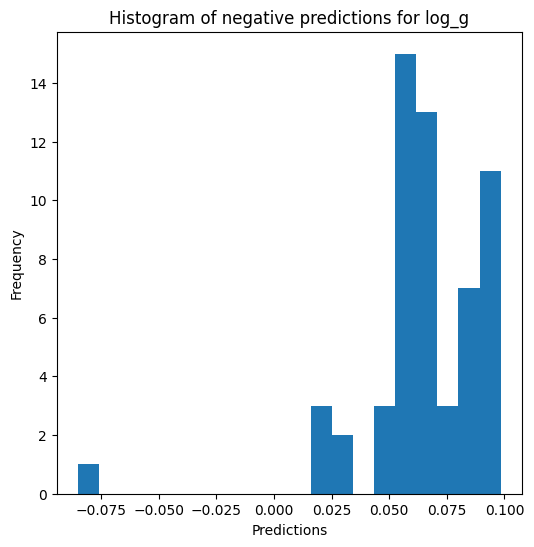


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.6956836920878375
  RMSE :  0.209809153388374
  MAE :  0.0642693099551614
  MedAE :  0.0055044036182959055
  CORR :  0.8914982490901747
  MAX_ER :  2.2561552794953266
  Percentiles : 
    75th percentile :  0.01851297860389194
    90th percentile :  0.08635597821260699
    95th percentile :  0.4063253601862784
    99th percentile :  1.0657058657344913

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7551103124773941
  RMSE :  0.2962797981238337
  MAE :  0.15367613670203478
  MedAE :  0.046299150252057664
  CORR :  0.8694990364150721
  MAX_ER :  1.9831724722172852
  Percentiles : 
    75th percentile :  0.13064996753188546
    90th percentile :  0.5427078885872026
    95th percentile :  0.7082232144085925
    99th percentile :  1.1431641817418523

radius results for the label category w

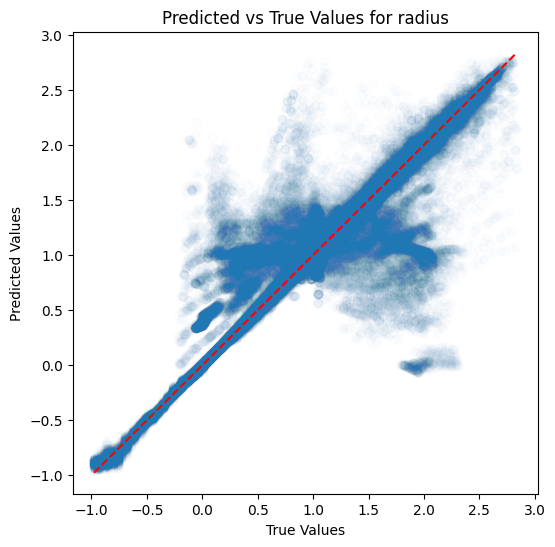

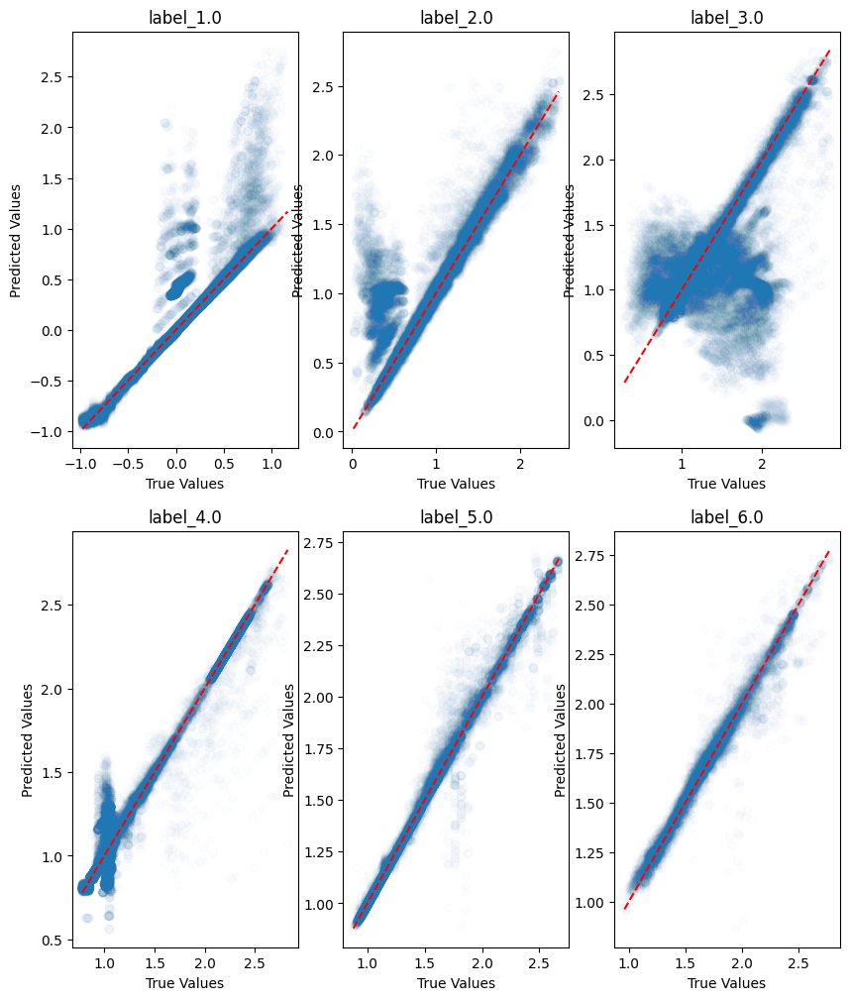

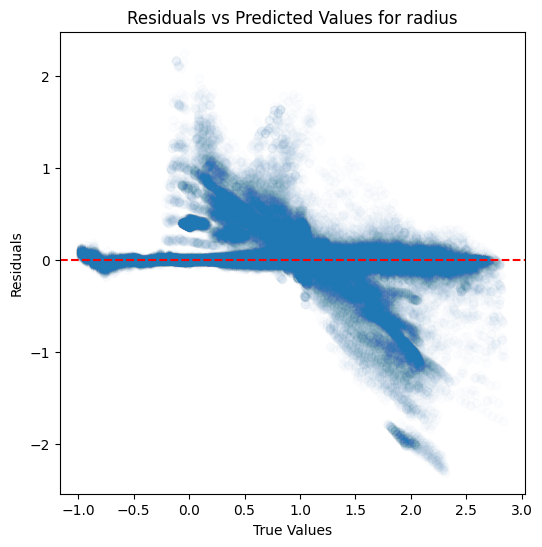

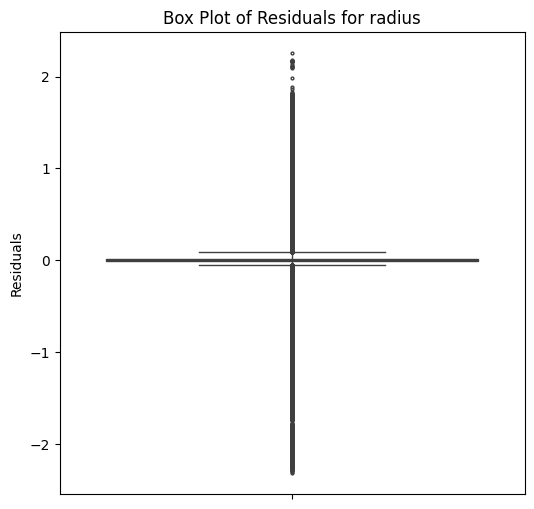

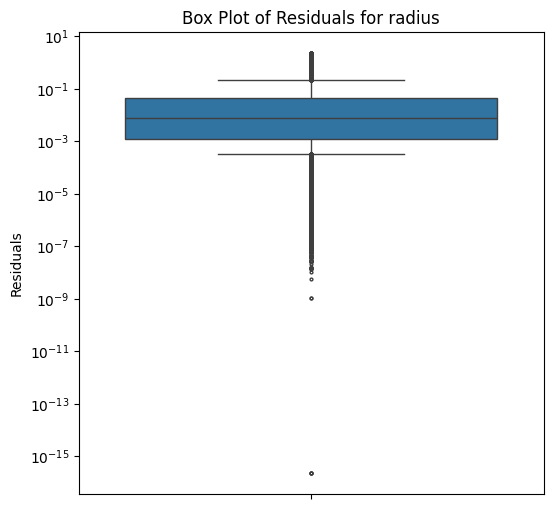

...

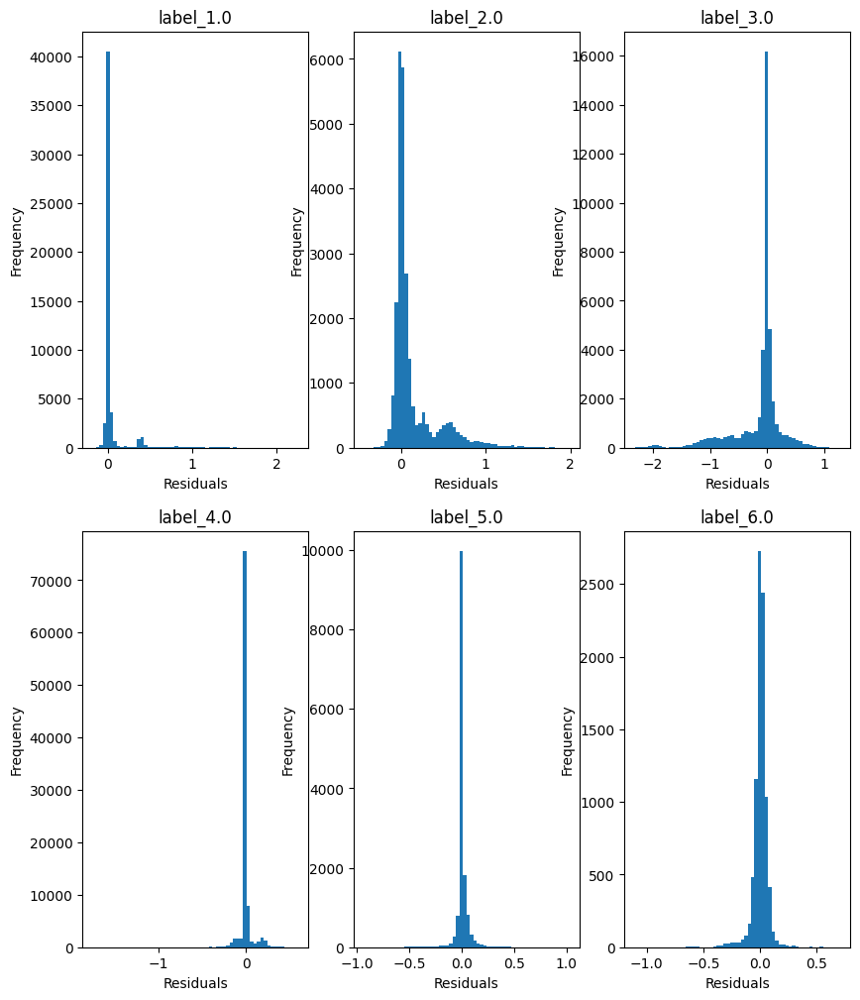

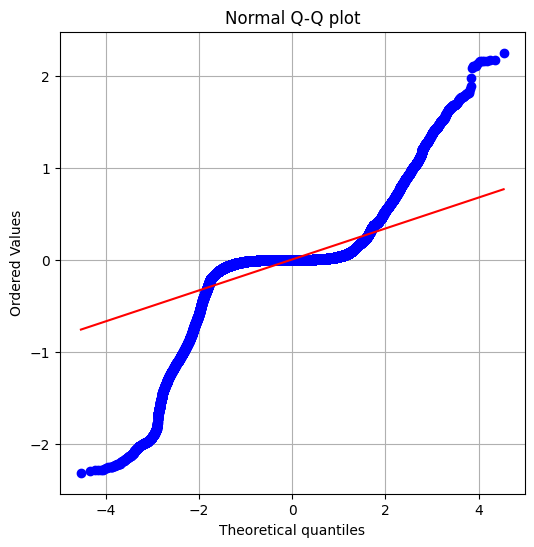

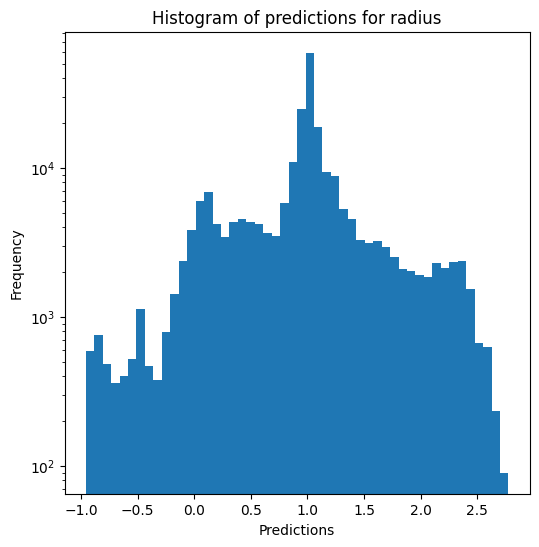

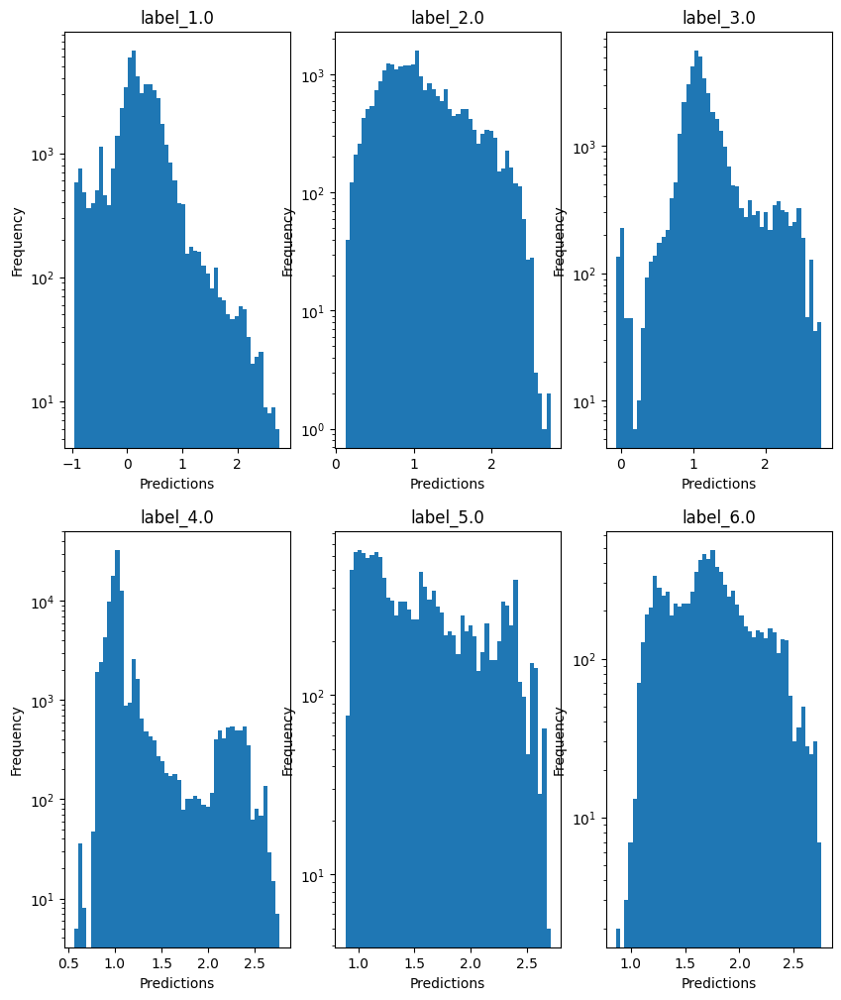

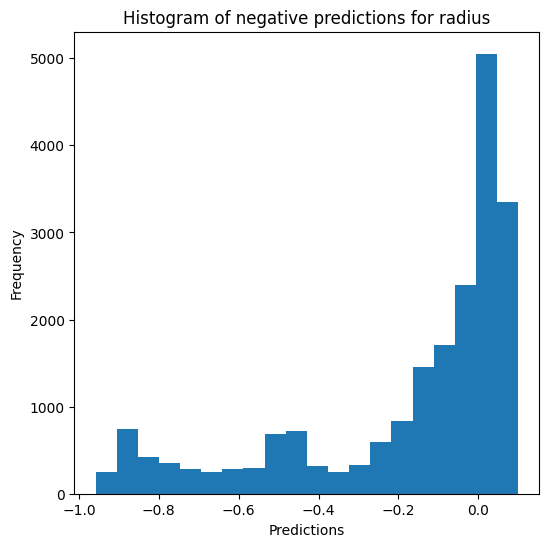

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9824019597155952
  RMSE :  0.035628178949293224
  MAE :  0.007341332278047793
  MedAE :  0.00019199999999597317
  CORR :  0.9912691218011552
  MAX_ER :  0.7697800000000021
  Percentiles : 
    75th percentile :  0.002350822718248935
    90th percentile :  0.01062192678571705
    95th percentile :  0.029920125205348924
    99th percentile :  0.13138925361209375

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9004667454137519
  RMSE :  0.055734395571178645
  MAE :  0.03249176337842986
  MedAE :  0.016259609433622035
  CORR :  0.9552451267893546
  MAX_ER :  0.7567458515873056
  Percentiles : 
    75th percentile :  0.03947819906968186
    90th percentile :  0.08445190123634311
    95th percentile :  0.1216565545833357

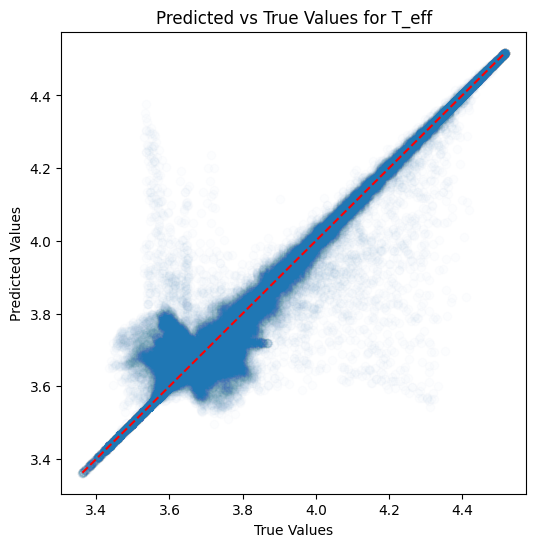

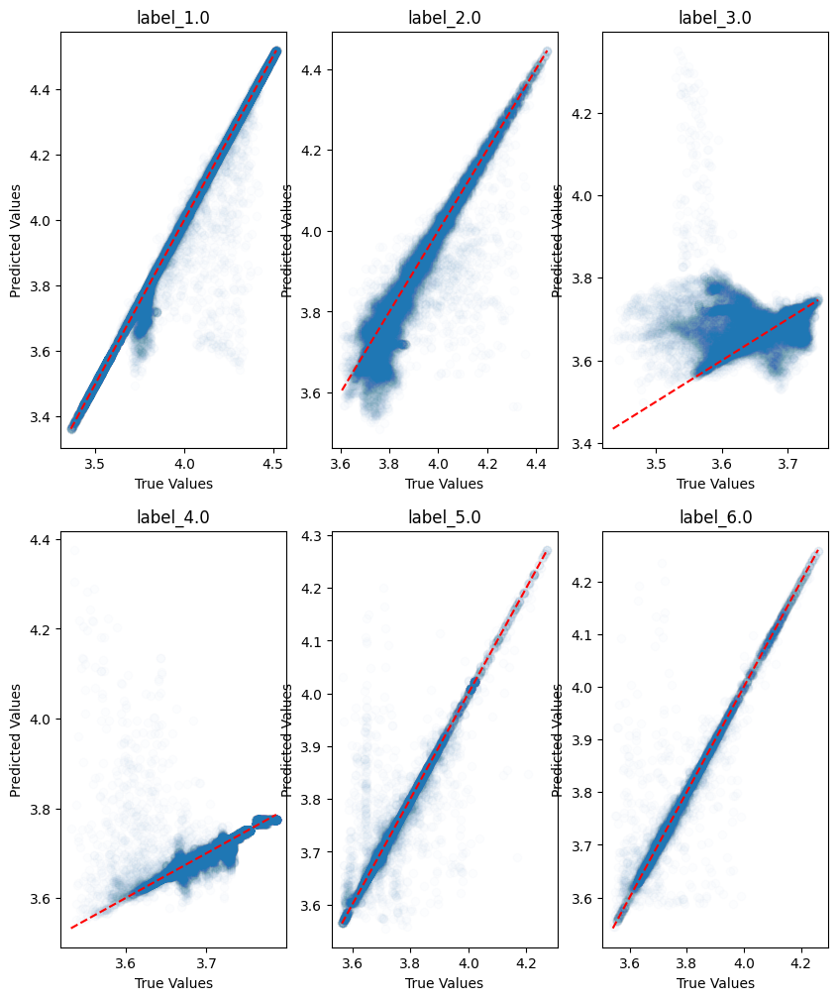

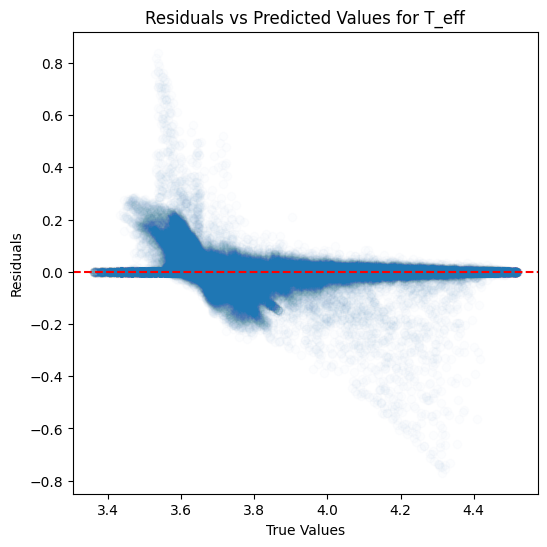

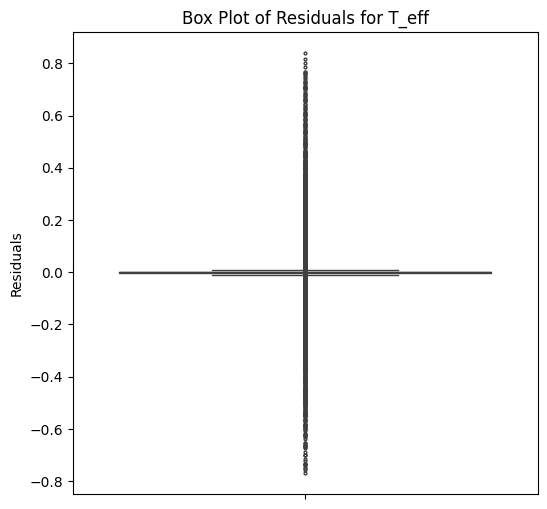

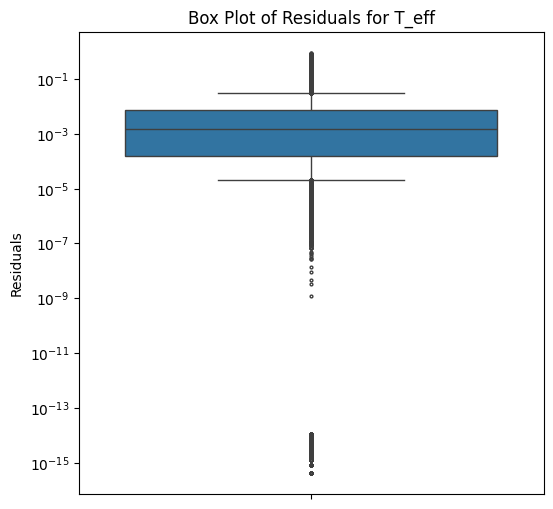

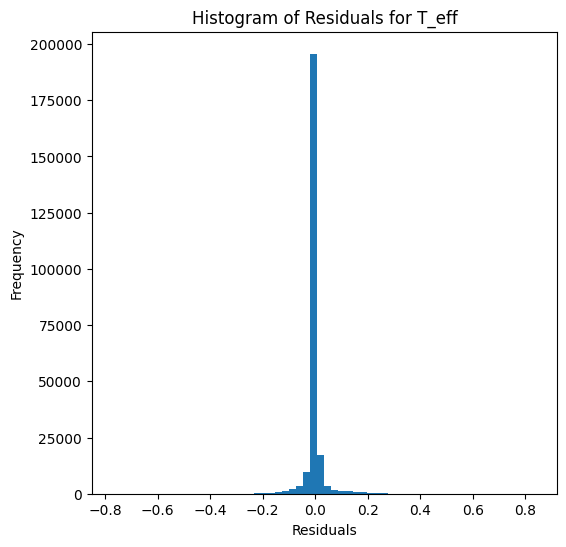

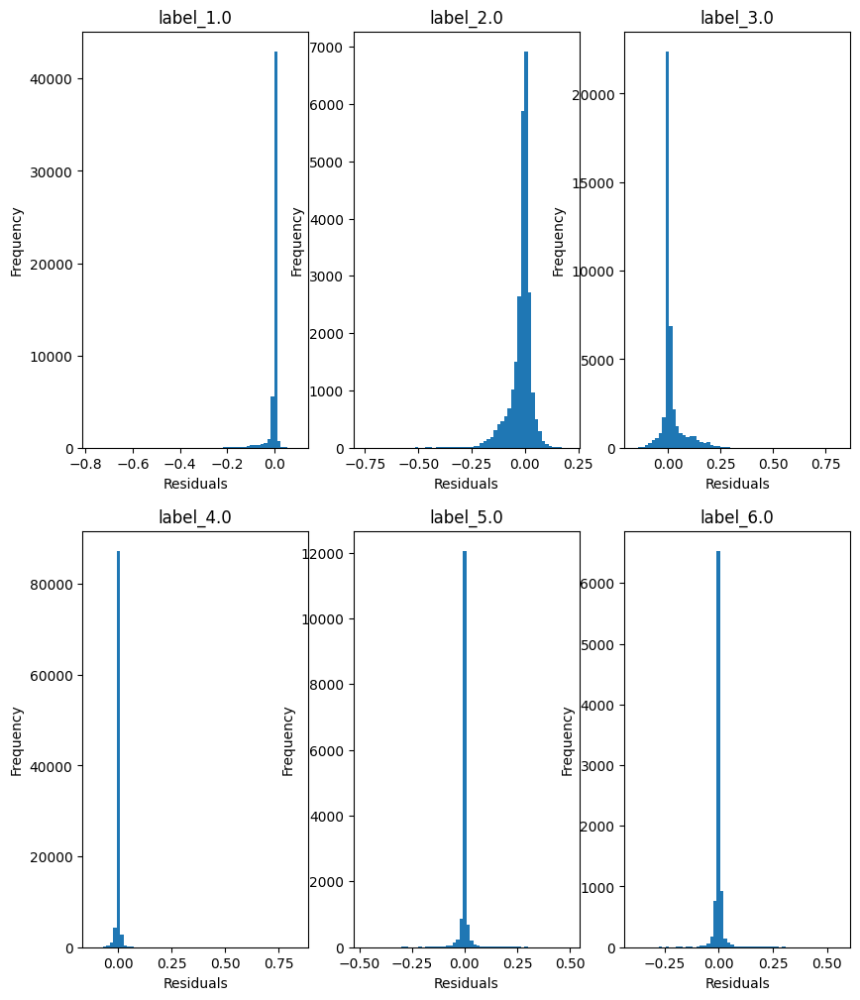

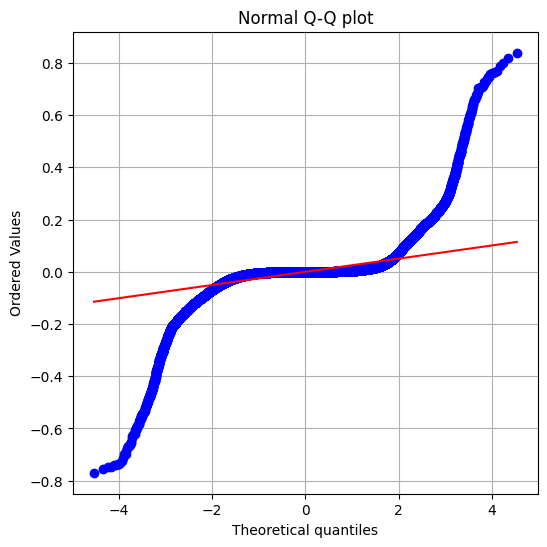

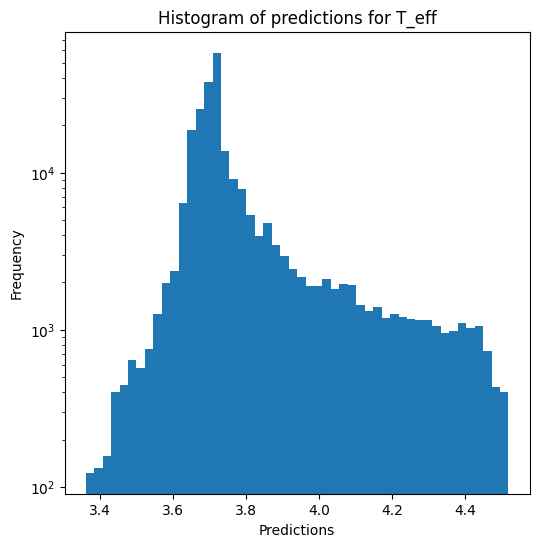

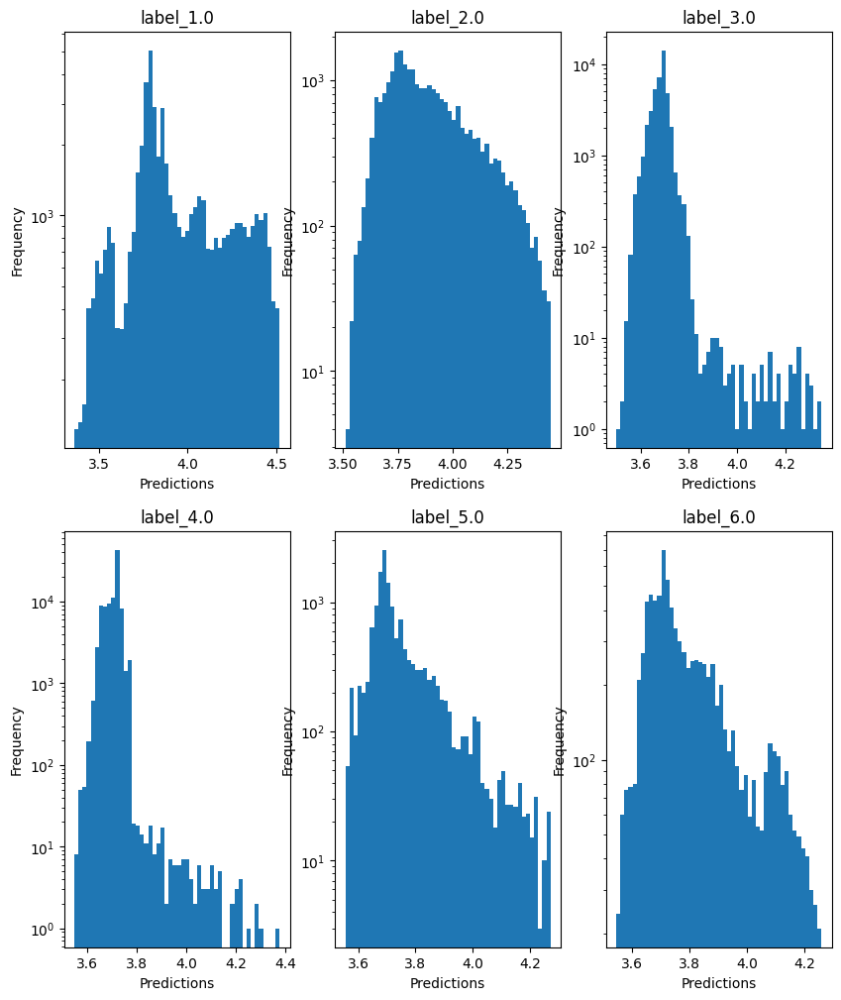


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.17048734756969952
  RMSE :  0.31627506245379716
  MAE :  0.07017388642370143
  MedAE :  0.0009699999999970288
  CORR :  0.7759872312386642
  MAX_ER :  4.327067735849056
  Percentiles : 
    75th percentile :  0.006790000000001406
    90th percentile :  0.04801834523809445
    95th percentile :  0.325571291666667
    99th percentile :  1.7692630009623276

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.4624974507669598
  RMSE :  0.6323218841131812
  MAE :  0.28912535115300364
  MedAE :  0.06758606944444412
  CORR :  0.7374043837125458
  MAX_ER :  3.6722308333333338
  Percentiles : 
    75th percentile :  0.19366705185644778
    90th percentile :  1.0257995829118602
    95th percentile :  1.6780100166666645
    99th percentile :  2.613588750000002

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  R

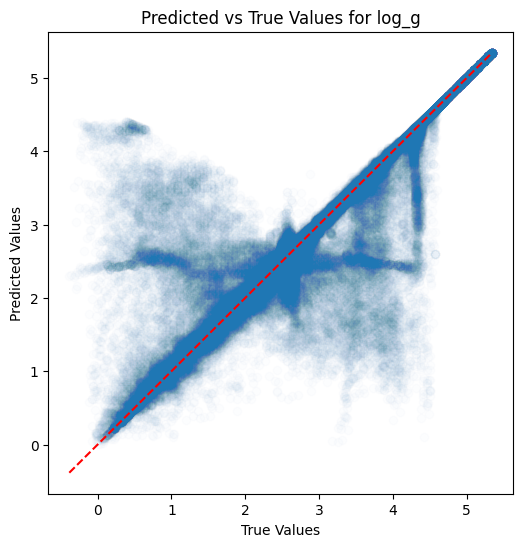

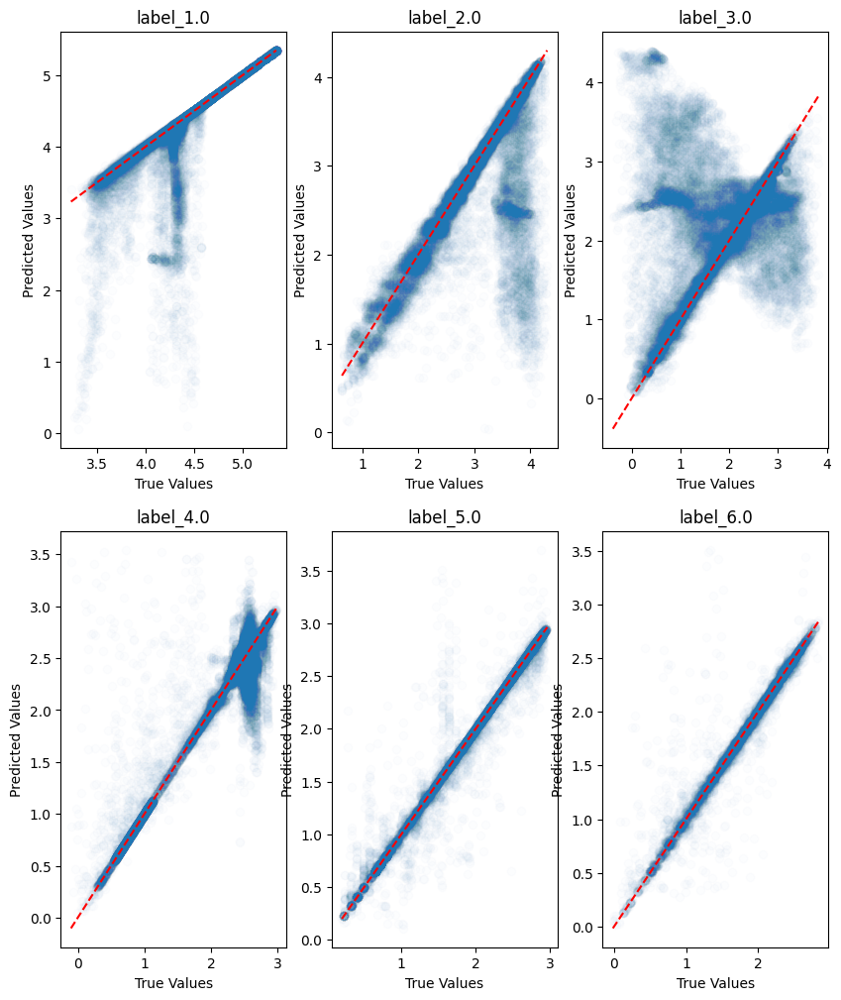

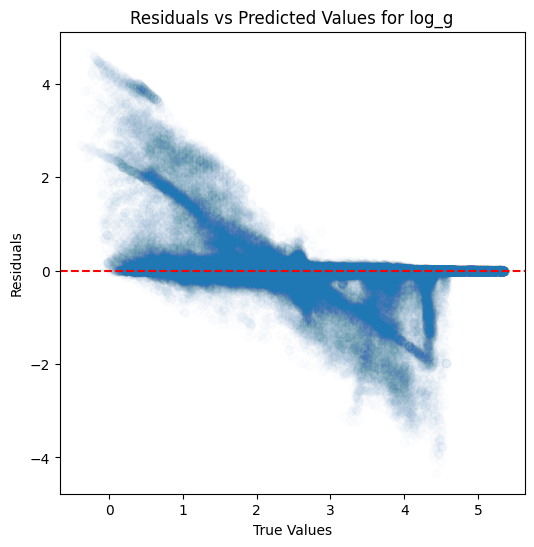

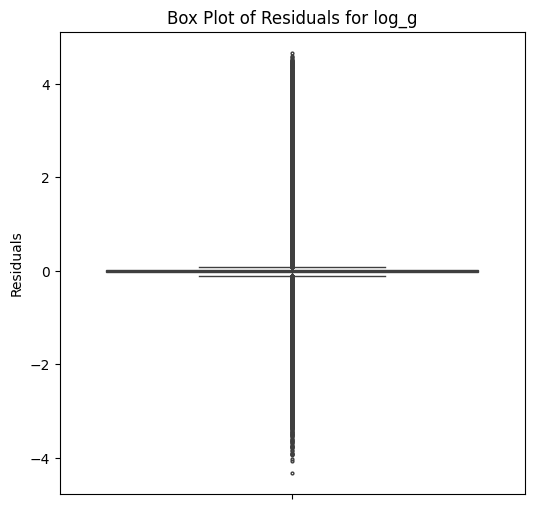

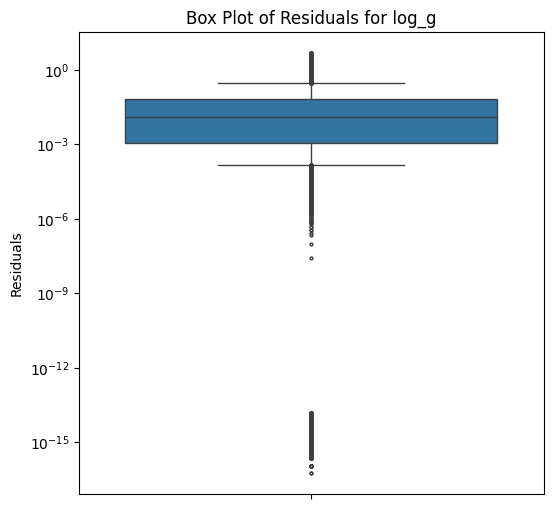

...

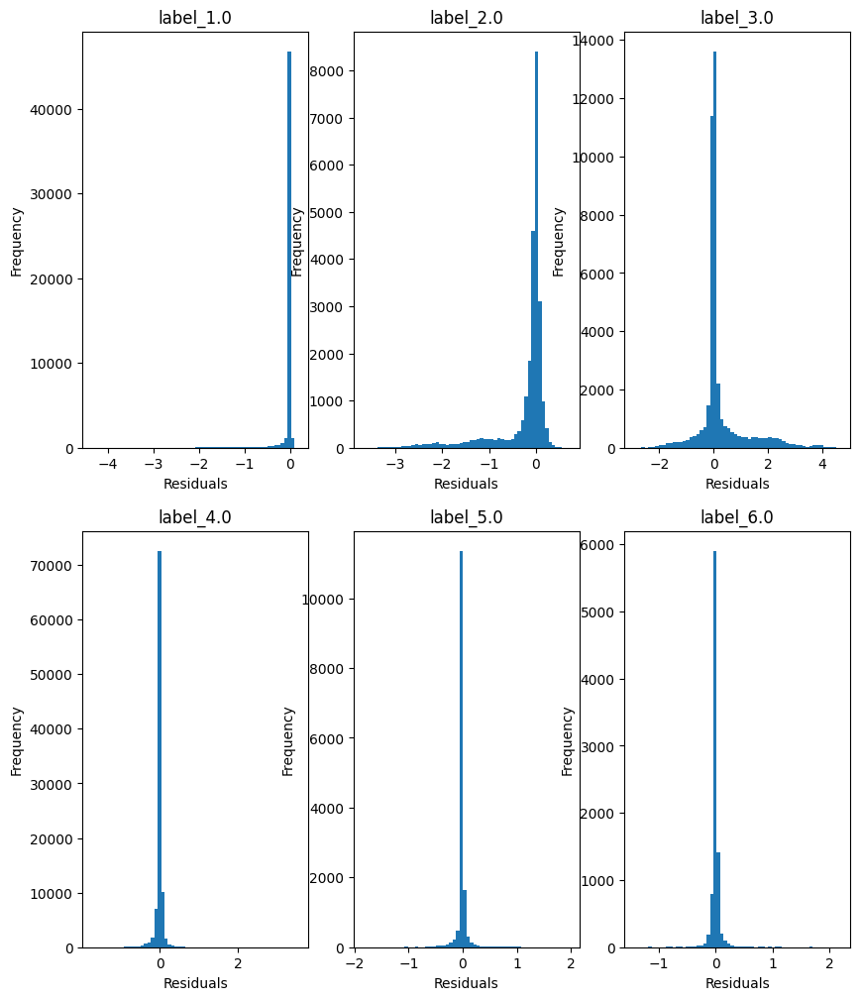

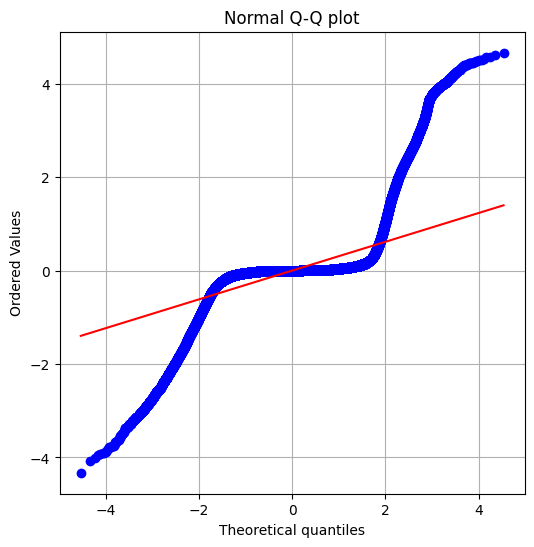

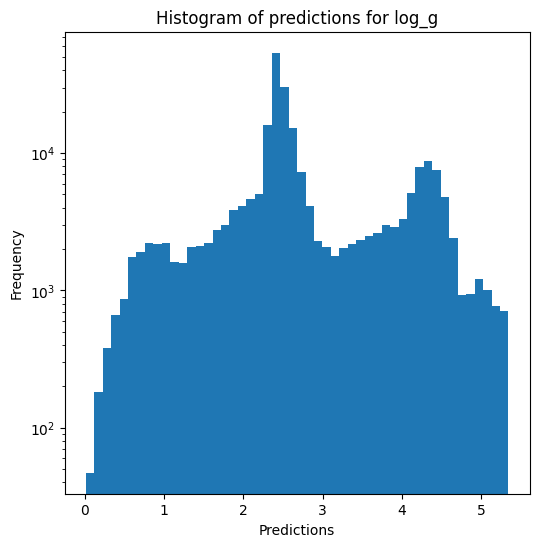

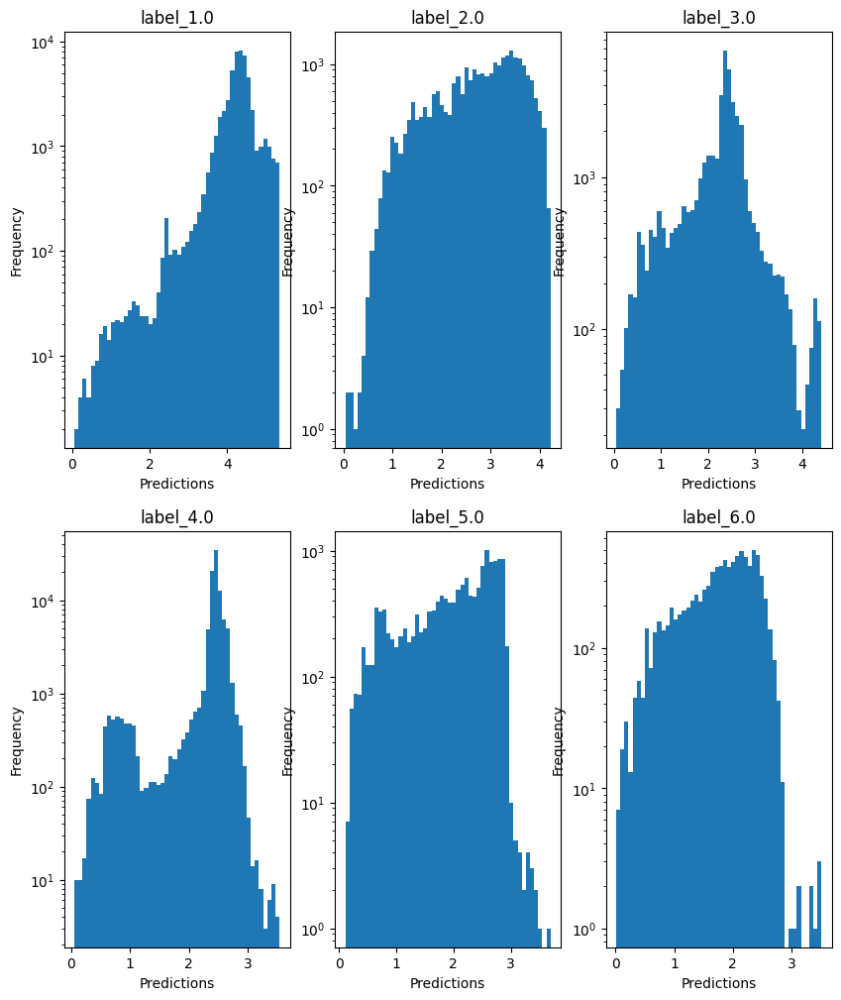

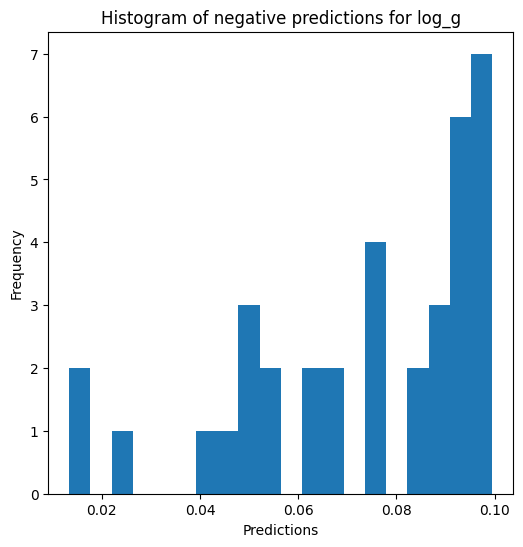


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8212550572178736
  RMSE :  0.1583062327308516
  MAE :  0.03528917897520365
  MedAE :  0.0005653159671782718
  CORR :  0.922726008506314
  MAX_ER :  2.163400879247654
  Percentiles : 
    75th percentile :  0.003926246674345962
    90th percentile :  0.024462685094089942
    95th percentile :  0.16292496267700515
    99th percentile :  0.8869376716473473

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7070401483827822
  RMSE :  0.31617164771142314
  MAE :  0.1446142768173681
  MedAE :  0.033874044580193385
  CORR :  0.8450349595379226
  MAX_ER :  1.8356362168224247
  Percentiles : 
    75th percentile :  0.09694430345281763
    90th percentile :  0.512747042128815
    95th percentile :  0.839078136145923
    99th percentile :  1.3061368679837766

radius results for the label category 

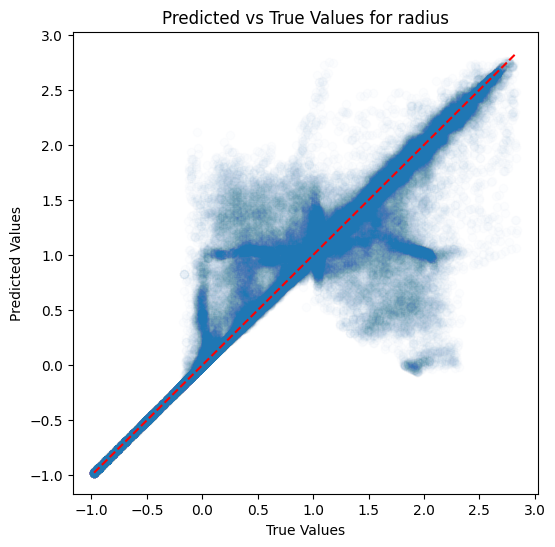

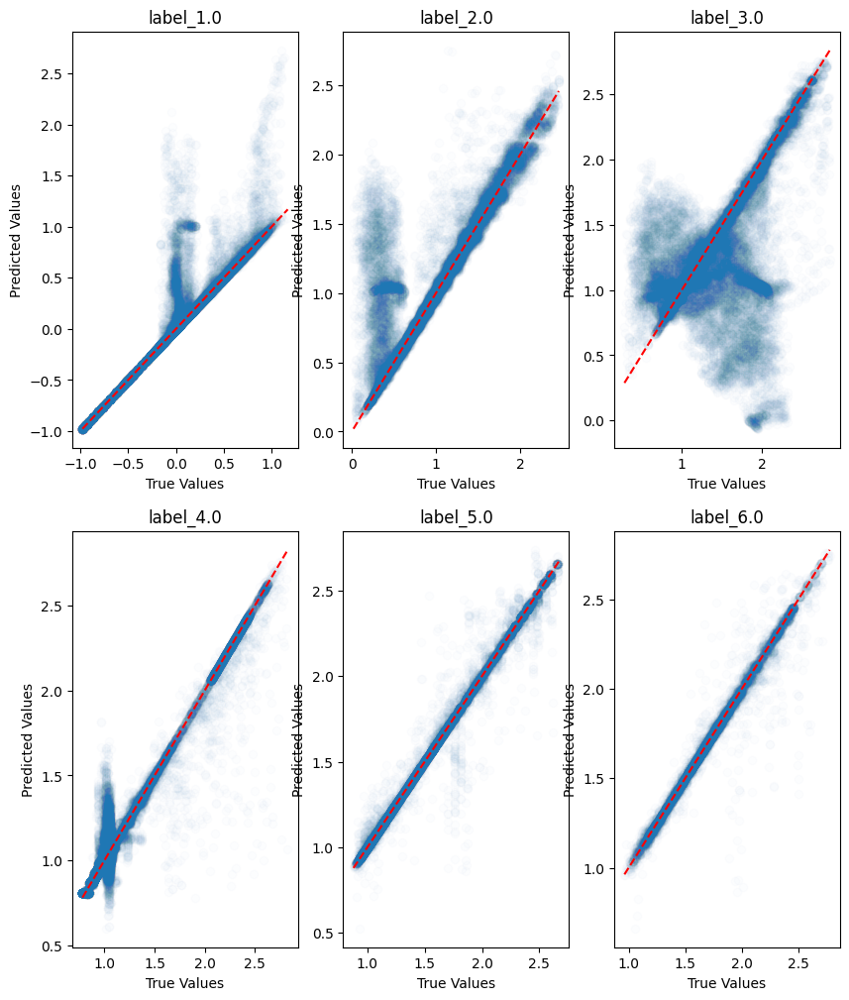

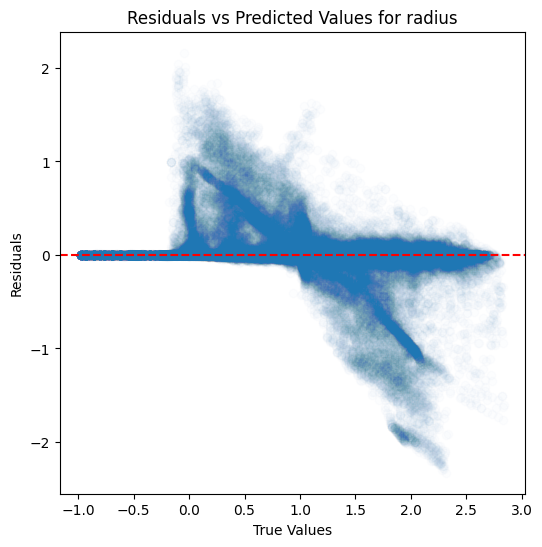

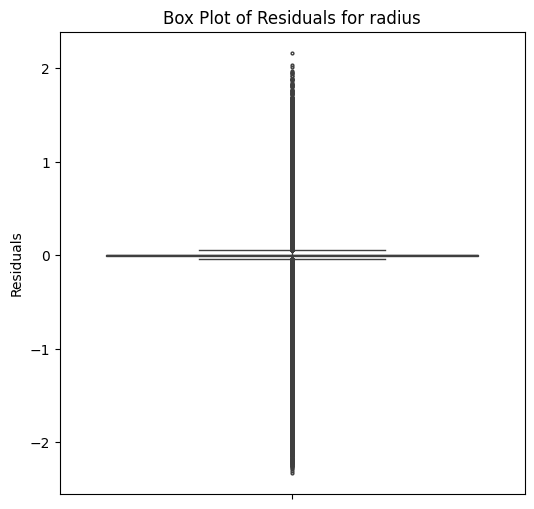

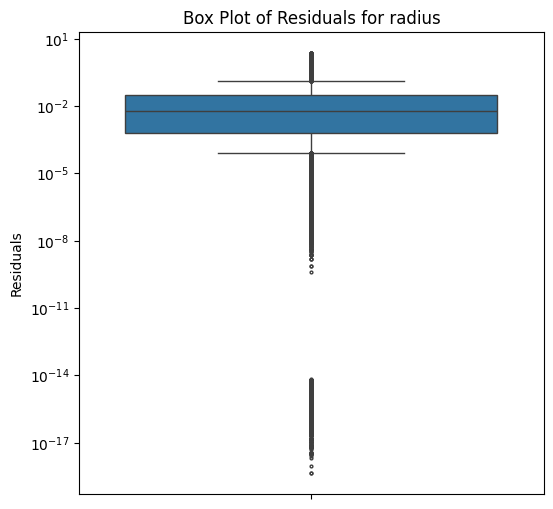

...

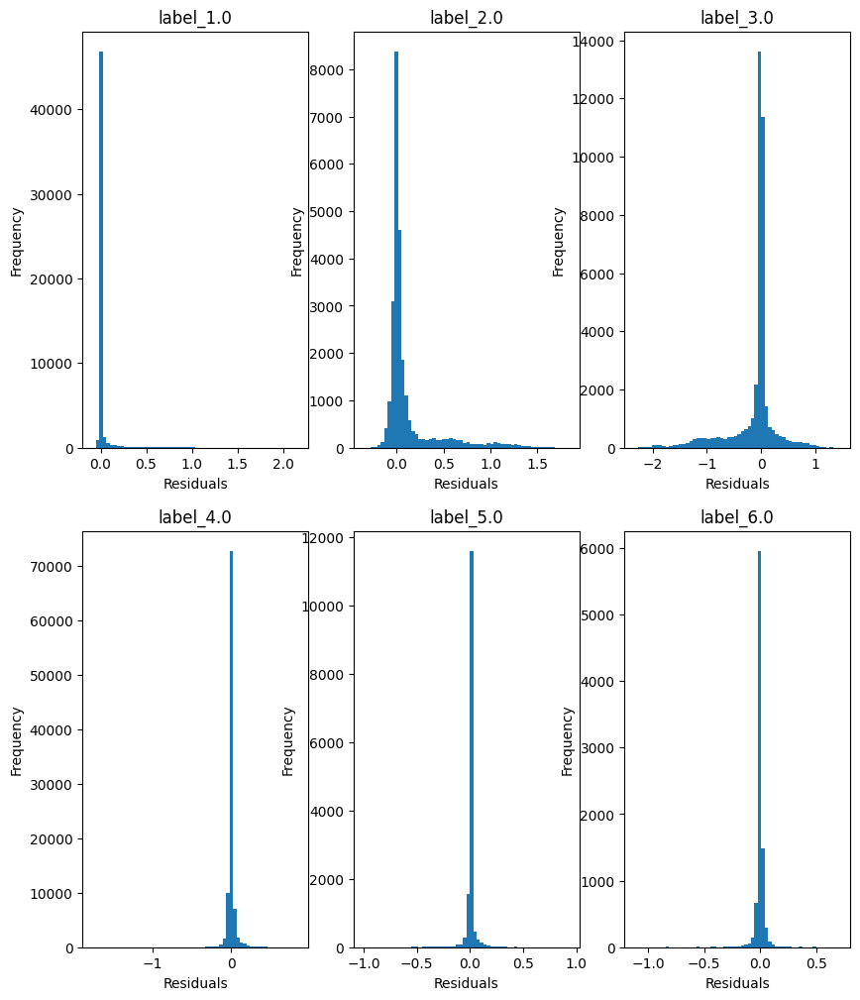

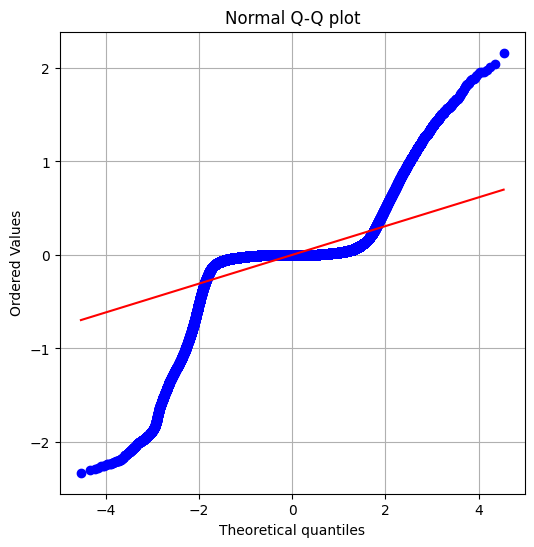

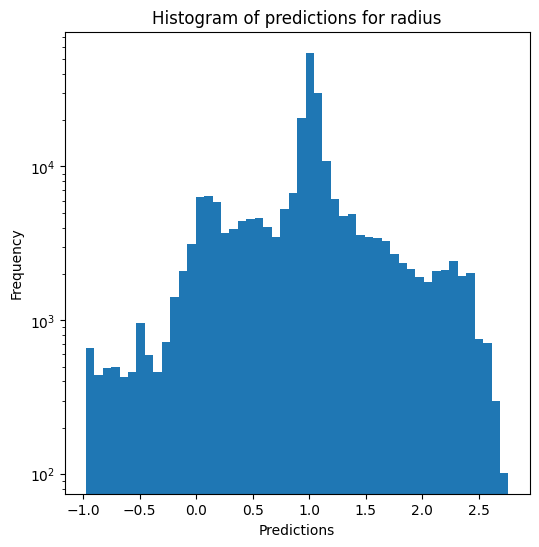

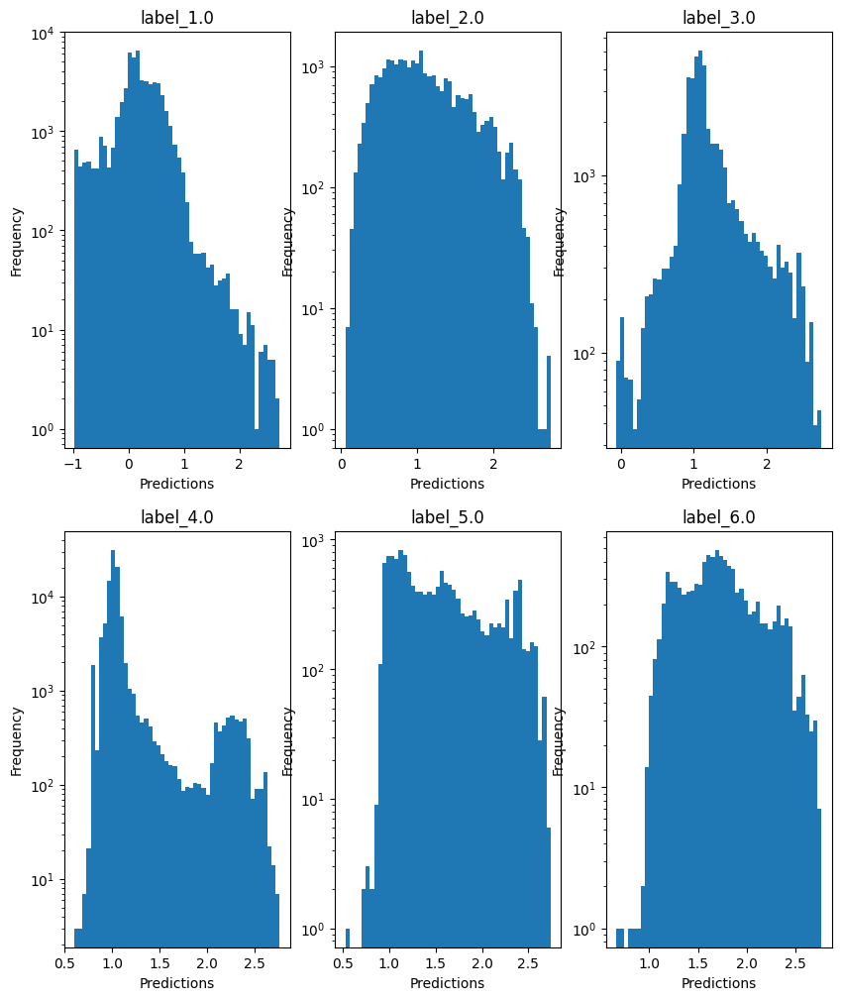

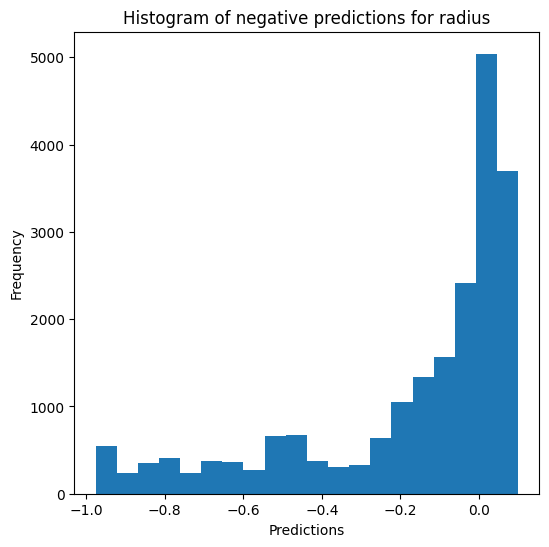

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9035438101538388
  RMSE :  0.08962926996366931
  MAE :  0.04370062094663365
  MedAE :  0.016440191650390457
  CORR :  0.9513542801799472
  MAX_ER :  0.6862123130798343
  Percentiles : 
    75th percentile :  0.045224884605407745
    90th percentile :  0.09852901439666728
    95th percentile :  0.19257690420150775
    99th percentile :  0.4450410458564756

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.2421346697916199
  RMSE :  0.16346869278380277
  MAE :  0.12303096453821297
  MedAE :  0.08958496551513662
  CORR :  0.5078146897498674
  MAX_ER :  0.6752104206085203
  Percentiles : 
    75th percentile :  0.1702466587066649
    90th percentile :  0.2765139361953734
    95th percentile :  0.352970765609741
    99th p

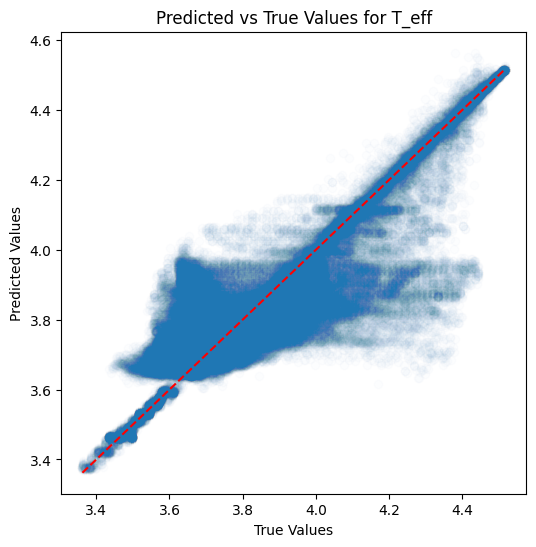

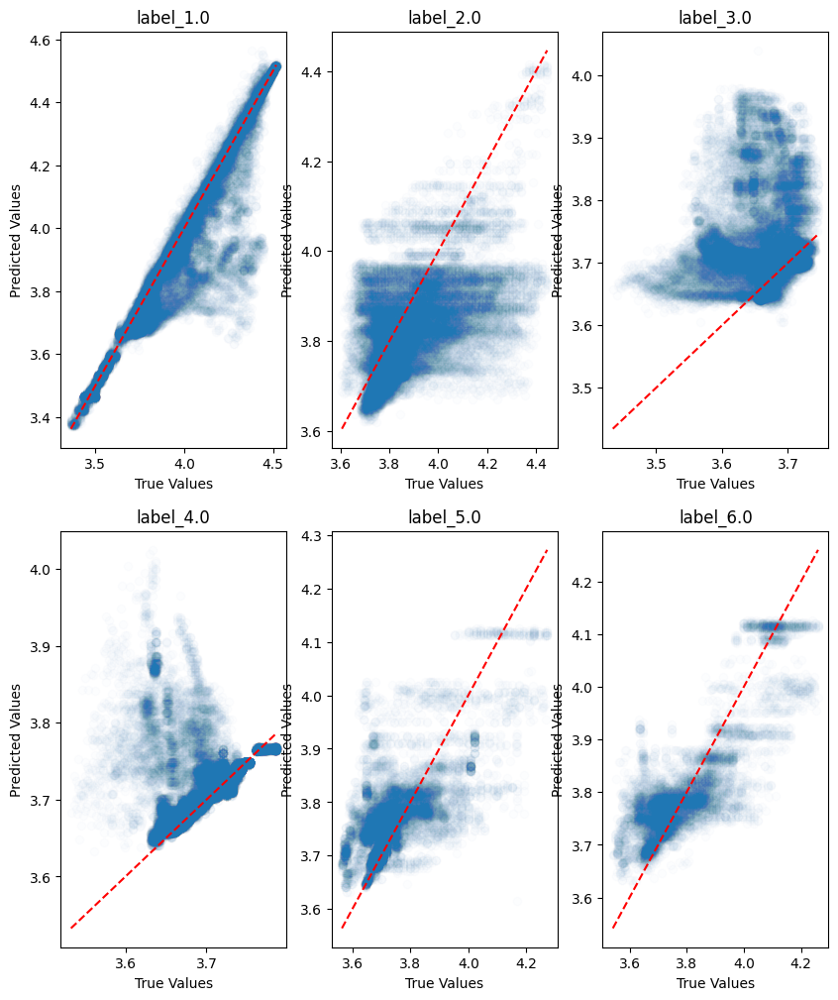

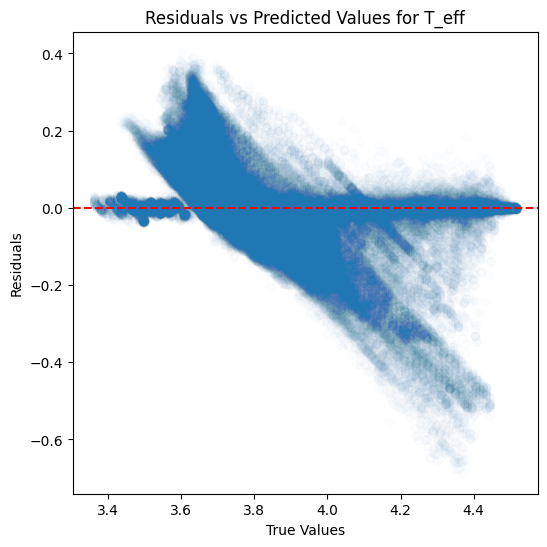

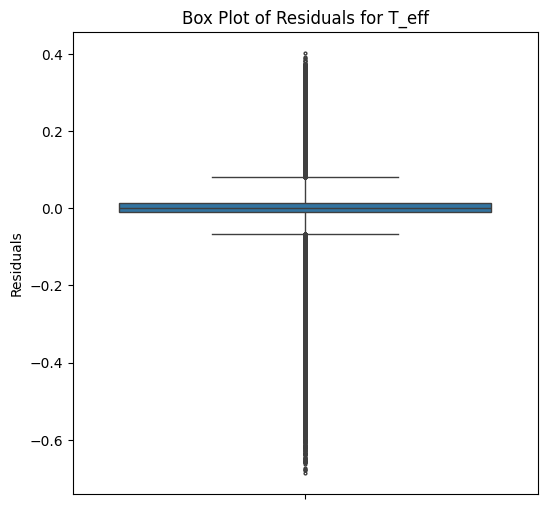

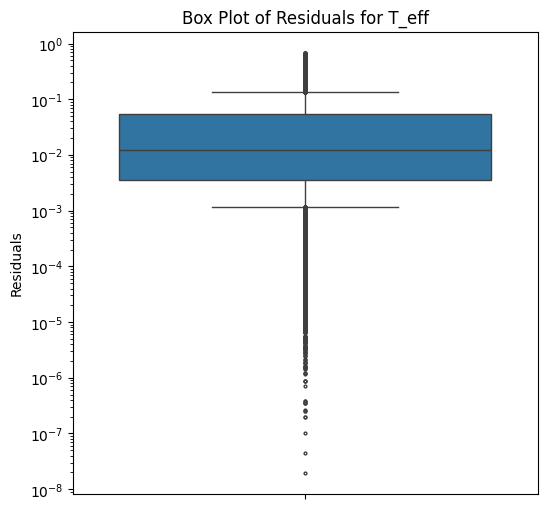

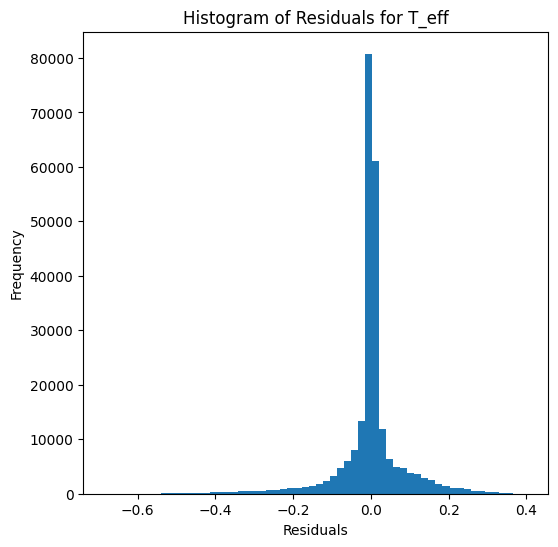

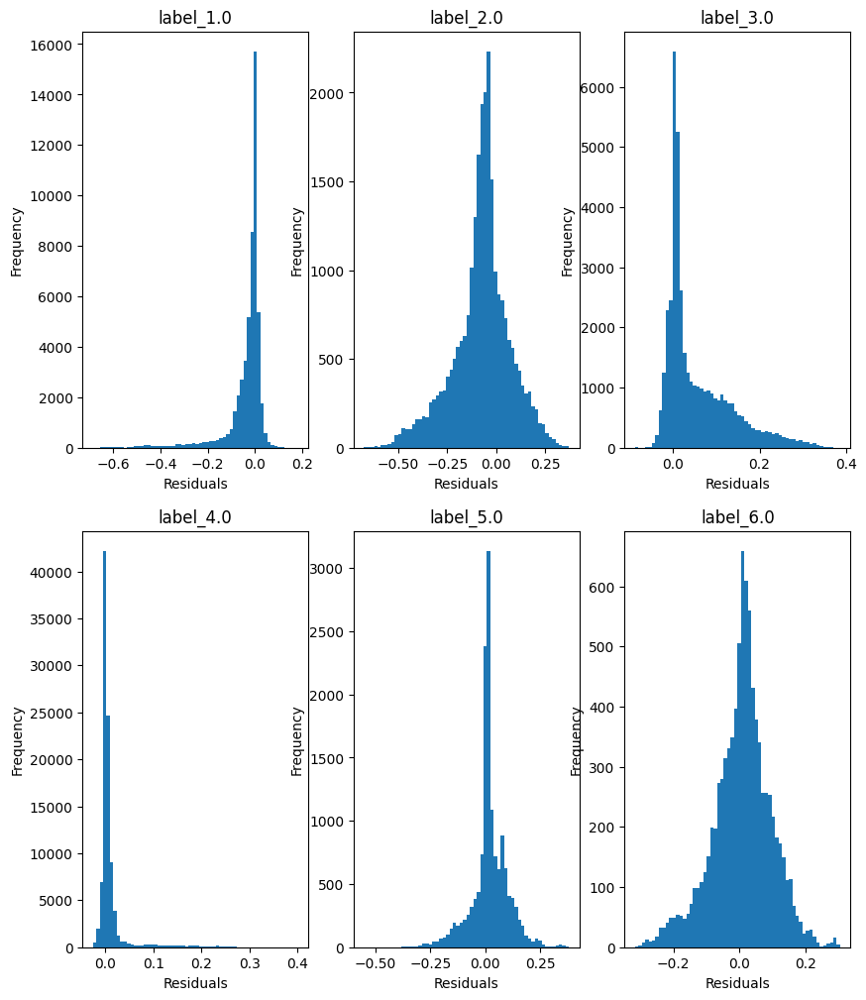

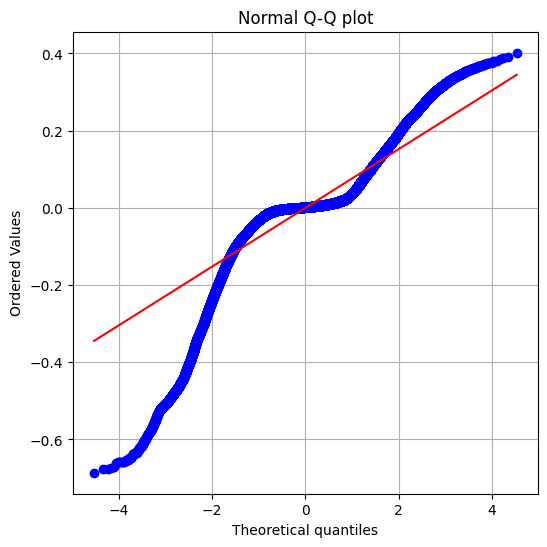

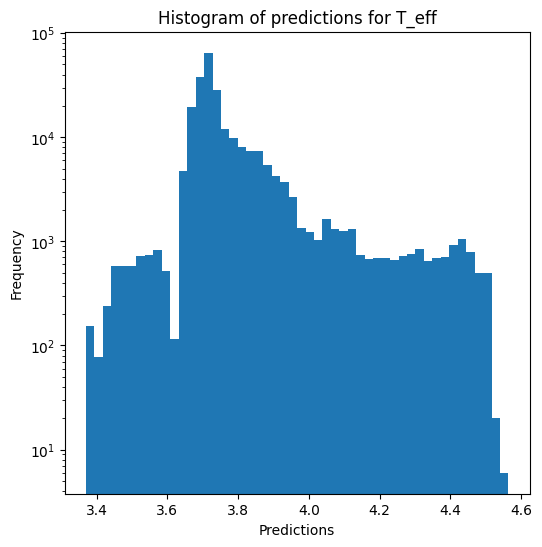

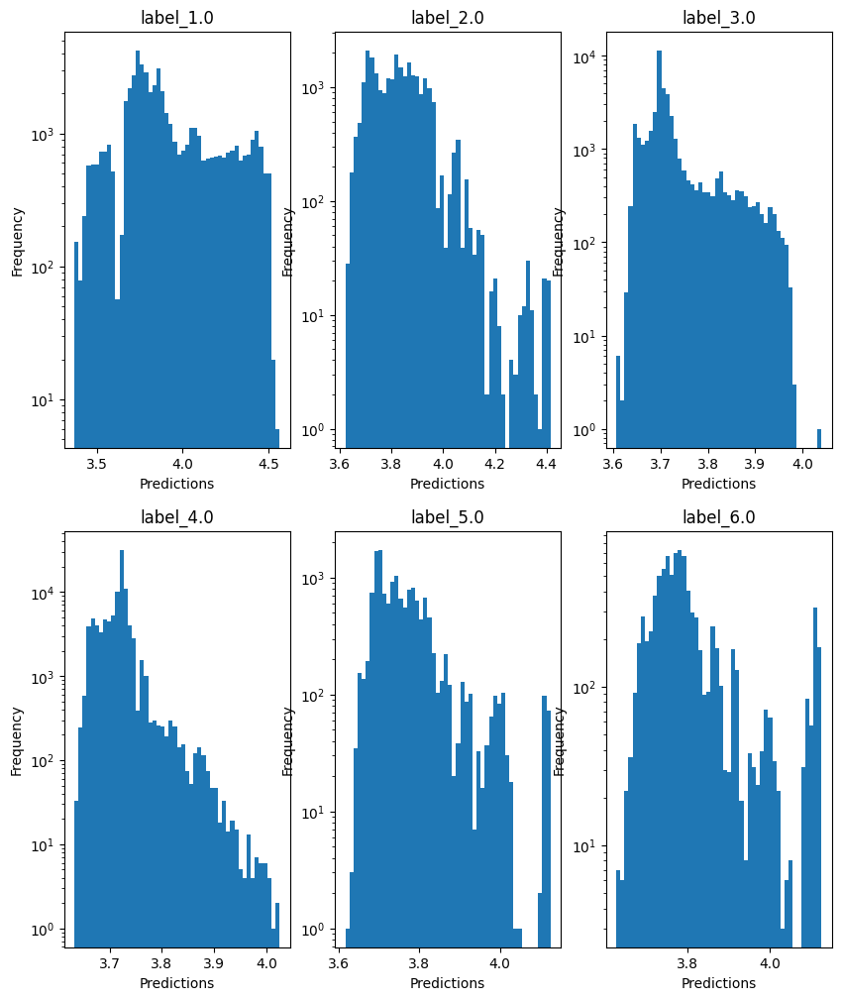

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -1.0124875678765508
  RMSE :  0.55356010503011
  MAE :  0.31917765404091575
  MedAE :  0.09096437835693338
  CORR :  0.8095818883794095
  MAX_ER :  3.585430902481079
  Percentiles : 
    75th percentile :  0.43346804285049434
    90th percentile :  1.0305067501068115
    95th percentile :  1.3427274727821352
    99th percentile :  1.9014077968597407

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.35000992847659496
  RMSE :  0.832163042077831
  MAE :  0.6713615037908816
  MedAE :  0.5849574146270751
  CORR :  0.6120898372154866
  MAX_ER :  2.695528434753418
  Percentiles : 
    75th percentile :  1.027788136482239
    90th percentile :  1.346304877948761
    95th percentile :  1.5365631968736644
    99th percentile :  1.9933264728260045

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3

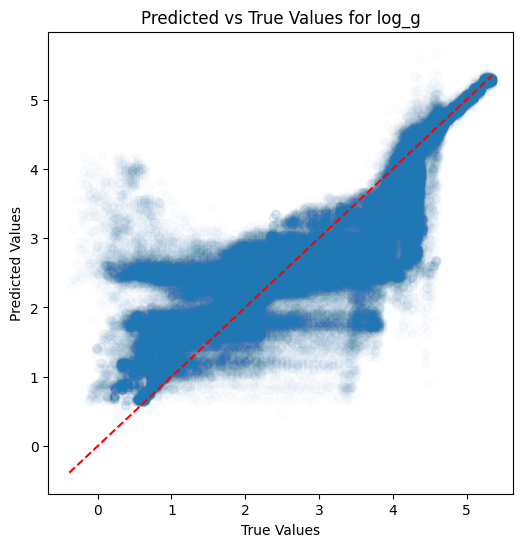

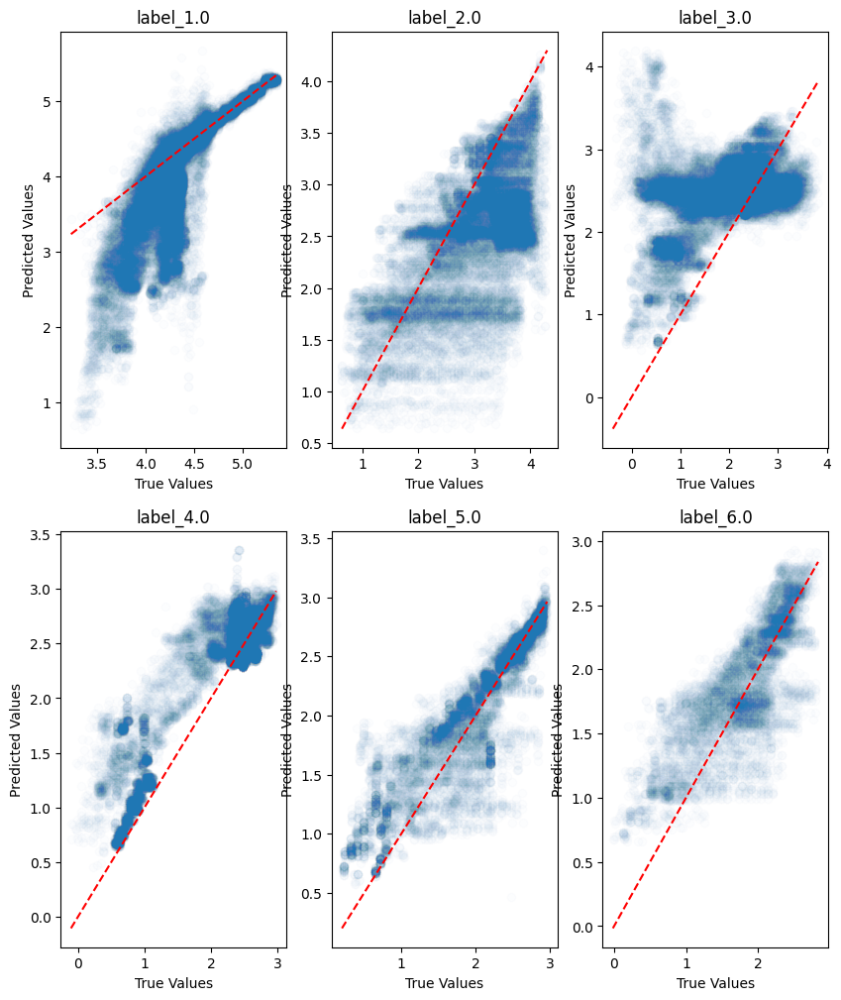

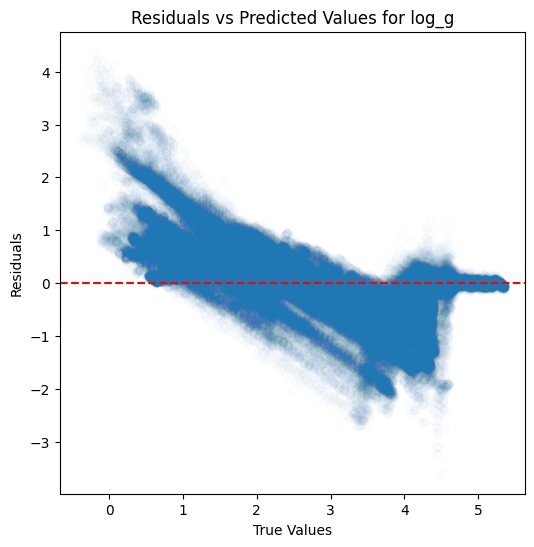

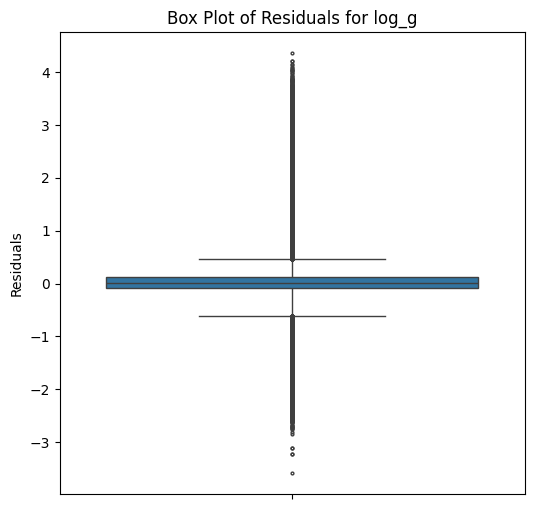

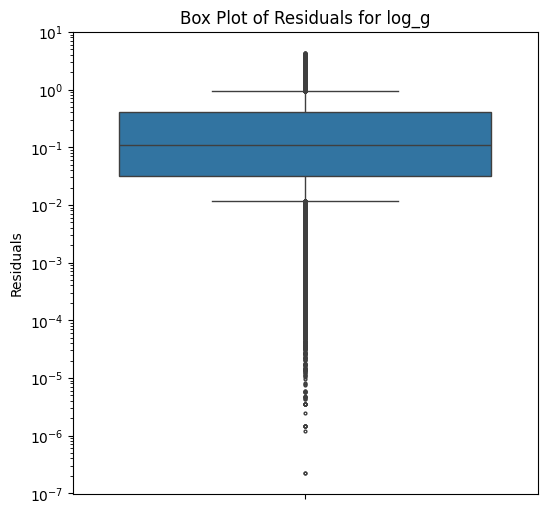

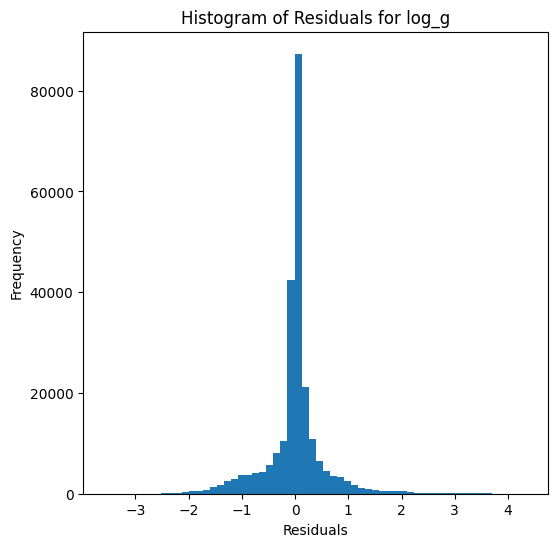

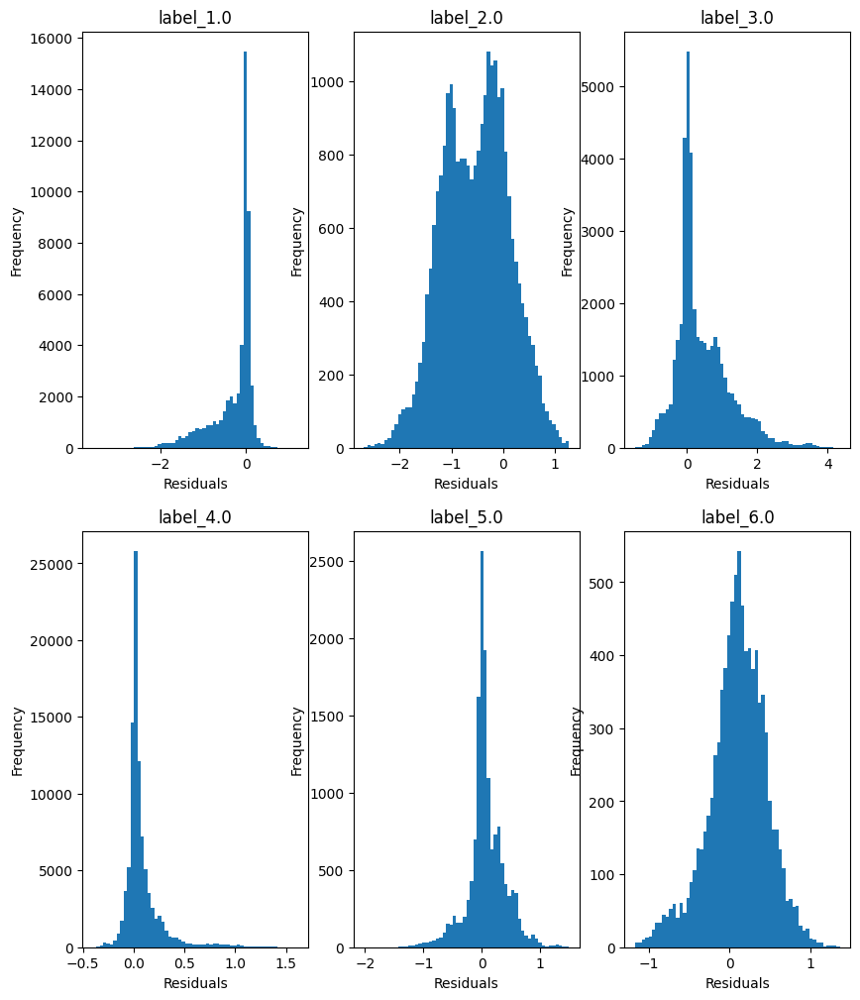

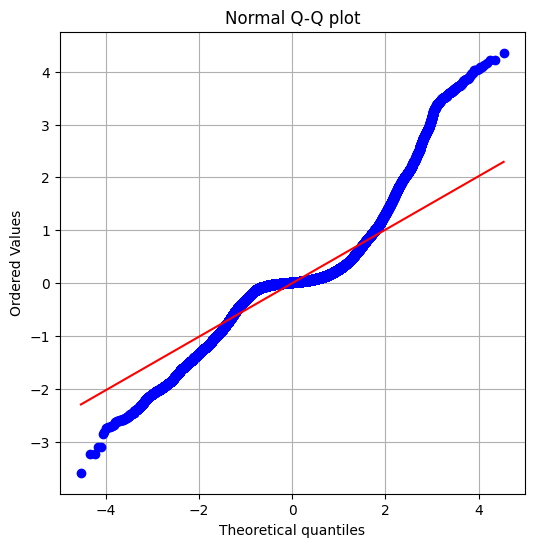

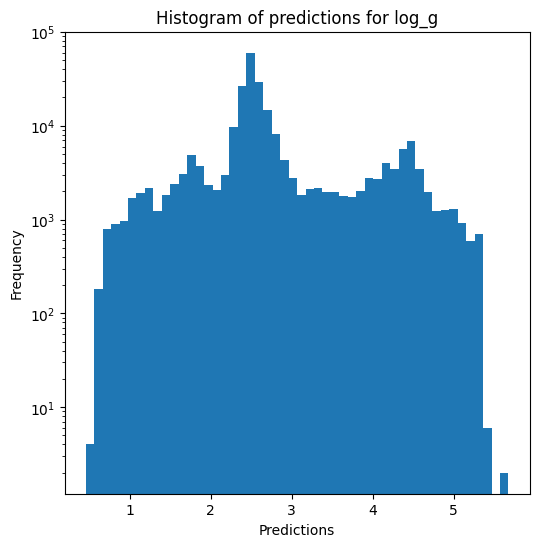

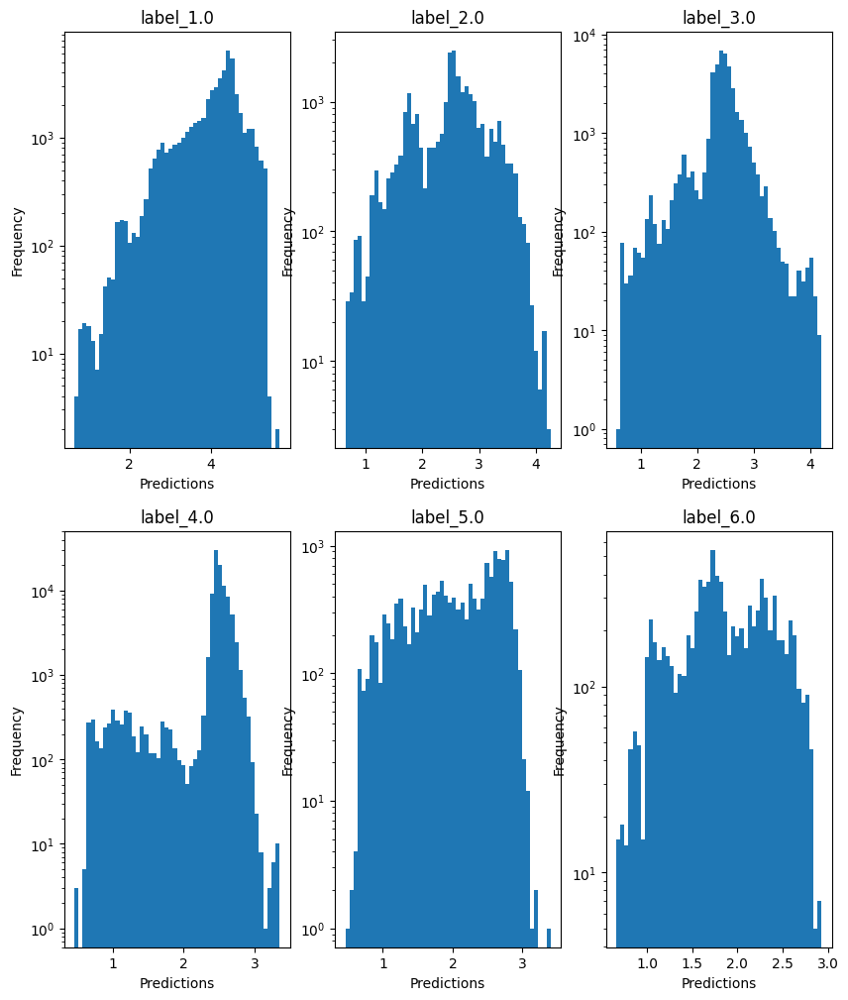


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.5662612193213132
  RMSE :  0.2767403003739343
  MAE :  0.16067151495024773
  MedAE :  0.05116864033877122
  CORR :  0.8825965510893421
  MAX_ER :  1.7067418181404244
  Percentiles : 
    75th percentile :  0.2120421031572626
    90th percentile :  0.515081469024655
    95th percentile :  0.6689247800751339
    99th percentile :  0.9576118802001651

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.6440509775938494
  RMSE :  0.41744405306674026
  MAE :  0.3365678257047855
  MedAE :  0.2929446210015452
  CORR :  0.8027978602985453
  MAX_ER :  1.3726508129754227
  Percentiles : 
    75th percentile :  0.5157462796483268
    90th percentile :  0.6751058382801288
    95th percentile :  0.7715024400169029
    99th percentile :  1.0031695465038724

radius results for the label category with a 

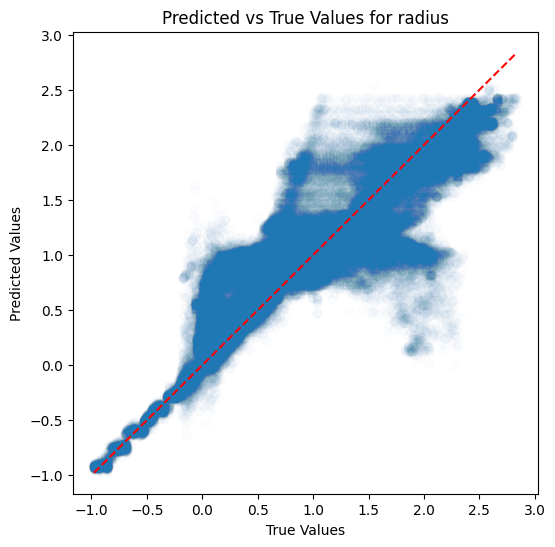

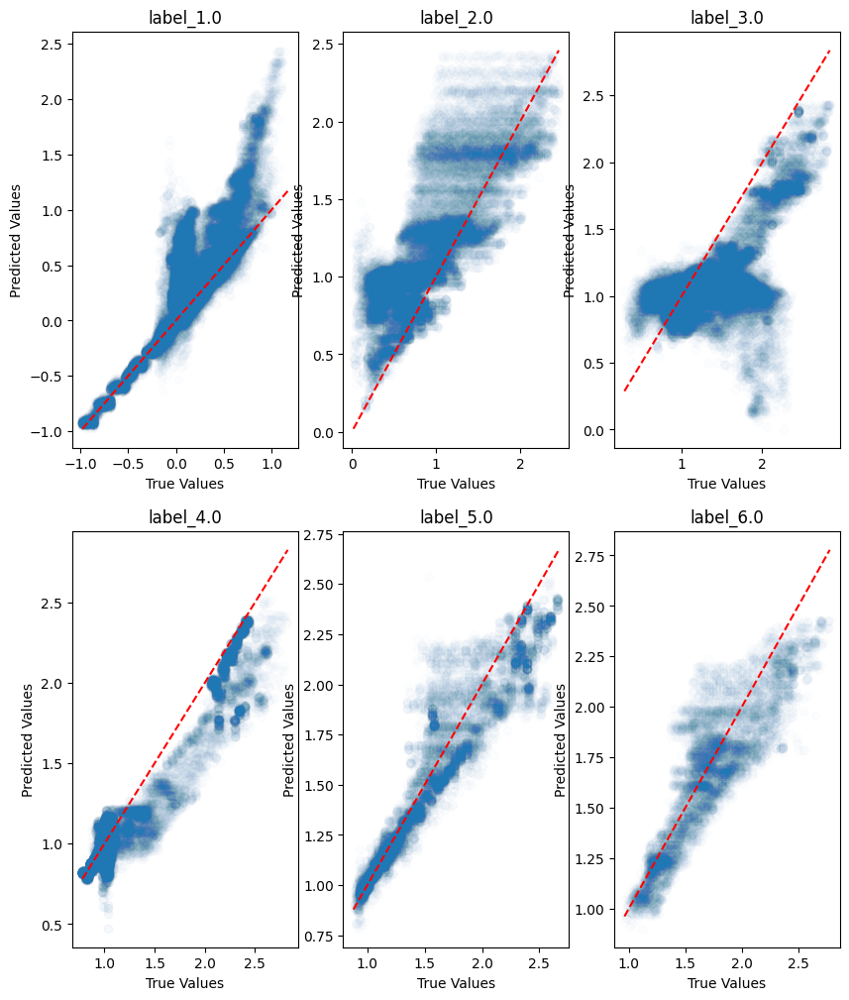

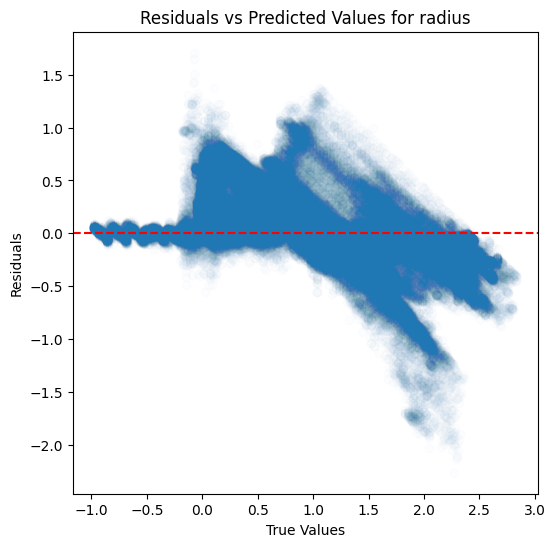

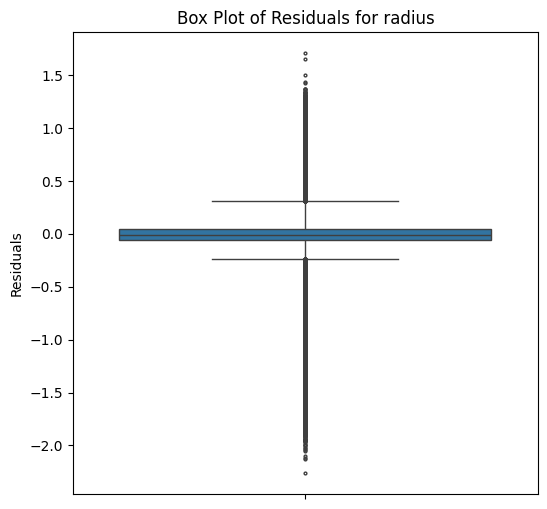

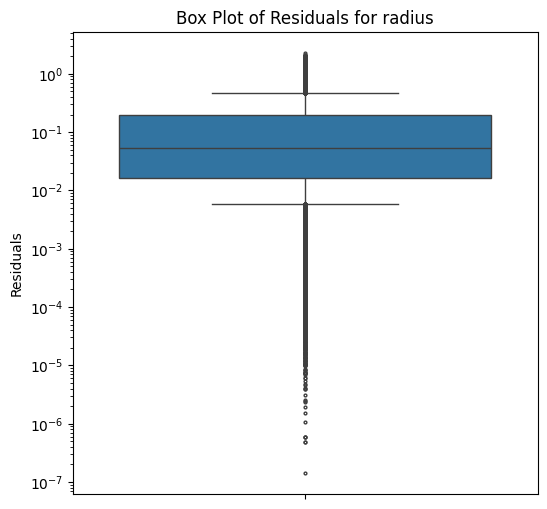

...

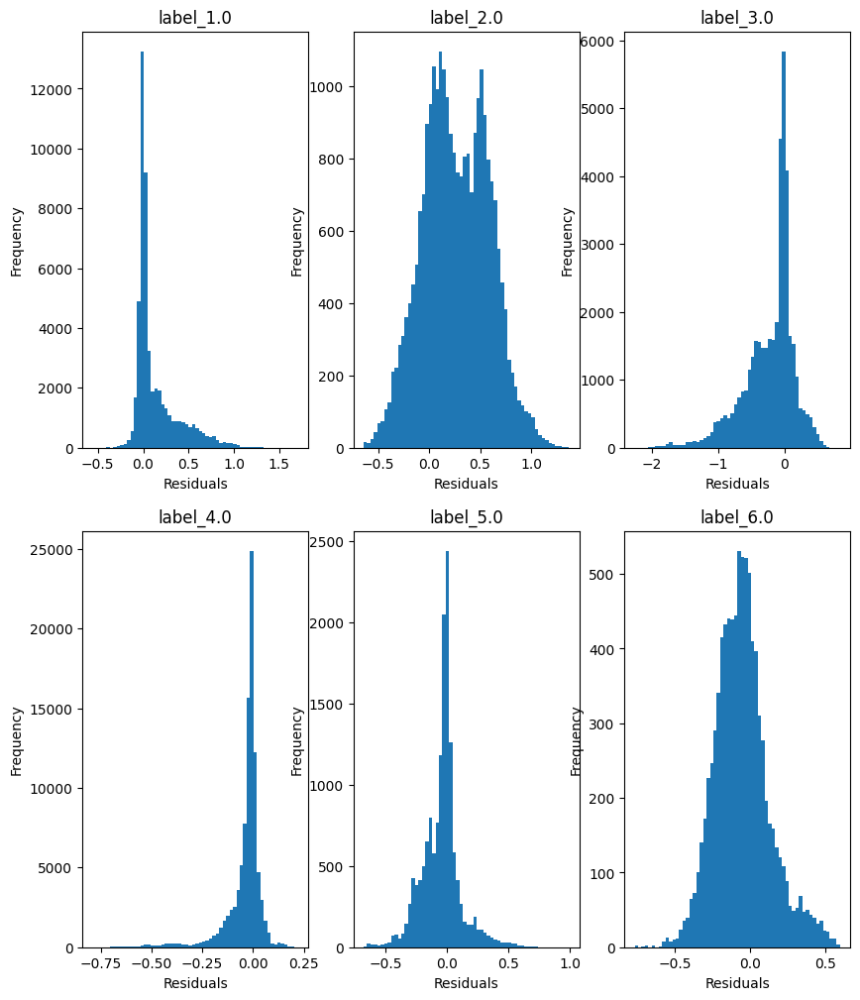

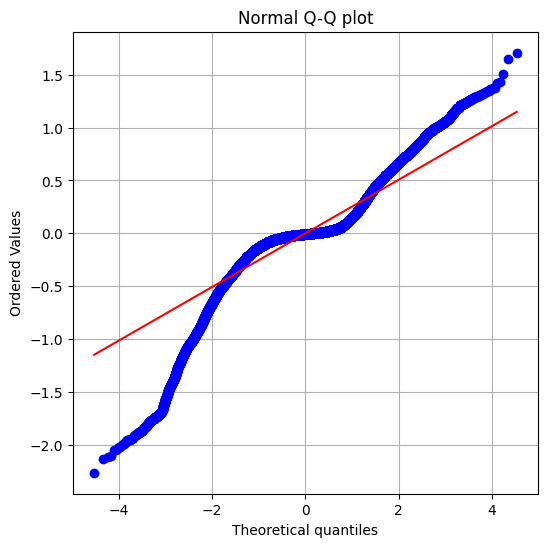

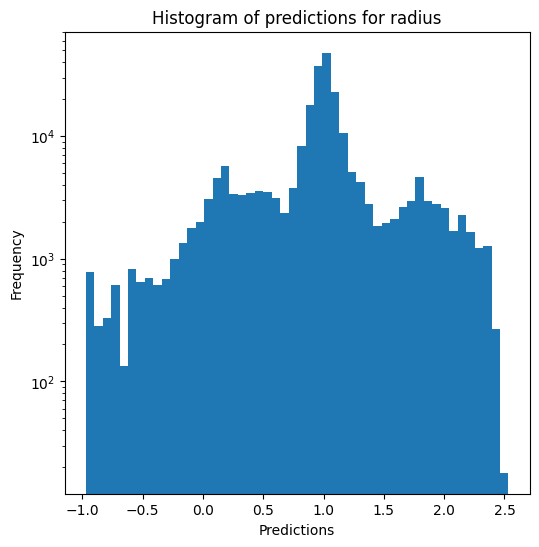

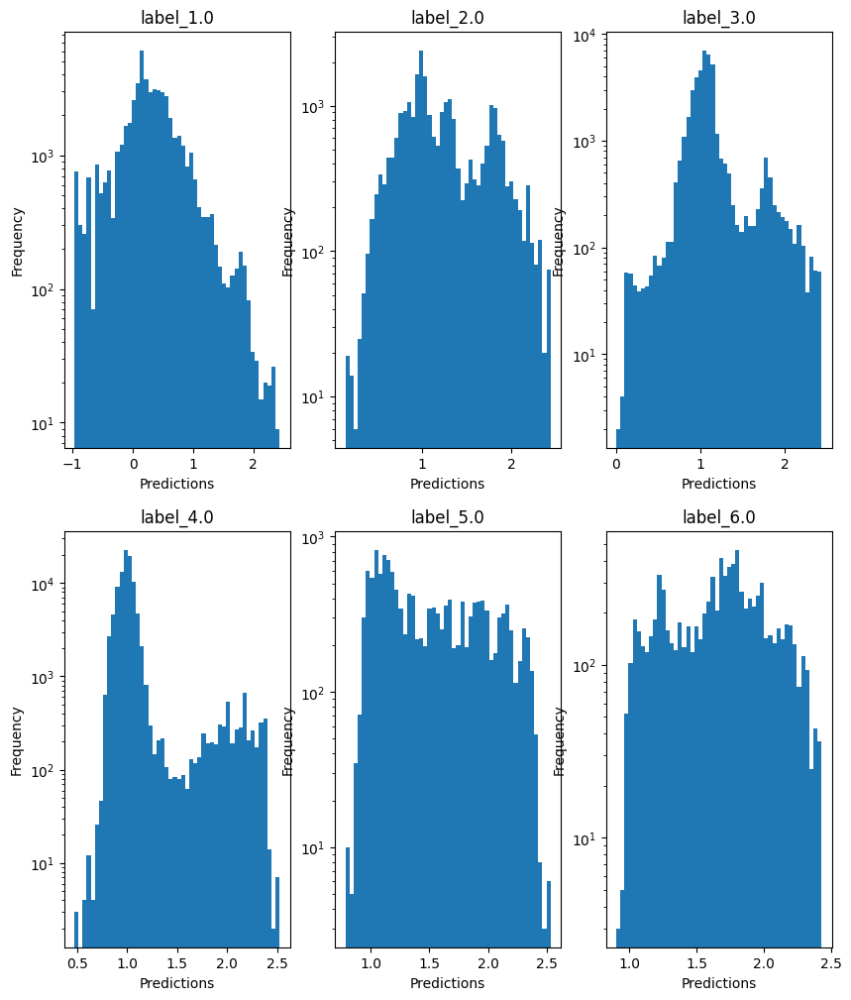

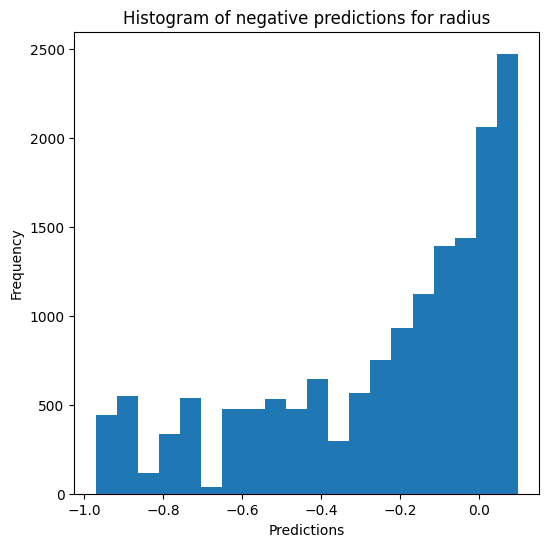

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_robust train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.06943254246187135
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.06976494847696428
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07122771046462559
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07169929328439745
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07221853520516157

Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.8788345073361897
  RMSE :  0.09926107070280635
  MAE :  0.05204691700735242
  MedAE :  0.029249365458868137
  CORR :  0.9380094715777688
  MAX_ER :  0.7204623085089752
  Percentiles : 
    75th percentile :  0.052828984780958876
    90th percentile :  0.0929290273051464
    95th percentile :  0.19542268715218292
    99th percentile :  0.4987669253753006

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.08085632344634686
  RMSE :  0.17527961342938664
  MAE :  0.12721043166393975
  MedAE :  0.08495732740237427
  CORR :  0.363569722366381
  MAX_ER :  0.7219241276969197
  Percentiles : 
    75th percentile :  0.17671854586853986
    90th percentile :  0.30650560151629025
    95th percentile :  0.3910341094801851
    99th percentile :  0.5285751865081272

T_eff results for th

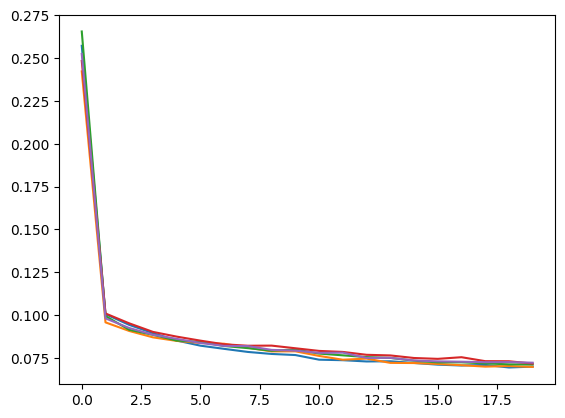

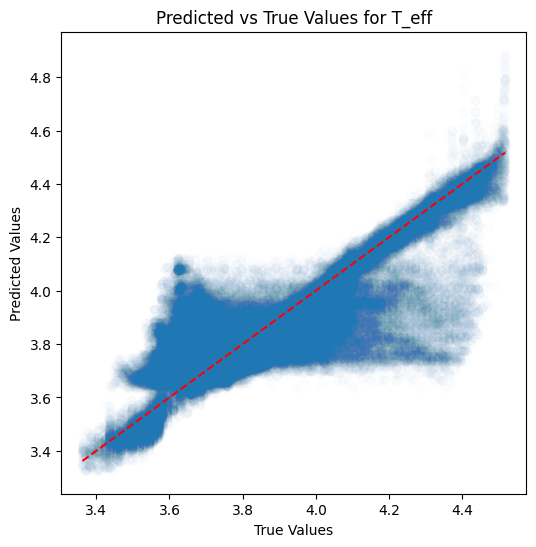

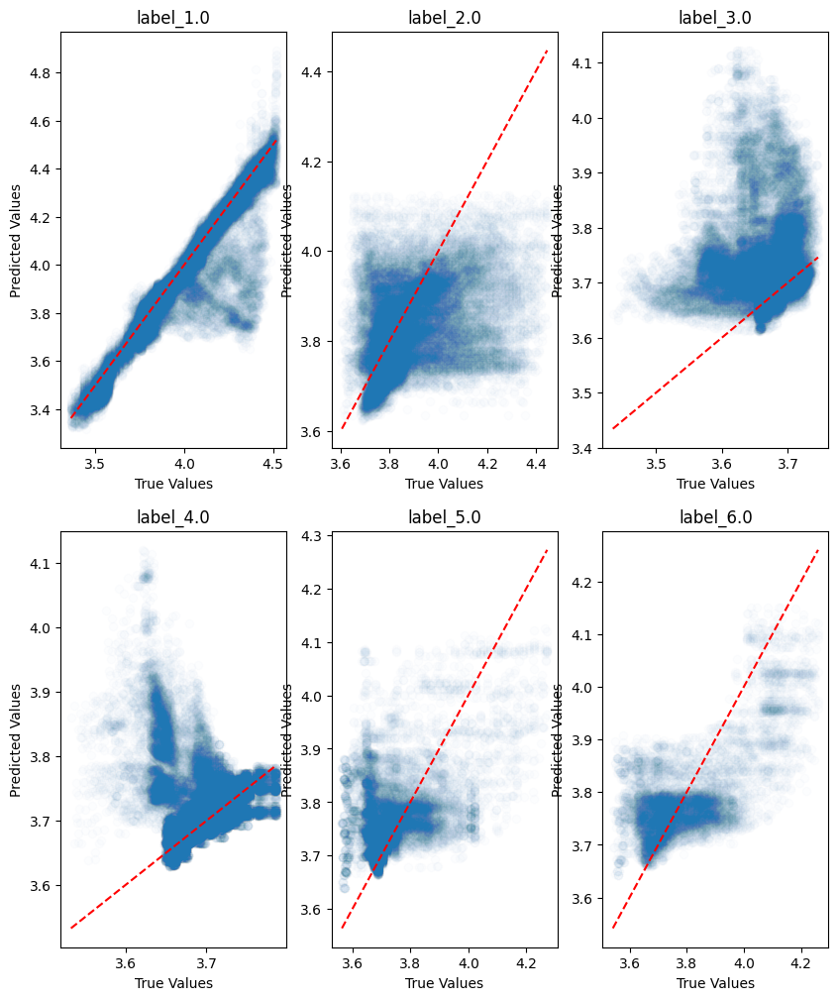

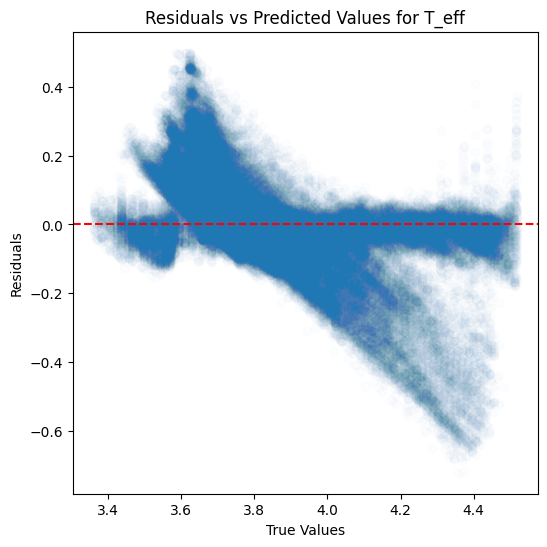

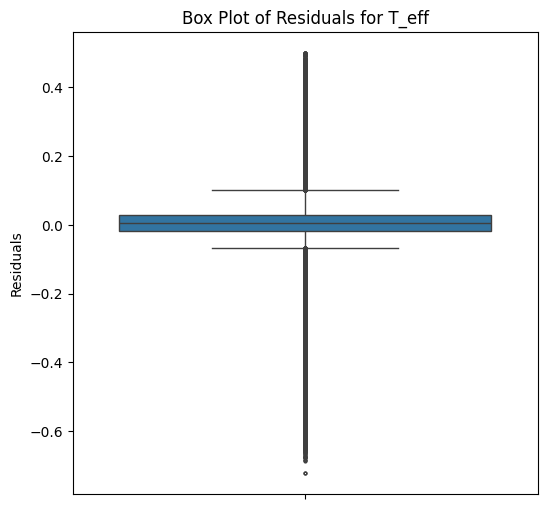

...

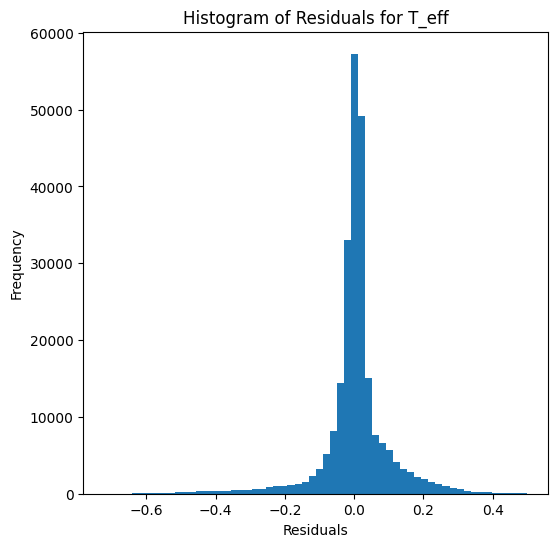

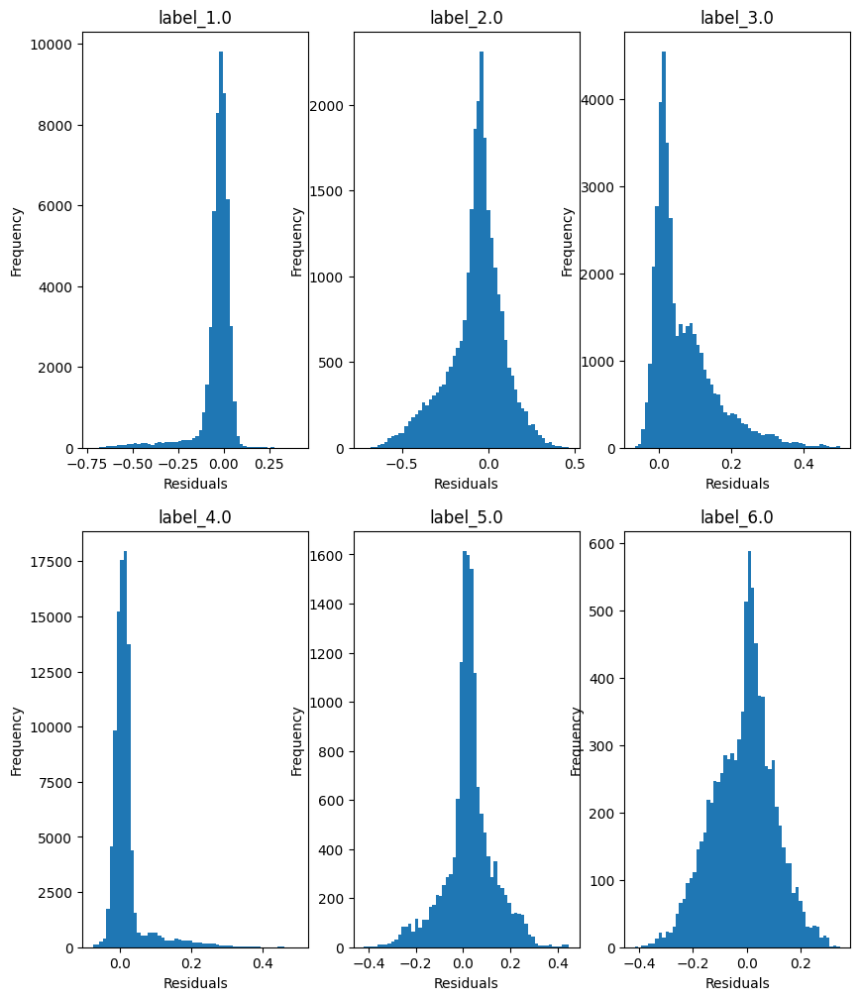

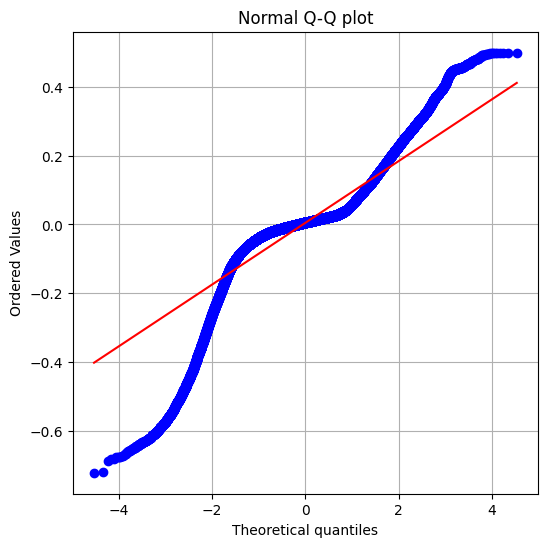

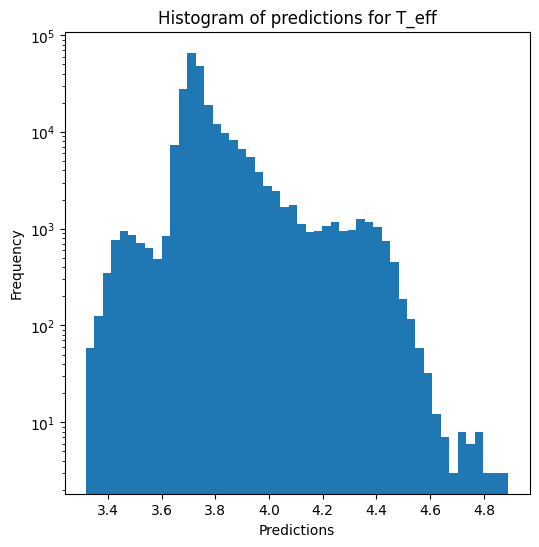

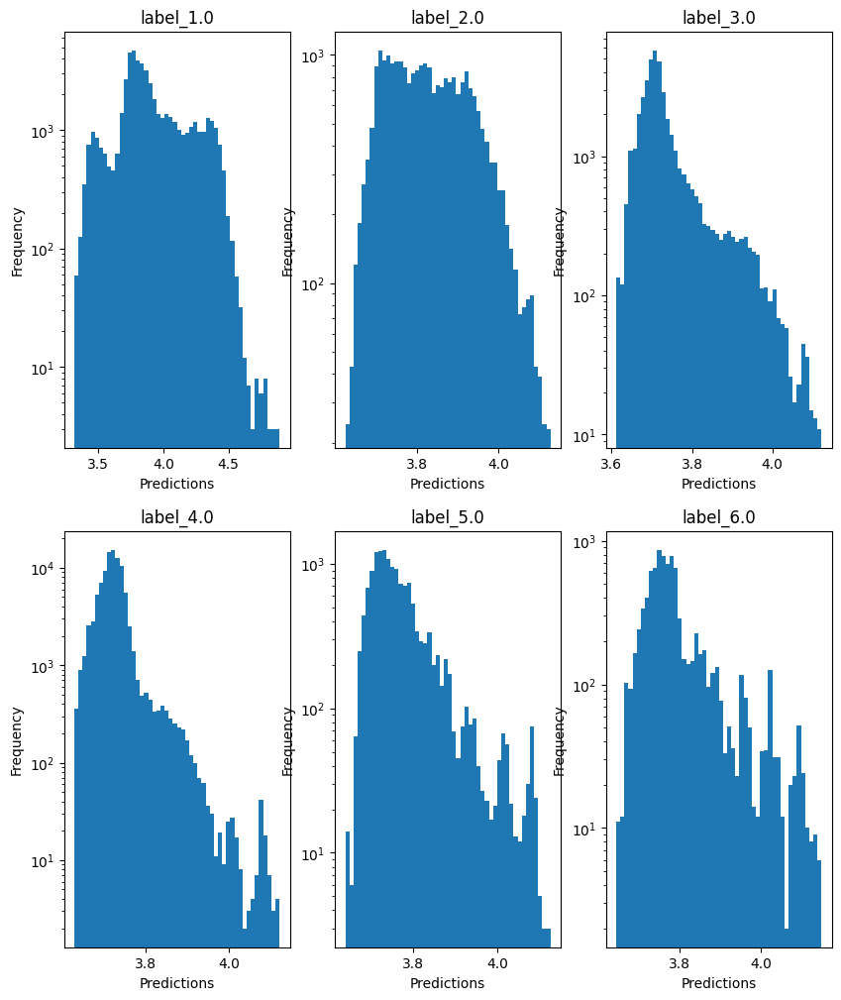

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.7942321526512297
  RMSE :  0.5083299014057626
  MAE :  0.2516712711851103
  MedAE :  0.07271142954701215
  CORR :  0.7549808466533131
  MAX_ER :  2.65876931058866
  Percentiles : 
    75th percentile :  0.16446681013205167
    90th percentile :  0.8084241656088702
    95th percentile :  1.3119704713776947
    99th percentile :  2.077780046281408

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.22694013904331445
  RMSE :  0.8523741166687725
  MAE :  0.6715544907171956
  MedAE :  0.5507222526666561
  CORR :  0.5785004562328788
  MAX_ER :  2.6328326276153815
  Percentiles : 
    75th percentile :  1.0872048943727581
    90th percentile :  1.3591378815070283
    95th percentile :  1.5998680547690467
    99th percentile :  2.1391660476378687

log_g results for the label category with a value of 3.0
  value range :  -0.384 

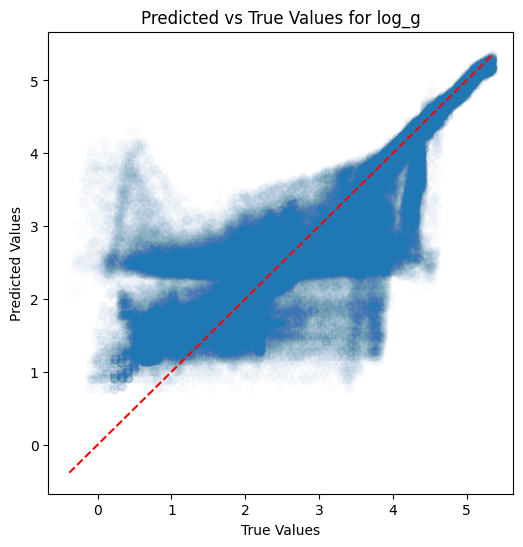

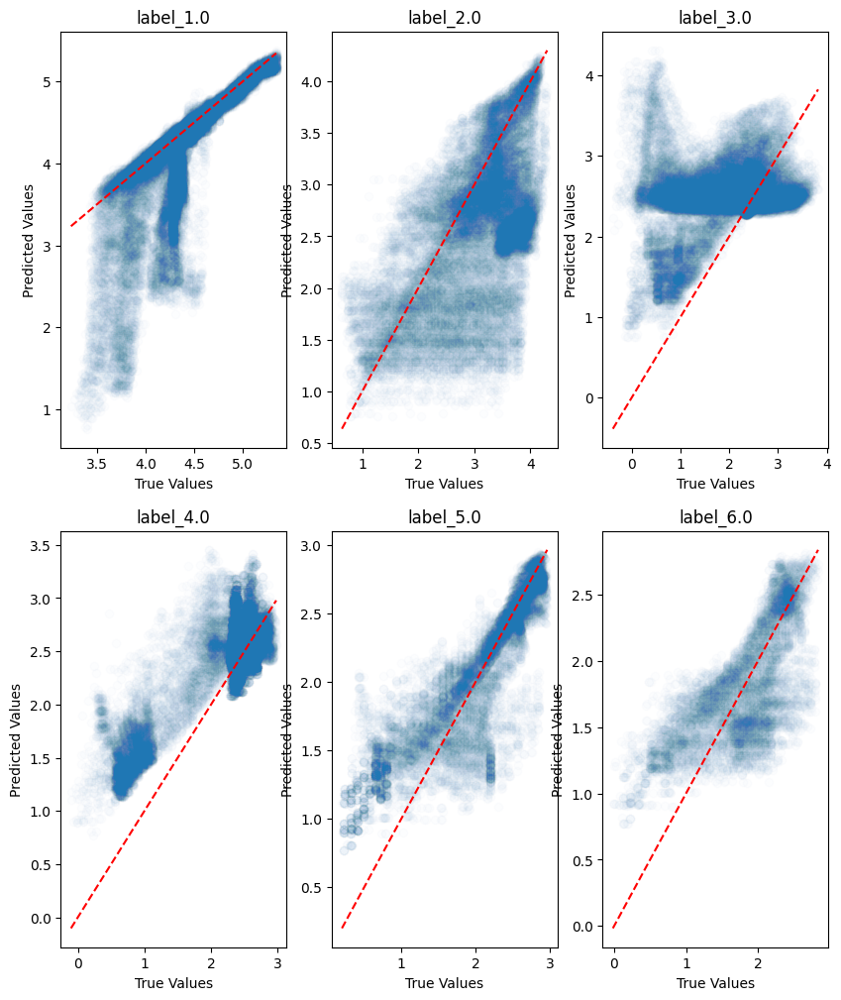

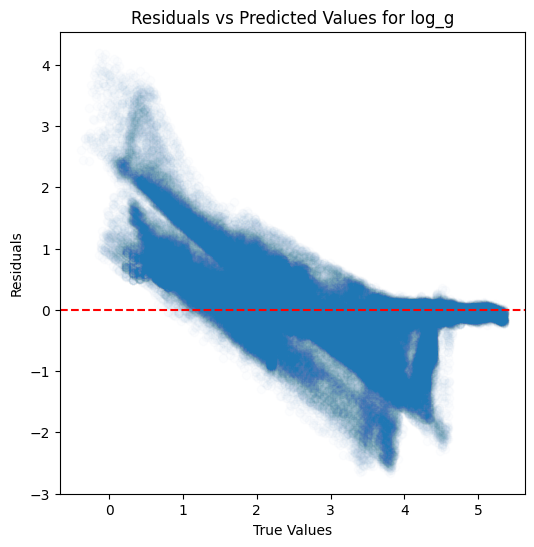

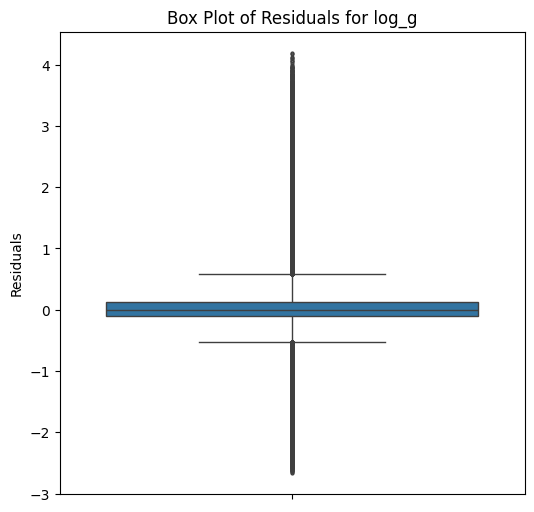

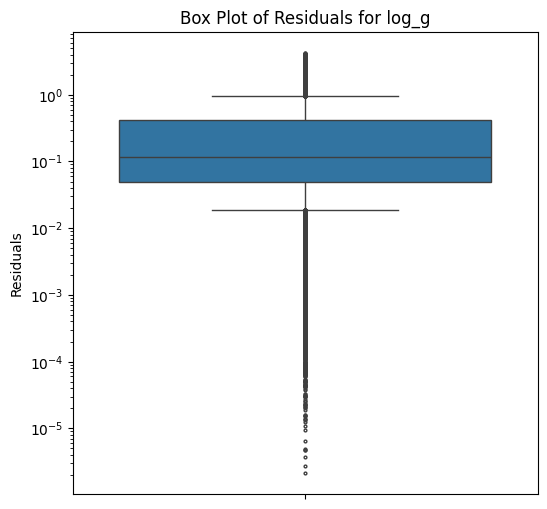

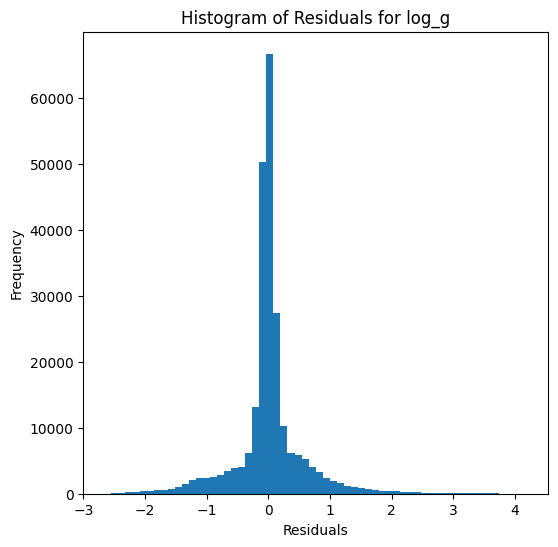

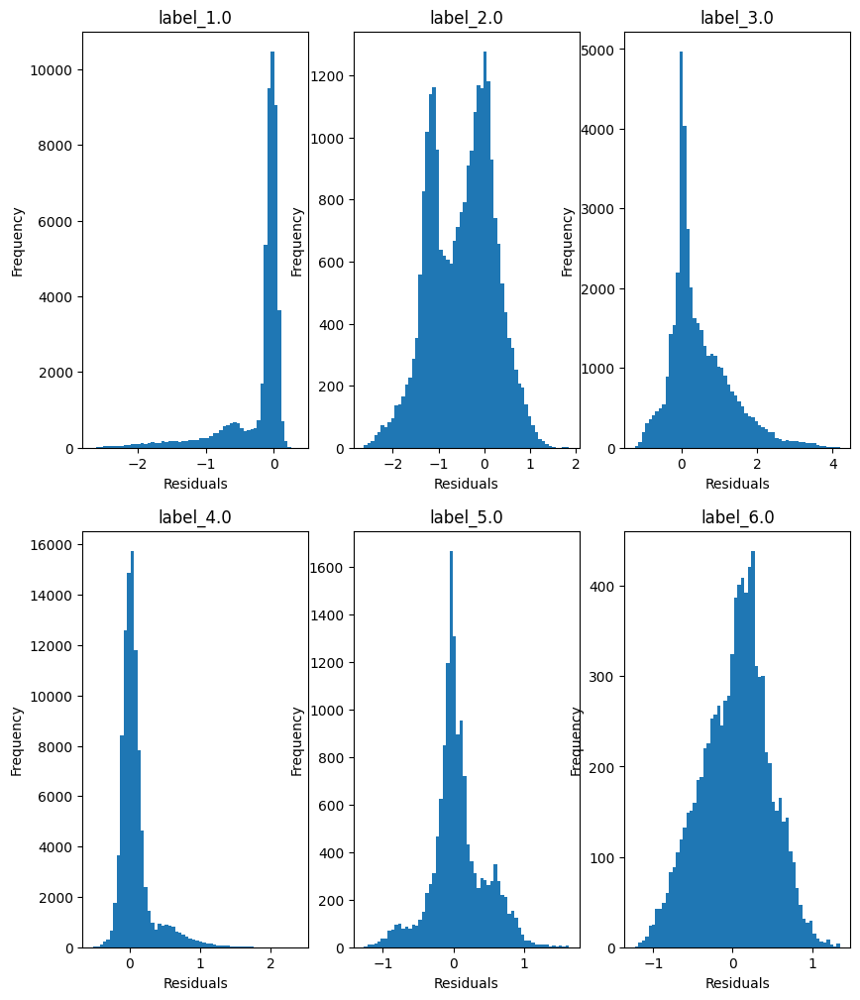

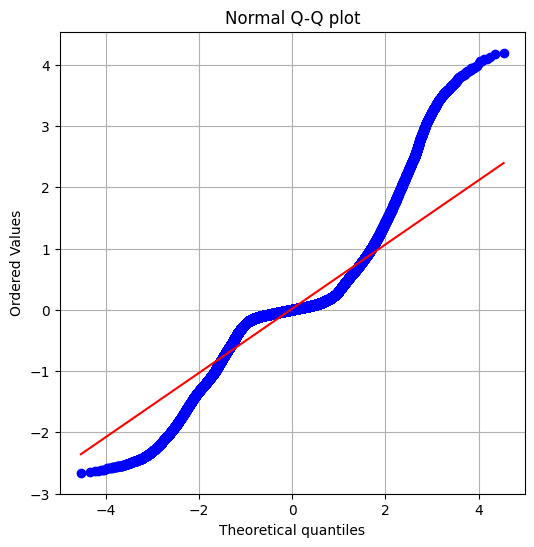

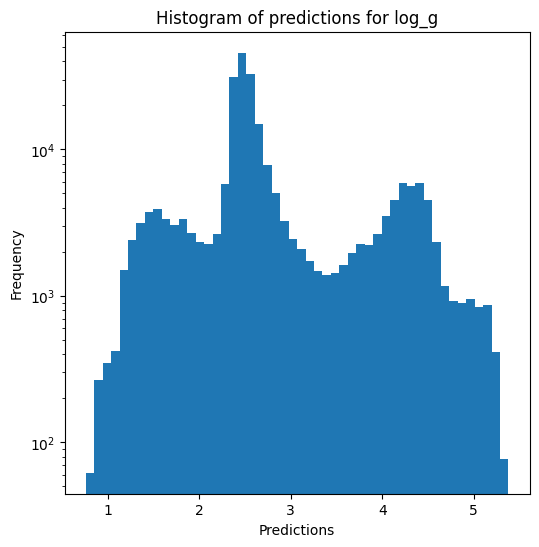

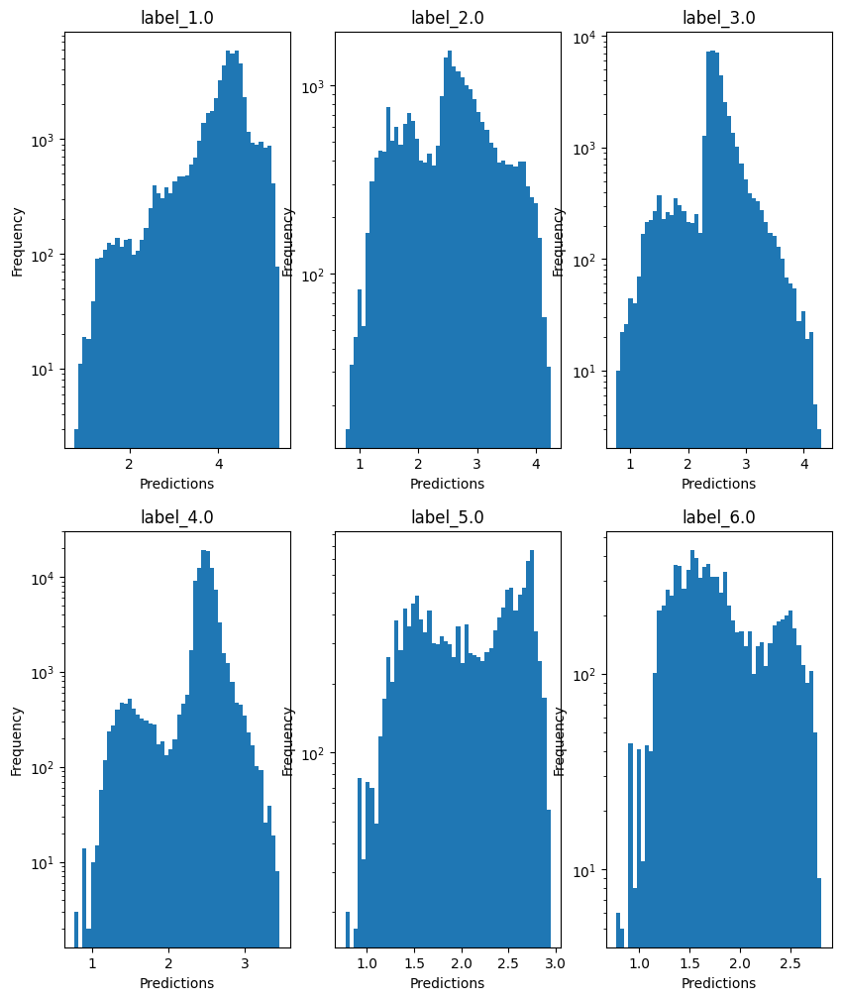


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.5924749489555952
  RMSE :  0.25622780513798393
  MAE :  0.1283439483498214
  MedAE :  0.037326492649340626
  CORR :  0.8790956561834585
  MAX_ER :  1.3175937788282794
  Percentiles : 
    75th percentile :  0.09693050767446837
    90th percentile :  0.4079024704280019
    95th percentile :  0.6635447381756399
    99th percentile :  1.0480922324443604

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5725493030852838
  RMSE :  0.4311129577979764
  MAE :  0.3402399133588076
  MedAE :  0.27745311669704775
  CORR :  0.7728288551061108
  MAX_ER :  1.3054355322929772
  Percentiles : 
    75th percentile :  0.5519296170630399
    90th percentile :  0.6917790622252409
    95th percentile :  0.8072748283679994
    99th percentile :  1.0745167391718373

radius results for the label category with

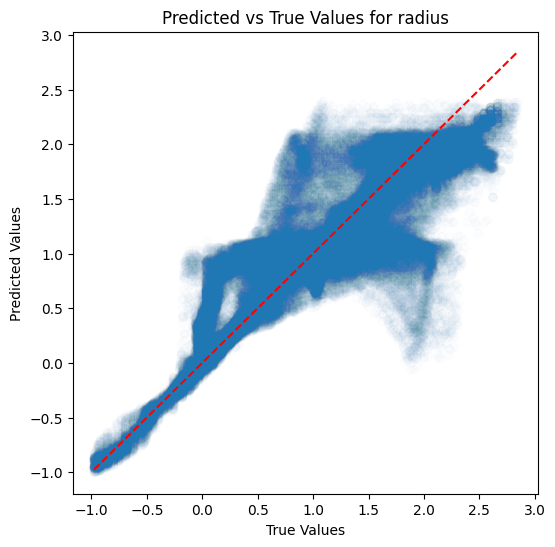

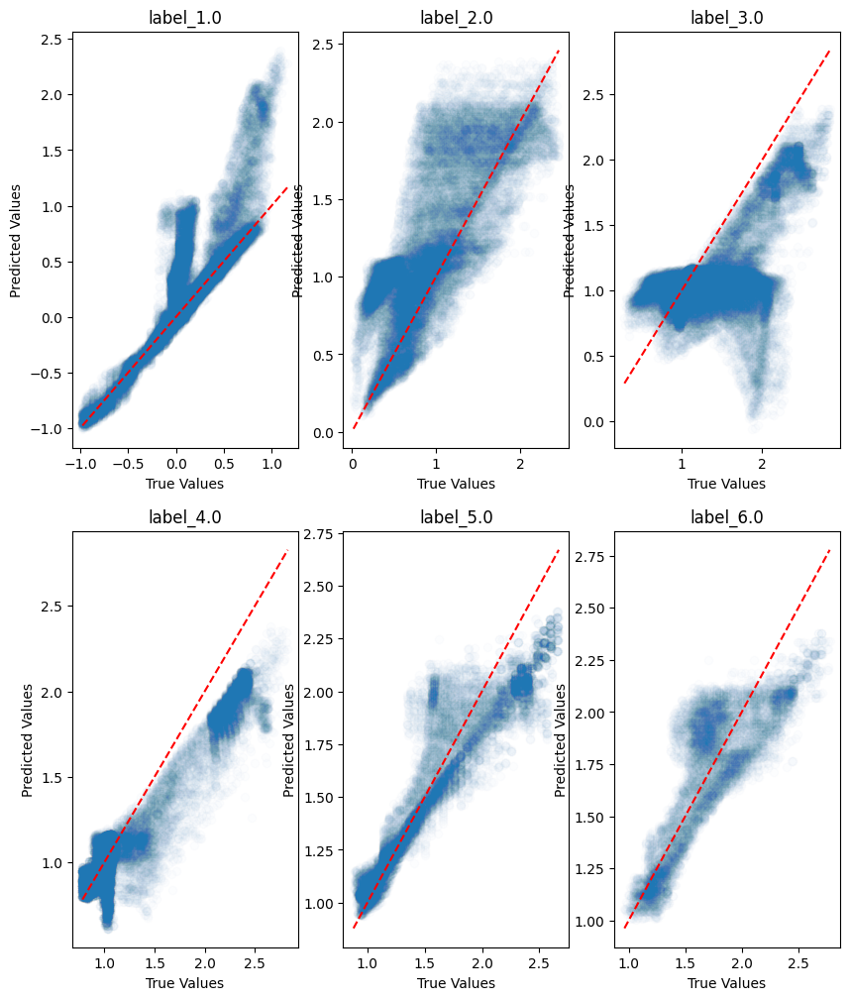

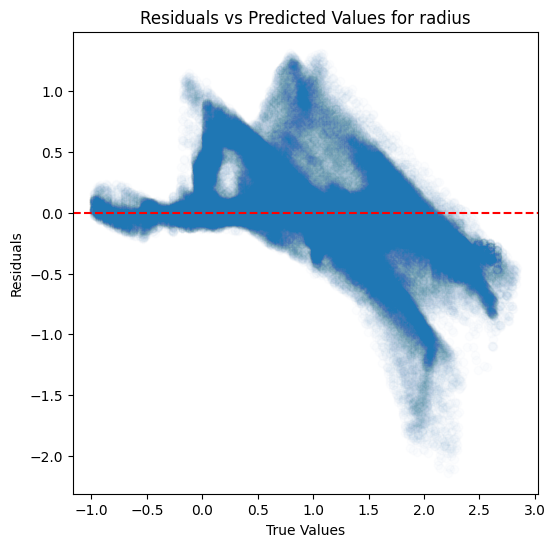

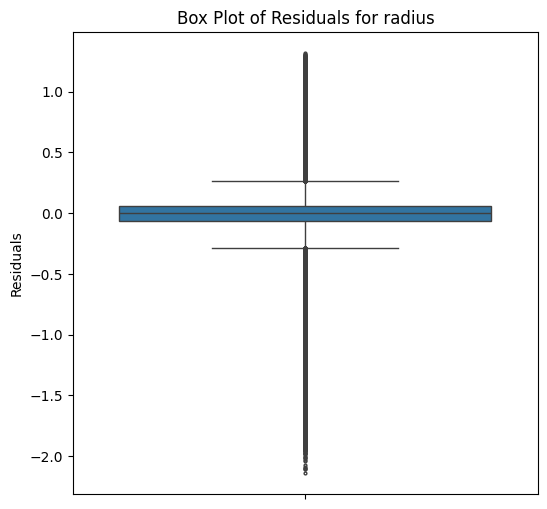

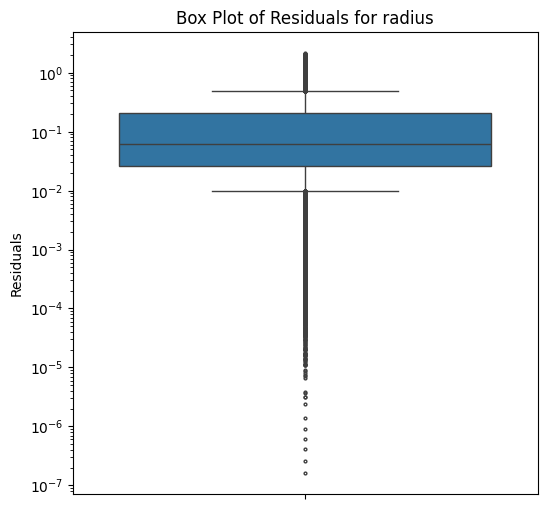

...

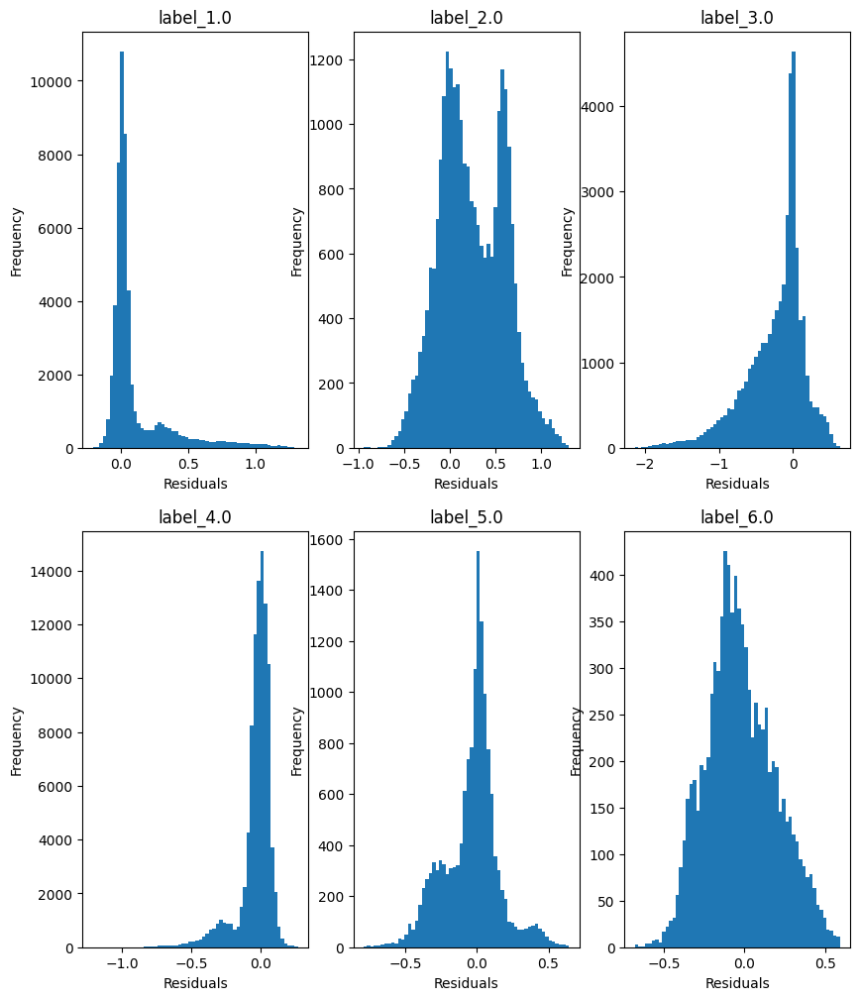

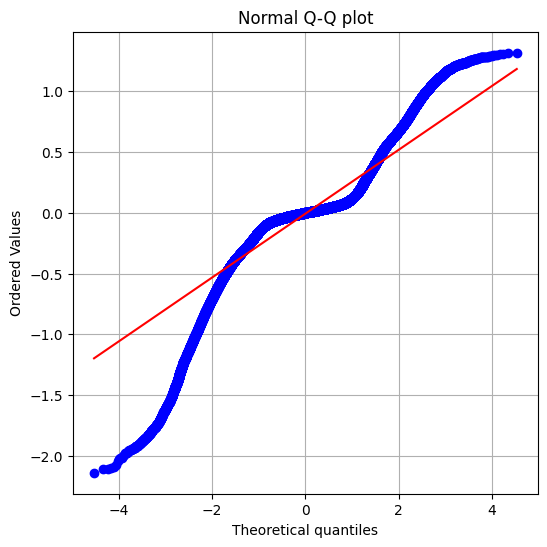

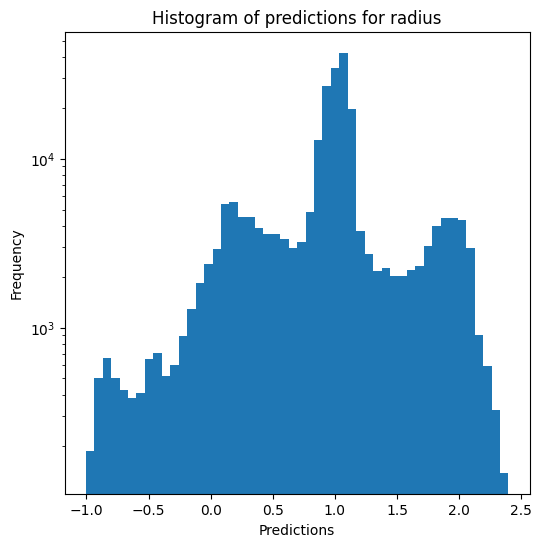

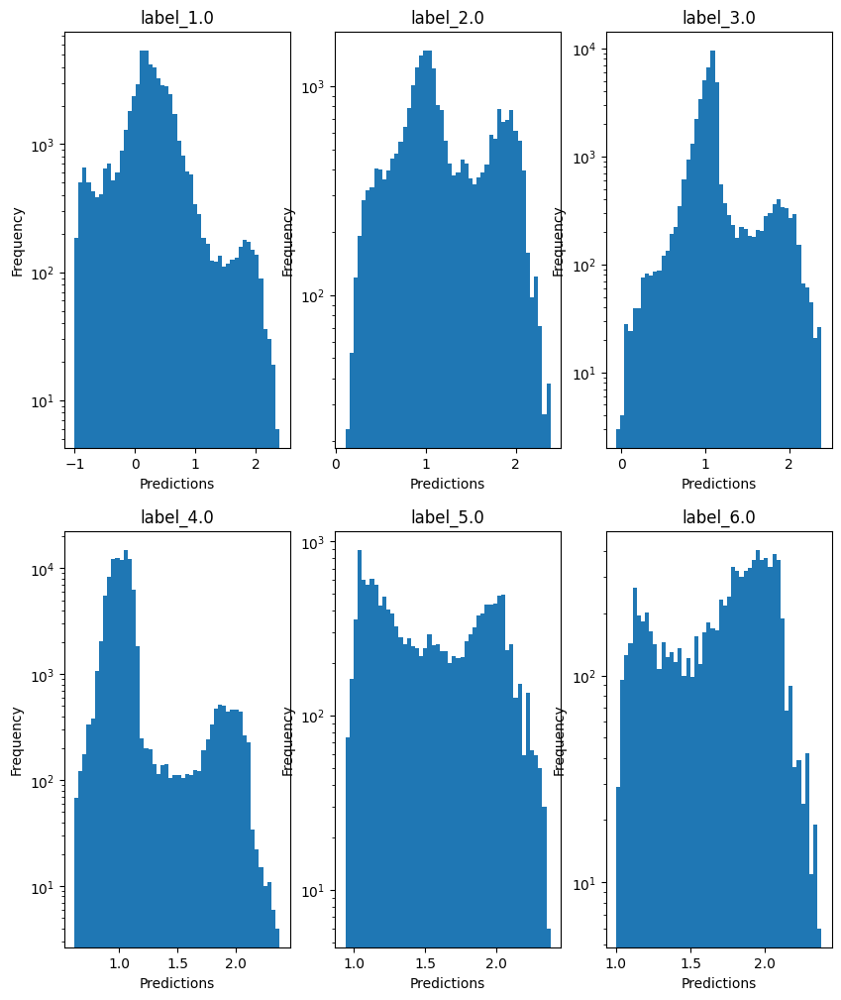

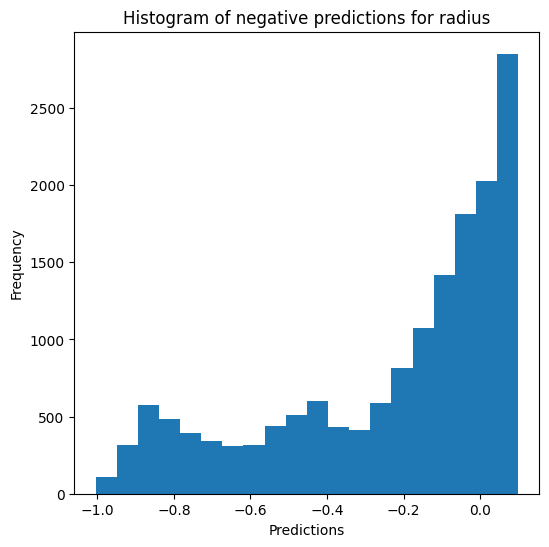

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, scaler_name=scaler_name, show=show,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon